# Classification non-supervisée des armures textiles à partir du modèle YOLOv8

__Code réadapté à partir de différentes sources :__
 - Travail de mémoire de Colin Prudhomme : https://github.com/MightyPotato9/M2_HN/blob/main/notebooks/clustering_forme.ipynb
 - https://medium.com/@alaa99.awehbe/revolutionizing-analysis-feature-extraction-with-yolov8-revealed-0d4ab4a56e26
 - https://github.com/ultralytics/ultralytics/issues/1724 

__Étapes de travail__ :

- _Vector embedding_ : un vecteur pour chaque image, récupération des features d'un réseau de neurones classificateur pour chaque image
- Visualisation dans l'espace : UMAP
- Clustering : HDBSCAN / KMEAN

In [58]:
# Librairies classiques
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

from tqdm import tqdm

In [3]:
# Chargement des images 
from PIL import Image

In [4]:
# Modèle pour embedding
import torch
from ultralytics import YOLO

In [5]:
# Réduction de dimension et clustering
import umap.umap_ as umap
from sklearn.decomposition import PCA

from sklearn.cluster import AgglomerativeClustering, HDBSCAN
from sklearn.cluster import KMeans
import hdbscan

/Users/lise/anaconda3/envs/YOLO_metal/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
cd ../../data

/Users/lise/memoire_tech/M2_HN/data


## Embedding des images

In [7]:
model = YOLO('runs/classify/train_eq_augment_50epoch/weights/best.pt')
model

YOLO(
  (model): ClassificationModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_

In [8]:
#Fonction pour l'embedding des images avec modèle YOLO
# Hook
def hook_fn(module, input, output):
    intermediate_features.append(output)

# Fonction d'extraction des features
def extract_features(model, img, layer_index): ##Avant dernière couche du modèle
    global intermediate_features
    intermediate_features = []
    hook = model.model.model[layer_index].register_forward_hook(hook_fn)
    #print(hook)
    with torch.no_grad():
        model(img)
    hook.remove()
    return intermediate_features[0]  # Premier élément de la liste

In [9]:
# Chemin vers les images
path = 'images/images_jpg'
os.chdir(path)

In [10]:
# Liste contenant les images
textiles = []

# Récupération du nom des images
with os.scandir() as files:
    for file in files:
        if file.name.endswith('.jpg'):  #and not file.name.startswith('MEE')
            #Récupère seulement les images et suppression des maquettes (renseignées par MEE)
            textiles.append(file.name)
print(len(textiles))

3301


In [11]:
data = {}
#Extraction des features pour chaque image
for textile in tqdm(textiles):
    try:
        feat = extract_features(model, textile, layer_index=-2) #On récupère l'avant dernière couche du modèle (vecteur de 1 par 256)
        print(feat.size())
        data[textile] = feat
    except:
        pass

  0%|                                                  | 0/3301 [00:00<?, ?it/s]


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML029_IMG_3583.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.14, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 98.9ms
Speed: 30.2ms preprocess, 98.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
  0%|                                        | 1/3301 [00:01<1:25:00,  1.55s/it]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4669.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 20.5ms
Speed: 6.3ms preprocess, 20.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3986.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 24.9ms
Speed: 5.7ms preprocess, 24.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF036_IMG_1903.jpg: 224x224 Warpfacedcloth 0.83, Mesh 0.16, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 4.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


  0%|                                          | 4/3301 [00:01<17:59,  3.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM007_IMG_0480.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 4.2ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA017_IMG_2662.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 4.1ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA081_IMG_7205.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.03, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  0%|                                          | 8/3301 [00:01<08:09,  6.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6813.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF034_IMG_1887.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.05, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.8ms
Speed: 4.3ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF063_IMG_2588.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 16.8ms
Speed: 4.3ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


  0%|▏                                        | 11/3301 [00:01<05:41,  9.63it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA093_IMG_7358.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF001_IMG_1735.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.03, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML072_IMG_3881.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  0%|▏                                        | 15/3301 [00:02<03:56, 13.92it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA082_IMG_8198.jpg: 224x224 Mesh 0.94, Warpfacedcloth 0.05, Balancedweave 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7810.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7804.jpg: 224x224 Warpfacedcloth 0.92, Balancedweave 0.06, Weftfacedcloth 0.02, Mesh 0.00, Mixedweave 0.00, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  1%|▏                                        | 19/3301 [00:02<03:05, 17.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML013.2_IMG_3259.jpg: 224x224 Mixedweave 0.97, Warpfacedcloth 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3979.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA020_IMG_7002.jpg: 224x224 Warpfacedcloth 0.97, Balancedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

  1%|▎                                        | 23/3301 [00:02<02:35, 21.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF040_IMG_1928.jpg: 224x224 Weftfacedcloth 0.65, Mixedweave 0.20, Warpfacedcloth 0.16, Balancedweave 0.00, Mesh 0.00, 14.9ms
Speed: 3.9ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE044B_IMG_7538.jpg: 224x224 Mixedweave 0.46, Weftfacedcloth 0.43, Warpfacedcloth 0.11, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.6ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7370.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.4ms
Speed: 4.2ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  1%|▎                                        | 27/3301 [00:02<02:17, 23.89it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6534.jpg: 224x224 Mixedweave 0.91, Warpfacedcloth 0.09, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.9ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML111_IMG_4483.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML071_IMG_3862.jpg: 224x224 Mixedweave 0.75, Warpfacedcloth 0.17, Weftfacedcloth 0.07, Balancedweave 0.01, Mesh 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  1%|▍                                        | 31/3301 [00:02<02:05, 26.02it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF019_IMG_1747.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7364.jpg: 224x224 Warpfacedcloth 0.66, Weftfacedcloth 0.26, Mesh 0.05, Balancedweave 0.02, Mixedweave 0.01, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML118_IMG_4567.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  1%|▍                                        | 35/3301 [00:02<01:53, 28.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML033_IMG_3449.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2543.jpg: 224x224 Mixedweave 0.48, Warpfacedcloth 0.34, Weftfacedcloth 0.18, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4513.jpg: 224x224 Mixedweave 0.70, Warpfacedcloth 0.21, Weftfacedcloth 0.06, Balancedweave 0.04, Mesh 0.00, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  1%|▍                                        | 39/3301 [00:02<01:49, 29.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML128_IMG_6605.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML016_IMG_3277.jpg: 224x224 Weftfacedcloth 0.94, Mixedweave 0.06, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.8ms
Speed: 4.3ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF010_IMG_1660.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  1%|▌                                        | 43/3301 [00:02<01:47, 30.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF065_IMG_2606.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF016_IMG_1713.jpg: 224x224 Mesh 0.94, Weftfacedcloth 0.06, Mixedweave 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.8ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6727.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  1%|▌                                        | 47/3301 [00:03<01:45, 30.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE052_IMG_8075.jpg: 224x224 Warpfacedcloth 0.62, Mesh 0.24, Weftfacedcloth 0.12, Balancedweave 0.01, Mixedweave 0.01, 14.1ms
Speed: 4.2ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM019_IMG_0542.jpg: 224x224 Warpfacedcloth 0.93, Mixedweave 0.07, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML035_IMG_3466.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 15.6ms
Speed: 4.1ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  2%|▋                                        | 51/3301 [00:03<01:45, 30.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE063A_IMG_7432.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF035_IMG_1894.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.05, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.1ms
Speed: 3.7ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF059_IMG_2071.jpg: 224x224 Mesh 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.7ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  2%|▋                                        | 55/3301 [00:03<01:45, 30.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3892.jpg: 224x224 Mixedweave 0.67, Weftfacedcloth 0.21, Warpfacedcloth 0.12, Balancedweave 0.00, Mesh 0.00, 15.5ms
Speed: 3.8ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML141_IMG_6714.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.8ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF059_IMG_2065.jpg: 224x224 Mixedweave 0.70, Weftfacedcloth 0.25, Warpfacedcloth 0.05, Mesh 0.00, Balancedweave 0.00, 16.9ms
Speed: 3.8ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  2%|▋                                        | 59/3301 [00:03<01:50, 29.45it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA092_IMG_8551.jpg: 224x224 Weftfacedcloth 0.99, Warpfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 13.7ms
Speed: 4.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML056_IMG_3706.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2564.jpg: 224x224 Warpfacedcloth 0.99, Balancedweave 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  2%|▊                                        | 63/3301 [00:03<01:47, 30.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA001_IMG_7616.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA002_IMG_4931.jpg: 224x224 Weftfacedcloth 0.98, Warpfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE009A_IMG_7136.jpg: 224x224 Mesh 0.80, Warpfacedcloth 0.19, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  2%|▊                                        | 67/3301 [00:03<01:45, 30.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA021_IMG_7011.jpg: 224x224 Weftfacedcloth 0.80, Warpfacedcloth 0.15, Balancedweave 0.03, Mesh 0.01, Mixedweave 0.01, 15.1ms
Speed: 4.3ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3649.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML054_IMG_3696.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.8ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  2%|▉                                        | 71/3301 [00:03<01:44, 30.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7319.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR019_SR_IMG_6149.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML119_IMG_4574.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

  2%|▉                                        | 75/3301 [00:03<01:46, 30.32it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM028_IMG_4770.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 4.2ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6797.jpg: 224x224 Warpfacedcloth 0.79, Mixedweave 0.15, Mesh 0.06, Weftfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM028_IMG_4764.jpg: 224x224 Warpfacedcloth 0.79, Mesh 0.20, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.5ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  2%|▉                                        | 79/3301 [00:04<01:45, 30.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7636.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF072_IMG_6254.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 15.5ms
Speed: 3.5ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA054_SR_IMG_2377.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

  3%|█                                        | 83/3301 [00:04<01:45, 30.46it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA039_IMG_7088.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.04, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML098_IMG_4321.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 16.1ms
Speed: 3.7ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML129_IMG_6616.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.04, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  3%|█                                        | 87/3301 [00:04<01:43, 31.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF011_IMG_1667.jpg: 224x224 Warpfacedcloth 0.51, Mesh 0.45, Weftfacedcloth 0.04, Mixedweave 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF049_IMG_1990.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF094_IMG_6382.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  3%|█▏                                       | 91/3301 [00:04<01:40, 31.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA036_IMG_2314.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.04, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 4.1ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF105_IMG_8523.jpg: 224x224 Weftfacedcloth 0.49, Warpfacedcloth 0.47, Mixedweave 0.04, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE061_IMG_7997.jpg: 224x224 Warpfacedcloth 0.66, Mixedweave 0.28, Weftfacedcloth 0.04, Mesh 0.01, Balancedweave 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  3%|█▏                                       | 95/3301 [00:04<01:38, 32.68it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML082_IMG_4016.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 16.0ms
Speed: 3.7ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF105_IMG_8522.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML044_IMG_3560_1.jpg: 224x224 Weftfacedcloth 0.94, Mixedweave 0.06, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

  3%|█▏                                       | 99/3301 [00:04<01:37, 32.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE061_IMG_7996.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.0ms
Speed: 8.2ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE082A_IMG_8481.jpg: 224x224 Warpfacedcloth 0.89, Weftfacedcloth 0.09, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA036_IMG_2315.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  3%|█▏                                      | 103/3301 [00:04<01:38, 32.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF049_IMG_1991.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.3_IMG_4187.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.9ms
Speed: 4.0ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML129_IMG_6617.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.5ms
Speed: 3.3ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

  3%|█▎                                      | 107/3301 [00:04<01:37, 32.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML136_IMG_6659.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.29, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.3_IMG_4193.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.3ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML140_IMG_6699.jpg: 224x224 Warpfacedcloth 0.87, Mesh 0.07, Weftfacedcloth 0.05, Mixedweave 0.01, Balancedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

  3%|█▎                                      | 111/3301 [00:05<01:36, 33.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles5_003.jpg: 224x224 Weftfacedcloth 0.95, Warpfacedcloth 0.03, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 13.2ms
Speed: 3.3ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF061_IMG_2551.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7637.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise

  3%|█▍                                      | 115/3301 [00:05<01:38, 32.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE043B_IMG_7529.jpg: 224x224 Mixedweave 0.96, Weftfacedcloth 0.03, Warpfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 16.6ms
Speed: 3.4ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML128_IMG_6599.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA039_IMG_7089.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 4.5ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

  4%|█▍                                      | 119/3301 [00:05<01:40, 31.75it/s]

torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM028_IMG_4771.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7623.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM023_IMG_4711.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  4%|█▌                                      | 124/3301 [00:05<01:33, 34.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA095_IMG_7376.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA018_IMG_2211.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 16.7ms
Speed: 3.5ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML119_IMG_4575.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  4%|█▌                                      | 128/3301 [00:05<01:36, 33.00it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA026_IMG_7951.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.09, Mesh 0.03, Weftfacedcloth 0.02, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE023_IMG_2837.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3648.jpg: 224x224 Balancedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  4%|█▌                                      | 132/3301 [00:05<01:36, 32.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7318.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA018_IMG_6990.jpg: 224x224 Weftfacedcloth 0.84, Balancedweave 0.11, Warpfacedcloth 0.05, Mixedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML054_IMG_3697.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  4%|█▋                                      | 136/3301 [00:05<01:36, 32.70it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA038_IMG_7887.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2559.jpg: 224x224 Weftfacedcloth 0.90, Mixedweave 0.08, Warpfacedcloth 0.01, Mesh 0.01, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA021_IMG_7010.jpg: 224x224 Warpfacedcloth 0.51, Mesh 0.49, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

  4%|█▋                                      | 140/3301 [00:05<01:33, 33.70it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA001_IMG_7617.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2571.jpg: 224x224 Mixedweave 0.72, Warpfacedcloth 0.28, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM006_IMG_0451.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  4%|█▋                                      | 144/3301 [00:06<01:36, 32.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA092_IMG_8550.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2565.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA096_IMG_7395.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  4%|█▊                                      | 148/3301 [00:06<01:35, 33.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA035_IMG_2309.jpg: 224x224 Mixedweave 0.68, Weftfacedcloth 0.27, Warpfacedcloth 0.05, Mesh 0.01, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2268.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA009_IMG_7715.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  5%|█▊                                      | 152/3301 [00:06<01:31, 34.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR025_SR_IMG_6216.2.jpg: 224x224 Warpfacedcloth 0.79, Mesh 0.15, Mixedweave 0.06, Weftfacedcloth 0.00, Balancedweave 0.00, 11.5ms
Speed: 4.3ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML035_IMG_3467.jpg: 224x224 Mixedweave 0.42, Warpfacedcloth 0.32, Weftfacedcloth 0.26, Mesh 0.00, Balancedweave 0.00, 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042A_IMG_7498.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.04, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lis

  5%|█▉                                      | 157/3301 [00:06<01:23, 37.54it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA010_IMG_5822.jpg: 224x224 Warpfacedcloth 0.89, Weftfacedcloth 0.08, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.3ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6726.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML078_IMG_3950.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  5%|█▉                                      | 161/3301 [00:06<01:25, 36.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6732.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF033_IMG_1879.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF065_IMG_2613.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  5%|█▉                                      | 165/3301 [00:06<01:27, 35.96it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR013_IMG_6193.jpg: 224x224 Mesh 0.69, Warpfacedcloth 0.26, Mixedweave 0.03, Weftfacedcloth 0.03, Balancedweave 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF010_IMG_1661.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071D_IMG_8338.jpg: 224x224 Warpfacedcloth 0.60, Weftfacedcloth 0.39, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.3ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  5%|██                                      | 169/3301 [00:06<01:27, 35.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4512.jpg: 224x224 Weftfacedcloth 0.81, Warpfacedcloth 0.17, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2542.jpg: 224x224 Warpfacedcloth 0.70, Weftfacedcloth 0.17, Mixedweave 0.13, Mesh 0.00, Balancedweave 0.00, 20.8ms
Speed: 3.3ms preprocess, 20.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM010_IMG_0470.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  5%|██                                      | 173/3301 [00:06<01:30, 34.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML077_IMG_3938.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML037_IMG_3497.jpg: 224x224 Warpfacedcloth 0.53, Mixedweave 0.38, Balancedweave 0.08, Weftfacedcloth 0.01, Mesh 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM010_IMG_0464.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  5%|██▏                                     | 177/3301 [00:06<01:32, 33.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6521.jpg: 224x224 Mixedweave 0.58, Mesh 0.25, Weftfacedcloth 0.14, Warpfacedcloth 0.02, Balancedweave 0.00, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE004A_IMG_5353.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.5ms
Speed: 3.5ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF019_IMG_1746.jpg: 224x224 Mesh 0.52, Warpfacedcloth 0.36, Weftfacedcloth 0.08, Balancedweave 0.05, Mixedweave 0.00, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  5%|██▏                                     | 181/3301 [00:07<01:34, 32.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE067A_IMG_8265.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6535.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.3ms
Speed: 3.6ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.1_IMG_4177.jpg: 224x224 Weftfacedcloth 0.85, Balancedweave 0.14, Mixedweave 0.01, Mesh 0.00, Warpfacedcloth 0.00, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

  6%|██▏                                     | 185/3301 [00:07<01:35, 32.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA028_SR_IMG_2277.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML084_IMG_4038.jpg: 224x224 Mixedweave 0.51, Warpfacedcloth 0.48, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA064_IMG_6937.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

  6%|██▎                                     | 189/3301 [00:07<01:35, 32.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA082_IMG_8199.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA039_IMG_7151.jpg: 224x224 Warpfacedcloth 0.93, Mesh 0.04, Weftfacedcloth 0.02, Mixedweave 0.01, Balancedweave 0.01, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML057_IMG_3714.jpg: 224x224 Mixedweave 0.74, Mesh 0.10, Weftfacedcloth 0.08, Warpfacedcloth 0.07, Balancedweave 0.01, 23.1ms
Speed: 11.3ms preprocess, 23.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

  6%|██▎                                     | 193/3301 [00:07<01:38, 31.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3673.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.7ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7811.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML060_IMG_3739.jpg: 224x224 Weftfacedcloth 0.71, Warpfacedcloth 0.24, Mixedweave 0.06, Mesh 0.00, Balancedweave 0.00, 16.5ms
Speed: 3.5ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  6%|██▍                                     | 197/3301 [00:07<01:39, 31.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF034_IMG_1892.jpg: 224x224 Mesh 0.61, Warpfacedcloth 0.39, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 18.0ms
Speed: 3.6ms preprocess, 18.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF030_IMG_1859.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 15.6ms
Speed: 3.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6812.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  6%|██▍                                     | 201/3301 [00:07<01:40, 30.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3460.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.9ms
Speed: 3.5ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM007_IMG_0481.jpg: 224x224 Warpfacedcloth 0.87, Mixedweave 0.12, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4668.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.8ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  6%|██▍                                     | 205/3301 [00:07<01:41, 30.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE070C_IMG_8322.jpg: 224x224 Warpfacedcloth 0.83, Weftfacedcloth 0.15, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML029_IMG_3582.jpg: 224x224 Mixedweave 0.86, Warpfacedcloth 0.14, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN010_IMG_0105.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  6%|██▌                                     | 209/3301 [00:08<01:39, 31.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3462.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE055_IMG_8089.jpg: 224x224 Warpfacedcloth 0.68, Mesh 0.32, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.2ms
Speed: 12.2ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA081_IMG_7206.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  6%|██▌                                     | 213/3301 [00:08<01:40, 30.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML093_IMG_4236.jpg: 224x224 Warpfacedcloth 0.68, Weftfacedcloth 0.25, Mesh 0.05, Mixedweave 0.01, Balancedweave 0.00, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN010_IMG_0107.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 18.1ms
Speed: 3.6ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML015_IMG_3268.jpg: 224x224 Weftfacedcloth 0.98, Mixedweave 0.02, Warpfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 22.7ms
Speed: 4.0ms preprocess, 22.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  7%|██▋                                     | 217/3301 [00:08<01:42, 30.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA002_IMG_2087.jpg: 224x224 Weftfacedcloth 0.53, Warpfacedcloth 0.43, Mesh 0.04, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.8ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3985.jpg: 224x224 Weftfacedcloth 0.97, Warpfacedcloth 0.02, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.8ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF036_IMG_1900.jpg: 224x224 Warpfacedcloth 0.89, Weftfacedcloth 0.07, Balancedweave 0.02, Mixedweave 0.01, Mesh 0.01, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  7%|██▋                                     | 221/3301 [00:08<01:39, 31.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA009_IMG_5053.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF001_IMG_1736.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.6ms
Speed: 3.8ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3665.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  7%|██▋                                     | 225/3301 [00:08<01:38, 31.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3671.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.8ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM015_IMG_0521.jpg: 224x224 Warpfacedcloth 0.82, Mixedweave 0.17, Balancedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM021_IMG_4708.jpg: 224x224 Warpfacedcloth 0.90, Mixedweave 0.05, Weftfacedcloth 0.04, Mesh 0.01, Balancedweave 0.00, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memo

  7%|██▊                                     | 230/3301 [00:08<01:32, 33.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7309.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.9ms
Speed: 4.2ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA008_IMG_7923.jpg: 224x224 Balancedweave 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3659.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  7%|██▊                                     | 234/3301 [00:08<01:35, 31.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA019_IMG_6995.jpg: 224x224 Mesh 0.96, Weftfacedcloth 0.03, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 4.3ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML011_IMG_3248.jpg: 224x224 Warpfacedcloth 0.59, Mixedweave 0.34, Weftfacedcloth 0.05, Balancedweave 0.02, Mesh 0.00, 20.6ms
Speed: 5.1ms preprocess, 20.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7367.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 13.5ms
Speed: 4.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  7%|██▉                                     | 238/3301 [00:08<01:37, 31.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4630.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.5ms
Speed: 3.8ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE006B_IMG_5385.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.05, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 16.7ms
Speed: 3.7ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6537.jpg: 224x224 Warpfacedcloth 0.52, Mixedweave 0.46, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 14.2ms
Speed: 4.1ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  7%|██▉                                     | 242/3301 [00:09<01:40, 30.54it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE067A_IMG_8267.jpg: 224x224 Weftfacedcloth 0.69, Mixedweave 0.13, Warpfacedcloth 0.11, Mesh 0.08, Balancedweave 0.00, 15.7ms
Speed: 3.7ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7373.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML118_IMG_4570.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  7%|██▉                                     | 246/3301 [00:09<01:38, 31.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2540.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 4.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM010_IMG_0466.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 10.9ms
Speed: 3.8ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF033_IMG_1884.jpg: 224x224 Weftfacedcloth 0.97, Mixedweave 0.02, Warpfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  8%|███                                     | 250/3301 [00:09<01:37, 31.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF054_IMG_2029.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML037_IMG_3495.jpg: 224x224 Mixedweave 0.79, Warpfacedcloth 0.18, Balancedweave 0.03, Weftfacedcloth 0.01, Mesh 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF016_IMG_1710.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.04, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  8%|███                                     | 254/3301 [00:09<01:36, 31.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA010_IMG_5820.jpg: 224x224 Warpfacedcloth 0.74, Mixedweave 0.23, Mesh 0.02, Balancedweave 0.00, Weftfacedcloth 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF065_IMG_2605.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF048_IMG_1980.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  8%|███▏                                    | 258/3301 [00:09<01:35, 31.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA027_IMG_7983.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.7ms
Speed: 4.6ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6730.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM019_IMG_0541.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.11, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  8%|███▏                                    | 262/3301 [00:09<01:36, 31.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML052_IMG_3686.jpg: 224x224 Mixedweave 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE048_IMG_2863.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML023_IMG_3336.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memo

  8%|███▏                                    | 267/3301 [00:09<01:28, 34.33it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA028_IMG_2750.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA009_IMG_7717.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.03, Mixedweave 0.03, Mesh 0.01, Balancedweave 0.00, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF012_IMG_1678.jpg: 224x224 Warpfacedcloth 0.86, Mesh 0.14, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.9ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  8%|███▎                                    | 271/3301 [00:09<01:31, 33.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA096_IMG_7397.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.03, Mesh 0.02, Mixedweave 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7348.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE005C_IMG_5378.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.8ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  8%|███▎                                    | 275/3301 [00:10<01:30, 33.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA002_DSC01007.jpg: 224x224 Mixedweave 0.73, Warpfacedcloth 0.26, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 13.4ms
Speed: 3.9ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_3047.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA092_IMG_8552.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 13.3ms
Speed: 4.1ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

  8%|███▍                                    | 279/3301 [00:10<01:31, 32.92it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA058_IMG_7737.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML054_IMG_3695.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF041_IMG_1938.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  9%|███▍                                    | 283/3301 [00:10<01:30, 33.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA027_IMG_2738.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE057_IMG_7821.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA021_IMG_7012.jpg: 224x224 Weftfacedcloth 0.90, Warpfacedcloth 0.06, Mixedweave 0.04, Balancedweave 0.01, Mesh 0.00, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  9%|███▍                                    | 287/3301 [00:10<01:28, 34.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE009A_IMG_7135.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.2ms
Speed: 3.7ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA018_IMG_2213.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM023_IMG_4713.jpg: 224x224 Warpfacedcloth 0.57, Mixedweave 0.35, Weftfacedcloth 0.08, Balancedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  9%|███▌                                    | 291/3301 [00:10<01:28, 34.05it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA006_IMG_2104.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM028_IMG_4767.jpg: 224x224 Weftfacedcloth 0.57, Warpfacedcloth 0.43, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF072_IMG_6257.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  9%|███▌                                    | 295/3301 [00:10<01:31, 32.87it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4503.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 15.5ms
Speed: 7.7ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF061_IMG_2553.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM028_IMG_4773.jpg: 224x224 Warpfacedcloth 0.87, Mixedweave 0.07, Weftfacedcloth 0.06, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  9%|███▌                                    | 299/3301 [00:10<01:33, 31.95it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.3_IMG_4185.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF049_IMG_1993.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles5_001.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/li

  9%|███▋                                    | 303/3301 [00:10<01:32, 32.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF017_IMG_1717.jpg: 224x224 Mixedweave 0.48, Warpfacedcloth 0.47, Weftfacedcloth 0.05, Mesh 0.01, Balancedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF105_IMG_8520.jpg: 224x224 Weftfacedcloth 0.74, Mesh 0.24, Mixedweave 0.02, Warpfacedcloth 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA068_IMG_7083.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.03, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

  9%|███▋                                    | 307/3301 [00:11<01:30, 32.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML079_IMG_3968.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF011_IMG_1671.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.05, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML008_IMG_3228.jpg: 224x224 Mixedweave 0.87, Warpfacedcloth 0.13, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

  9%|███▊                                    | 311/3301 [00:11<01:29, 33.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.3_IMG_4190.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF076_IMG_6276.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF094_IMG_6380.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 10%|███▊                                    | 315/3301 [00:11<01:28, 33.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7620.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN004_IMG_0048.jpg: 224x224 Mixedweave 0.52, Warpfacedcloth 0.47, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA001_IMG_4907.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 10%|███▊                                    | 319/3301 [00:11<01:27, 34.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7634.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF072_IMG_6256.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM028_IMG_4766.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.08, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 10%|███▉                                    | 323/3301 [00:11<01:28, 33.49it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF018_IMG_1742.jpg: 224x224 Weftfacedcloth 0.82, Balancedweave 0.15, Warpfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, 19.4ms
Speed: 3.4ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML100_IMG_4339.jpg: 224x224 Weftfacedcloth 0.87, Warpfacedcloth 0.11, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM023_IMG_4712.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.09, Weftfacedcloth 0.02, Balancedweave 0.01, Mesh 0.00, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 10%|███▉                                    | 327/3301 [00:11<01:31, 32.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA024_IMG_2719.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA021_IMG_7013.jpg: 224x224 Weftfacedcloth 0.92, Mesh 0.05, Mixedweave 0.02, Warpfacedcloth 0.01, Balancedweave 0.00, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE057_IMG_7820.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.1ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 10%|████                                    | 331/3301 [00:11<01:31, 32.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML054_IMG_3694.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.02, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA027_IMG_2739.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA038_IMG_7890.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 10%|████                                    | 335/3301 [00:11<01:31, 32.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM006_IMG_0452.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 45.0ms
Speed: 4.5ms preprocess, 45.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML056_IMG_3704.jpg: 224x224 Warpfacedcloth 0.70, Mixedweave 0.22, Balancedweave 0.06, Weftfacedcloth 0.02, Mesh 0.00, 42.6ms
Speed: 14.5ms preprocess, 42.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA092_IMG_8553.jpg: 224x224 Weftfacedcloth 0.98, Balancedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 14.5ms
Speed: 4.5ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 10%|████                                    | 339/3301 [00:12<02:04, 23.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM006_IMG_0446.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 36.2ms
Speed: 6.5ms preprocess, 36.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_3046.jpg: 224x224 Warpfacedcloth 0.94, Mesh 0.05, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, 20.3ms
Speed: 8.4ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 10%|████▏                                   | 342/3301 [00:12<02:00, 24.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA001_IMG_7614.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.7ms
Speed: 5.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2572.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 20.5ms
Speed: 7.9ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4218.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 17.4ms
Speed: 9.3ms preprocess, 17.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


 10%|████▏                                   | 345/3301 [00:12<02:05, 23.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3884.jpg: 224x224 Mixedweave 0.76, Weftfacedcloth 0.19, Warpfacedcloth 0.03, Balancedweave 0.02, Mesh 0.00, 14.7ms
Speed: 4.2ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8529.jpg: 224x224 Weftfacedcloth 0.52, Warpfacedcloth 0.47, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 4.1ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF035_IMG_1896.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 15.5ms
Speed: 4.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 11%|████▏                                   | 349/3301 [00:12<01:55, 25.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7349.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.9ms
Speed: 4.7ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM012_IMG_0497.jpg: 224x224 Warpfacedcloth 0.48, Mixedweave 0.30, Weftfacedcloth 0.18, Balancedweave 0.03, Mesh 0.00, 13.9ms
Speed: 4.8ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF037_IMG_1906.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 15.3ms
Speed: 3.7ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▎                                   | 352/3301 [00:12<01:50, 26.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE070B_IMG_8326.jpg: 224x224 Warpfacedcloth 0.70, Weftfacedcloth 0.28, Mesh 0.02, Mixedweave 0.00, Balancedweave 0.00, 15.0ms
Speed: 4.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML035_IMG_3470.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 17.0ms
Speed: 6.5ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA009_IMG_7716.jpg: 224x224 Mesh 0.81, Warpfacedcloth 0.12, Balancedweave 0.07, Weftfacedcloth 0.00, Mixedweave 0.00, 16.2ms
Speed: 4.9ms preprocess, 16.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▎                                   | 355/3301 [00:12<01:50, 26.70it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF052_IMG_2013.jpg: 224x224 Warpfacedcloth 0.53, Weftfacedcloth 0.34, Mixedweave 0.13, Balancedweave 0.00, Mesh 0.00, 16.5ms
Speed: 4.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF091_IMG_6364.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 18.1ms
Speed: 4.5ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML023_IMG_3337.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.8ms
Speed: 4.2ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▎                                   | 358/3301 [00:12<01:48, 27.05it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM019_IMG_0540.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 5.5ms preprocess, 14.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR008_IMG_6129.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 4.1ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML052_IMG_3687.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.6ms
Speed: 3.8ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▎                                   | 361/3301 [00:12<01:49, 26.89it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF065_IMG_2610.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 22.2ms
Speed: 3.7ms preprocess, 22.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA027_IMG_7982.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.6ms
Speed: 5.6ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF010_IMG_1662.jpg: 224x224 Weftfacedcloth 0.88, Warpfacedcloth 0.10, Mesh 0.02, Mixedweave 0.00, Balancedweave 0.00, 17.5ms
Speed: 6.2ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▍                                   | 364/3301 [00:13<01:50, 26.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML016_IMG_3275.jpg: 224x224 Weftfacedcloth 0.83, Mixedweave 0.10, Warpfacedcloth 0.06, Mesh 0.00, Balancedweave 0.00, 15.3ms
Speed: 4.3ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML078_IMG_3947.jpg: 224x224 Weftfacedcloth 0.66, Mixedweave 0.33, Warpfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 17.1ms
Speed: 3.7ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML128_IMG_6607.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.03, Mixedweave 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, 19.9ms
Speed: 4.5ms preprocess, 19.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▍                                   | 367/3301 [00:13<01:50, 26.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6731.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 14.5ms
Speed: 5.1ms preprocess, 14.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA025_IMG_2722.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.0ms
Speed: 3.8ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF054_IMG_2028.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.3ms
Speed: 4.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▍                                   | 370/3301 [00:13<01:47, 27.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML099_IMG_4330.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 28.2ms
Speed: 9.9ms preprocess, 28.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR014_SR_IMG_6035.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 23.0ms
Speed: 4.3ms preprocess, 23.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4511.jpg: 224x224 Warpfacedcloth 0.38, Weftfacedcloth 0.34, Mixedweave 0.26, Mesh 0.01, Balancedweave 0.01, 37.4ms
Speed: 11.0ms preprocess, 37.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▌                                   | 373/3301 [00:13<02:08, 22.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2541.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 5.8ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML111_IMG_4481.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.8ms
Speed: 4.9ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7372.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▌                                   | 376/3301 [00:13<02:00, 24.18it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF019_IMG_1751.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.0ms
Speed: 7.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7366.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.7ms
Speed: 4.8ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE067A_IMG_8272.jpg: 224x224 Weftfacedcloth 0.46, Warpfacedcloth 0.41, Mesh 0.09, Mixedweave 0.04, Balancedweave 0.00, 16.7ms
Speed: 4.6ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 11%|████▌                                   | 379/3301 [00:13<01:57, 24.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML028_IMG_3394.jpg: 224x224 Warpfacedcloth 0.82, Mixedweave 0.16, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 16.2ms
Speed: 6.8ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML071_IMG_3860.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 13.7ms
Speed: 4.8ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6522.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 4.2ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▋                                   | 382/3301 [00:13<01:53, 25.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE004B_IMG_5364.jpg: 224x224 Warpfacedcloth 0.66, Mixedweave 0.33, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA020_IMG_7000.jpg: 224x224 Warpfacedcloth 0.99, Balancedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7308.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.8ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 12%|████▋                                   | 386/3301 [00:13<01:44, 27.86it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE004B_IMG_5358.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.7ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA003_DSC01001.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 72.6ms
Speed: 23.5ms preprocess, 72.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])



 12%|████▋                                   | 389/3301 [00:14<02:00, 24.25it/s]


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA056_SR_IMG_2396.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.7ms
Speed: 6.7ms preprocess, 17.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7806.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 14.8ms
Speed: 5.2ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3664.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 18.4ms
Speed: 5.7ms preprocess, 18.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▊                                   | 392/3301 [00:14<01:58, 24.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE076_IMG_7435.jpg: 224x224 Warpfacedcloth 0.85, Mesh 0.08, Weftfacedcloth 0.07, Mixedweave 0.00, Balancedweave 0.00, 16.2ms
Speed: 6.1ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF034_IMG_1891.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.07, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 4.3ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML072_IMG_3883.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.4ms
Speed: 4.7ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▊                                   | 395/3301 [00:14<01:53, 25.68it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI011_IMG_1379.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 20.4ms
Speed: 12.0ms preprocess, 20.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF001_IMG_1737.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 4.1ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE075A_IMG_5349.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 4.1ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▊                                   | 398/3301 [00:14<01:52, 25.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML093_IMG_4237.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.8ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6805.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE083_IMG_8417.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 31.2ms
Speed: 25.3ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▊                                   | 401/3301 [00:14<02:07, 22.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM007_IMG_0482.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 31.4ms
Speed: 13.4ms preprocess, 31.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3984.jpg: 224x224 Mixedweave 0.85, Warpfacedcloth 0.13, Weftfacedcloth 0.01, Balancedweave 0.01, Mesh 0.00, 17.8ms
Speed: 9.8ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML029_IMG_3581.jpg: 224x224 Mixedweave 0.42, Weftfacedcloth 0.24, Warpfacedcloth 0.21, Mesh 0.12, Balancedweave 0.00, 18.9ms
Speed: 8.0ms preprocess, 18.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▉                                   | 404/3301 [00:14<02:15, 21.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3463.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 28.2ms
Speed: 5.1ms preprocess, 28.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6811.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.03, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 28.1ms
Speed: 7.3ms preprocess, 28.1ms inference, 0.3ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA081_IMG_7207.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 18.7ms
Speed: 6.6ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▉                                   | 407/3301 [00:14<02:20, 20.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF066_IMG_2618.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 29.0ms
Speed: 5.2ms preprocess, 29.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7752.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 18.3ms
Speed: 6.1ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF066_IMG_2620.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 17.9ms
Speed: 5.4ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 12%|████▉                                   | 410/3301 [00:15<02:16, 21.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA009_IMG_5056.jpg: 224x224 Warpfacedcloth 0.83, Weftfacedcloth 0.15, Balancedweave 0.01, Mixedweave 0.00, Mesh 0.00, 14.7ms
Speed: 3.9ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM025_IMG_4739.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML140_IMG_6701.jpg: 224x224 Warpfacedcloth 0.86, Mesh 0.12, Weftfacedcloth 0.01, Mixedweave 0.01, Balancedweave 0.00, 13.4ms
Speed: 6.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 13%|█████                                   | 413/3301 [00:15<02:04, 23.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML093_IMG_4227.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7756.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA093_IMG_7362.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.9ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 13%|█████                                   | 417/3301 [00:15<01:53, 25.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA081_IMG_7203.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 4.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML114_IMG_4529.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 19.5ms
Speed: 6.2ms preprocess, 19.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3307.jpg: 224x224 Mesh 0.42, Warpfacedcloth 0.32, Weftfacedcloth 0.25, Mixedweave 0.02, Balancedweave 0.00, 13.8ms
Speed: 5.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 13%|█████                                   | 420/3301 [00:15<01:52, 25.62it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML029_IMG_3585.jpg: 224x224 Mixedweave 0.36, Warpfacedcloth 0.34, Weftfacedcloth 0.20, Mesh 0.10, Balancedweave 0.00, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3313.jpg: 224x224 Mixedweave 0.96, Warpfacedcloth 0.04, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.4ms
Speed: 4.4ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML134_IMG_6651.jpg: 224x224 Weftfacedcloth 0.77, Warpfacedcloth 0.15, Mesh 0.06, Balancedweave 0.02, Mixedweave 0.00, 13.0ms
Speed: 4.3ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 13%|█████▏                                  | 423/3301 [00:15<01:48, 26.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3980.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.03, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.2ms
Speed: 5.0ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF036_IMG_1905.jpg: 224x224 Mesh 0.73, Warpfacedcloth 0.19, Mixedweave 0.08, Weftfacedcloth 0.00, Balancedweave 0.00, 22.4ms
Speed: 7.0ms preprocess, 22.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6801.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.2ms
Speed: 4.2ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 13%|█████▏                                  | 426/3301 [00:15<01:51, 25.87it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA008_IMG_7926.jpg: 224x224 Balancedweave 0.97, Warpfacedcloth 0.01, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, 17.0ms
Speed: 5.7ms preprocess, 17.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5016.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 24.7ms
Speed: 20.8ms preprocess, 24.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA020_IMG_7004.jpg: 224x224 Warpfacedcloth 0.92, Mesh 0.08, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.7ms
Speed: 4.3ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 13%|█████▏                                  | 429/3301 [00:15<01:58, 24.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3660.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 4.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI011_IMG_1382.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 10.5ms
Speed: 4.2ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7802.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 13%|█████▏                                  | 433/3301 [00:15<01:50, 26.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2545.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 4.1ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4515.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR014_SR_IMG_6031.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 13%|█████▎                                  | 437/3301 [00:16<01:43, 27.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML071_IMG_3858.jpg: 224x224 Weftfacedcloth 0.35, Mixedweave 0.25, Warpfacedcloth 0.24, Balancedweave 0.15, Mesh 0.00, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE007B_IMG_5417.jpg: 224x224 Weftfacedcloth 0.80, Mesh 0.07, Warpfacedcloth 0.06, Balancedweave 0.05, Mixedweave 0.03, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML012_IMG_3251.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.16, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 12.5ms
Speed: 4.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 13%|█████▎                                  | 441/3301 [00:16<01:38, 29.18it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.2_IMG_4178.jpg: 224x224 Balancedweave 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA007_IMG_2106.jpg: 224x224 Warpfacedcloth 0.88, Mesh 0.12, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA027_IMG_7979.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.8ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 13%|█████▍                                  | 445/3301 [00:16<01:31, 31.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4635.jpg: 224x224 Warpfacedcloth 0.65, Mixedweave 0.35, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML071_IMG_3864.jpg: 224x224 Mixedweave 0.77, Weftfacedcloth 0.12, Warpfacedcloth 0.11, Balancedweave 0.00, Mesh 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML133_IMG_6645.jpg: 224x224 Warpfacedcloth 0.76, Weftfacedcloth 0.23, Balancedweave 0.01, Mesh 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 14%|█████▍                                  | 449/3301 [00:16<01:29, 31.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML013.1_IMG_3257.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6532.jpg: 224x224 Warpfacedcloth 0.53, Mixedweave 0.46, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE066A_IMG_8250.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 14%|█████▍                                  | 453/3301 [00:16<01:26, 32.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF091_IMG_6360.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML128_IMG_6603.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA010_IMG_5831.jpg: 224x224 Weftfacedcloth 0.84, Warpfacedcloth 0.15, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 14%|█████▌                                  | 457/3301 [00:16<01:23, 34.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4208.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8539.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA008_IMG_5045.jpg: 224x224 Mixedweave 0.69, Warpfacedcloth 0.31, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 14%|█████▌                                  | 461/3301 [00:16<01:23, 34.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA096_IMG_7392.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 4.3ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE063A_IMG_7434.jpg: 224x224 Warpfacedcloth 0.85, Mesh 0.08, Weftfacedcloth 0.07, Mixedweave 0.00, Balancedweave 0.00, 19.4ms
Speed: 3.5ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF052_IMG_2017.jpg: 224x224 Weftfacedcloth 0.98, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 14%|█████▋                                  | 466/3301 [00:16<01:20, 35.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA009_IMG_7712.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 18.7ms
Speed: 3.7ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF097_IMG_6398.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.14, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 16.8ms
Speed: 3.5ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE066C_IMG_8263.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.04, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 24.6ms
Speed: 4.5ms preprocess, 24.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 14%|█████▋                                  | 470/3301 [00:17<01:31, 31.00it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4220.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.6ms
Speed: 4.0ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF012_IMG_1682.jpg: 224x224 Mesh 0.67, Warpfacedcloth 0.27, Mixedweave 0.06, Weftfacedcloth 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE004C_IMG_5367.jpg: 224x224 Warpfacedcloth 0.54, Mesh 0.42, Weftfacedcloth 0.03, Mixedweave 0.01, Balancedweave 0.00, 12.6ms
Speed: 4.1ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 14%|█████▋                                  | 474/3301 [00:17<01:31, 31.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA021_IMG_7017.jpg: 224x224 Weftfacedcloth 0.91, Warpfacedcloth 0.05, Mesh 0.03, Mixedweave 0.01, Balancedweave 0.00, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2576.jpg: 224x224 Mixedweave 0.91, Weftfacedcloth 0.07, Warpfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA002_IMG_4937.jpg: 224x224 Weftfacedcloth 0.93, Warpfacedcloth 0.07, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 14%|█████▊                                  | 478/3301 [00:17<01:34, 29.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA002_DSC01002.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.9ms
Speed: 4.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA007_IMG_5039.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2562.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 15%|█████▊                                  | 482/3301 [00:17<01:31, 30.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA006_IMG_2101.jpg: 224x224 Warpfacedcloth 0.52, Mesh 0.46, Weftfacedcloth 0.03, Balancedweave 0.00, Mixedweave 0.00, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4506.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA001_IMG_4917.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memo

 15%|█████▉                                  | 487/3301 [00:17<01:21, 34.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7624.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 4.0ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE006C_IMG_5387.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM023_IMG_4716.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 15%|█████▉                                  | 491/3301 [00:17<01:23, 33.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA068_IMG_7079.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE006C_IMG_5393.jpg: 224x224 Warpfacedcloth 0.69, Weftfacedcloth 0.30, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML082_IMG_4010.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 15%|█████▉                                  | 495/3301 [00:17<01:21, 34.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML110_IMG_4469.jpg: 224x224 Warpfacedcloth 0.85, Mesh 0.15, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML135_IMG_6497.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF049_IMG_1996.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 15%|██████                                  | 499/3301 [00:17<01:20, 34.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF105_IMG_8519.jpg: 224x224 Weftfacedcloth 0.89, Warpfacedcloth 0.10, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA067_SR_IMG_2470.jpg: 224x224 Warpfacedcloth 0.80, Mixedweave 0.20, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.8ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI007_IMG_1348.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 15%|██████                                  | 503/3301 [00:17<01:19, 35.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.3_IMG_4194.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML048_IMG_3629.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.8ms
Speed: 3.6ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles5_004.jpg: 224x224 Warpfacedcloth 0.86, Weftfacedcloth 0.12, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/li

 15%|██████▏                                 | 507/3301 [00:18<01:24, 33.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.3_IMG_4195.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 18.2ms
Speed: 3.8ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF011_IMG_1674.jpg: 224x224 Weftfacedcloth 0.78, Mixedweave 0.17, Warpfacedcloth 0.04, Mesh 0.00, Balancedweave 0.00, 17.1ms
Speed: 6.5ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF049_IMG_1983.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.4ms
Speed: 4.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 15%|██████▏                                 | 511/3301 [00:18<01:29, 31.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA049_IMG_7869.jpg: 224x224 Mesh 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.4ms
Speed: 4.0ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM012_IMG_4675.jpg: 224x224 Warpfacedcloth 0.61, Mixedweave 0.31, Weftfacedcloth 0.08, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI007_IMG_1349.jpg: 224x224 Warpfacedcloth 0.60, Mixedweave 0.36, Weftfacedcloth 0.03, Balancedweave 0.01, Mesh 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 16%|██████▏                                 | 515/3301 [00:18<01:27, 31.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML082_IMG_4005.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 18.8ms
Speed: 3.9ms preprocess, 18.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF105_IMG_8524.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.7ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE080_IMG_7463.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.1ms
Speed: 4.2ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 16%|██████▎                                 | 519/3301 [00:18<01:29, 31.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles3_040.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM023_IMG_4717.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML119_IMG_4573.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lis

 16%|██████▎                                 | 524/3301 [00:18<01:23, 33.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF061_IMG_2557.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.06, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4507.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.09, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7631.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 16%|██████▍                                 | 528/3301 [00:18<01:25, 32.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA054_SR_IMG_2370.jpg: 224x224 Warpfacedcloth 0.68, Mixedweave 0.32, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 24.6ms
Speed: 3.6ms preprocess, 24.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA001_IMG_7611.jpg: 224x224 Warpfacedcloth 0.93, Mesh 0.07, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_3043.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.3ms
Speed: 3.5ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 16%|██████▍                                 | 532/3301 [00:18<01:31, 30.35it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7322.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.4ms
Speed: 3.8ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA002_IMG_4936.jpg: 224x224 Weftfacedcloth 0.93, Warpfacedcloth 0.06, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003A_IMG_5345.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 16%|██████▍                                 | 536/3301 [00:19<01:32, 30.05it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA021_IMG_7016.jpg: 224x224 Warpfacedcloth 0.73, Mesh 0.24, Weftfacedcloth 0.03, Balancedweave 0.00, Mixedweave 0.00, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE004C_IMG_5366.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 20.5ms
Speed: 3.5ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE028_IMG_2879.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.5ms
Speed: 4.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 16%|██████▌                                 | 540/3301 [00:19<01:32, 29.88it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML054_IMG_3691.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 16.8ms
Speed: 3.8ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML081_IMG_3992.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE050_IMG_8055.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 16%|██████▌                                 | 544/3301 [00:19<01:35, 28.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4221.jpg: 224x224 Weftfacedcloth 0.73, Mixedweave 0.27, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 13.7ms
Speed: 3.8ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA028_IMG_2754.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.4ms
Speed: 3.9ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF097_IMG_6399.jpg: 224x224 Warpfacedcloth 0.92, Mixedweave 0.06, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 17%|██████▋                                 | 548/3301 [00:19<01:33, 29.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML141_IMG_6707.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.5ms
Speed: 3.8ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML041_IMG_3525.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.06, Weftfacedcloth 0.04, Mesh 0.01, Balancedweave 0.00, 13.7ms
Speed: 3.9ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF075_IMG_6247.jpg: 224x224 Weftfacedcloth 0.71, Warpfacedcloth 0.27, Mixedweave 0.01, Balancedweave 0.01, Mesh 0.00, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 17%|██████▋                                 | 552/3301 [00:19<01:30, 30.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF067_IMG_2632.jpg: 224x224 Mesh 0.61, Weftfacedcloth 0.31, Mixedweave 0.05, Warpfacedcloth 0.02, Balancedweave 0.01, 18.8ms
Speed: 3.9ms preprocess, 18.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8538.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.03, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 4.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4209.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 17%|██████▋                                 | 556/3301 [00:19<01:29, 30.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML041_IMG_3531.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.04, Mesh 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, 12.7ms
Speed: 4.1ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6734.jpg: 224x224 Warpfacedcloth 0.65, Weftfacedcloth 0.21, Mixedweave 0.14, Balancedweave 0.00, Mesh 0.00, 11.0ms
Speed: 4.0ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF065_IMG_2615.jpg: 224x224 Mixedweave 0.78, Weftfacedcloth 0.20, Warpfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 5.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 17%|██████▊                                 | 560/3301 [00:19<01:28, 31.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA010_IMG_5824.jpg: 224x224 Warpfacedcloth 0.50, Weftfacedcloth 0.46, Mixedweave 0.05, Balancedweave 0.00, Mesh 0.00, 15.5ms
Speed: 4.8ms preprocess, 15.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE048_IMG_2867.jpg: 224x224 Warpfacedcloth 0.92, Mesh 0.08, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.1ms
Speed: 4.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML052_IMG_3682.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 17%|██████▊                                 | 564/3301 [00:19<01:28, 30.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML137_IMG_6664.jpg: 224x224 Warpfacedcloth 0.69, Mesh 0.16, Mixedweave 0.11, Weftfacedcloth 0.04, Balancedweave 0.00, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM022_IMG_4710.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.06, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML013.1_IMG_3256.jpg: 224x224 Mixedweave 0.97, Warpfacedcloth 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 17%|██████▉                                 | 568/3301 [00:20<01:27, 31.32it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF073_IMG_6268.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 12.6ms
Speed: 4.8ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML133_IMG_6644.jpg: 224x224 Warpfacedcloth 0.49, Weftfacedcloth 0.35, Mixedweave 0.06, Mesh 0.06, Balancedweave 0.03, 11.6ms
Speed: 3.7ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML071_IMG_3865.jpg: 224x224 Mixedweave 0.96, Warpfacedcloth 0.03, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.3ms
Speed: 4.9ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 17%|██████▉                                 | 572/3301 [00:20<01:26, 31.55it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6527.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.2_IMG_4179.jpg: 224x224 Balancedweave 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF033_IMG_1880.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.06, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 17%|██████▉                                 | 576/3301 [00:20<01:24, 32.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA007_IMG_2107.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA025_IMG_2727.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.9ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML071_IMG_3859.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 18%|███████                                 | 580/3301 [00:20<01:24, 32.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2544.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.04, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA056_SR_IMG_2393.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.5ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4498.jpg: 224x224 Warpfacedcloth 0.85, Weftfacedcloth 0.12, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 18%|███████                                 | 584/3301 [00:20<01:25, 31.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA056_SR_IMG_2387.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE079_IMG_7464.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM015_IMG_0519.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 18%|███████▏                                | 588/3301 [00:20<01:21, 33.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF013_IMG_1684.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA020_IMG_7005.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5017.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 18%|███████▏                                | 592/3301 [00:20<01:18, 34.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA008_IMG_7927.jpg: 224x224 Balancedweave 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.1_IMG_4171.jpg: 224x224 Balancedweave 0.95, Weftfacedcloth 0.05, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 10.3ms
Speed: 5.5ms preprocess, 10.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA079_IMG_8168.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 18%|███████▏                                | 596/3301 [00:20<01:17, 34.84it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3312.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.04, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML093_IMG_4232.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6800.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 18%|███████▎                                | 600/3301 [00:21<01:19, 34.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA081_IMG_7202.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.9ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6814.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7757.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 18%|███████▎                                | 604/3301 [00:21<01:19, 33.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML114_IMG_4528.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.02, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA017_IMG_2659.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML135_IMG_6509.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 20.3ms
Speed: 3.4ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 18%|███████▎                                | 608/3301 [00:21<01:23, 32.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA009_IMG_5057.jpg: 224x224 Warpfacedcloth 0.56, Weftfacedcloth 0.39, Mesh 0.05, Mixedweave 0.00, Balancedweave 0.00, 15.9ms
Speed: 3.6ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF066_IMG_2621.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF092_IMG_6369.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 19%|███████▍                                | 612/3301 [00:21<01:21, 32.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE076_IMG_7432.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3458.jpg: 224x224 Mixedweave 0.72, Weftfacedcloth 0.24, Warpfacedcloth 0.04, Mesh 0.00, Balancedweave 0.00, 17.5ms
Speed: 3.4ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF066_IMG_2623.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 19%|███████▍                                | 616/3301 [00:21<01:22, 32.46it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE006_IMG_5396.jpg: 224x224 Warpfacedcloth 0.86, Weftfacedcloth 0.14, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.5ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6802.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3310.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 19%|███████▌                                | 620/3301 [00:21<01:22, 32.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3983.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE029_IMG_2883.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.7ms
Speed: 8.1ms preprocess, 15.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3464.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.6ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 19%|███████▌                                | 624/3301 [00:21<01:24, 31.63it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML093_IMG_4224.jpg: 224x224 Weftfacedcloth 0.72, Mixedweave 0.28, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 28.7ms
Speed: 4.4ms preprocess, 28.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7755.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 31.2ms
Speed: 4.3ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF096_IMG_6388.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 16.6ms
Speed: 3.5ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 19%|███████▌                                | 628/3301 [00:21<01:31, 29.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA093_IMG_7361.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA081_IMG_7200.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA020_IMG_7007.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.9ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 19%|███████▋                                | 632/3301 [00:22<01:27, 30.33it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA019_IMG_6993.jpg: 224x224 Mesh 0.68, Warpfacedcloth 0.18, Mixedweave 0.08, Weftfacedcloth 0.04, Balancedweave 0.01, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML076_IMG_3928a.jpg: 224x224 Weftfacedcloth 0.96, Warpfacedcloth 0.03, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF013_IMG_1692.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.03, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 19%|███████▋                                | 636/3301 [00:22<01:24, 31.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5029.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA056_SR_IMG_2391.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE067B_IMG_8269.jpg: 224x224 Mixedweave 0.66, Weftfacedcloth 0.26, Warpfacedcloth 0.07, Mesh 0.02, Balancedweave 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 19%|███████▊                                | 640/3301 [00:22<01:23, 31.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI011_IMG_1381.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 15.1ms
Speed: 3.9ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA025_IMG_2725.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF033_IMG_1882.jpg: 224x224 Mixedweave 0.58, Warpfacedcloth 0.38, Weftfacedcloth 0.04, Mesh 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 20%|███████▊                                | 644/3301 [00:22<01:21, 32.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4516.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML148_IMG_6795.jpg: 224x224 Warpfacedcloth 0.98, Balancedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR014_SR_IMG_6032.jpg: 224x224 Warpfacedcloth 0.51, Weftfacedcloth 0.49, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 20%|███████▊                                | 648/3301 [00:22<01:19, 33.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6531.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI012_IMG_1389.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7375.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 20%|███████▉                                | 652/3301 [00:22<01:18, 33.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4636.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML028_IMG_3393.jpg: 224x224 Weftfacedcloth 0.38, Warpfacedcloth 0.35, Mixedweave 0.27, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF010_IMG_1659.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 20%|███████▉                                | 656/3301 [00:22<01:17, 34.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE052_IMG_8070.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML137_IMG_6666.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML052_IMG_3680.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 20%|███████▉                                | 660/3301 [00:22<01:17, 34.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA010_IMG_5832.jpg: 224x224 Mixedweave 0.51, Warpfacedcloth 0.37, Weftfacedcloth 0.12, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF065_IMG_2617.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA004_DSC01006.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.3ms
Speed: 3.7ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 20%|████████                                | 664/3301 [00:23<01:18, 33.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA010_IMG_5826.jpg: 224x224 Warpfacedcloth 0.86, Mixedweave 0.10, Weftfacedcloth 0.03, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE008A_IMG_7129.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA008_IMG_7708.jpg: 224x224 Warpfacedcloth 0.57, Mixedweave 0.43, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 20%|████████                                | 668/3301 [00:23<01:17, 33.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML141_IMG_6711.jpg: 224x224 Warpfacedcloth 0.86, Mixedweave 0.09, Weftfacedcloth 0.04, Mesh 0.01, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF093_IMG_6378.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM024_IMG_4729.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 20%|████████▏                               | 672/3301 [00:23<01:17, 34.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA008_IMG_5046.jpg: 224x224 Mixedweave 0.96, Warpfacedcloth 0.03, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE050_IMG_8057.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 10.2ms
Speed: 3.6ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML135_IMG_6655.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 20%|████████▏                               | 676/3301 [00:23<01:14, 35.21it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF087_IMG_6342.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF052_IMG_2014.jpg: 224x224 Weftfacedcloth 0.88, Warpfacedcloth 0.08, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF031_IMG_1866.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 21%|████████▏                               | 680/3301 [00:23<01:17, 34.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA021_IMG_7014.jpg: 224x224 Weftfacedcloth 0.95, Mixedweave 0.03, Mesh 0.02, Balancedweave 0.00, Warpfacedcloth 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE010_IMG_5837.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.12, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML054_IMG_3693.jpg: 224x224 Mixedweave 0.94, Warpfacedcloth 0.06, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 21%|████████▎                               | 684/3301 [00:23<01:15, 34.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2561.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA002_IMG_4934.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 9.7ms
Speed: 3.6ms preprocess, 9.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7320.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.1ms
Speed: 3.6ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire

 21%|████████▎                               | 688/3301 [00:23<01:13, 35.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2575.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA001_IMG_7613.jpg: 224x224 Warpfacedcloth 0.94, Mesh 0.06, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7627.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 21%|████████▍                               | 692/3301 [00:23<01:16, 34.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF103_IMG_8496.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM005_IMG_0461.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML098_IMG_4324.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 21%|████████▍                               | 696/3301 [00:23<01:15, 34.36it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA006_IMG_2102.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.8ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7633.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4505.jpg: 224x224 Warpfacedcloth 0.80, Weftfacedcloth 0.17, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 21%|████████▍                               | 700/3301 [00:24<01:16, 33.89it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6641.jpg: 224x224 Warpfacedcloth 0.83, Mixedweave 0.13, Weftfacedcloth 0.02, Balancedweave 0.01, Mesh 0.00, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM017_IMG_0528.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.05, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE045_IMG_7563.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 21%|████████▌                               | 704/3301 [00:24<01:15, 34.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM013_IMG_0508.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 11.2ms
Speed: 3.9ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE036_IMG_2946.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 9.7ms
Speed: 3.6ms preprocess, 9.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML142_IMG_6719.jpg: 224x224 Mesh 0.51, Weftfacedcloth 0.33, Warpfacedcloth 0.17, Mixedweave 0.00, Balancedweave 0.00, 15.1ms
Speed: 4.2ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire

 21%|████████▌                               | 708/3301 [00:24<01:16, 33.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE082A_IMG_8485.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML082_IMG_4013.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.9ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF105_IMG_8526.jpg: 224x224 Weftfacedcloth 0.83, Warpfacedcloth 0.11, Mesh 0.05, Mixedweave 0.01, Balancedweave 0.00, 14.6ms
Speed: 4.2ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 22%|████████▋                               | 712/3301 [00:24<01:17, 33.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF090_IMG_6358.jpg: 224x224 Weftfacedcloth 0.88, Warpfacedcloth 0.11, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM012_IMG_4677.jpg: 224x224 Mixedweave 0.76, Warpfacedcloth 0.24, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.9ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM012_IMG_4676.jpg: 224x224 Mixedweave 0.77, Weftfacedcloth 0.12, Warpfacedcloth 0.11, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 22%|████████▋                               | 716/3301 [00:24<01:17, 33.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF051_IMG_2009.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML135_IMG_6495.jpg: 224x224 Warpfacedcloth 0.99, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA067_SR_IMG_2466.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 22%|████████▋                               | 720/3301 [00:24<01:16, 33.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA080_IMG_8178.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML136_IMG_6660.jpg: 224x224 Mixedweave 0.66, Warpfacedcloth 0.34, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML142_IMG_6718.jpg: 224x224 Warpfacedcloth 0.65, Mesh 0.22, Weftfacedcloth 0.13, Mixedweave 0.00, Balancedweave 0.00, 21.8ms
Speed: 3.6ms preprocess, 21.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 22%|████████▊                               | 724/3301 [00:24<01:19, 32.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM023_IMG_4714.jpg: 224x224 Mixedweave 0.44, Warpfacedcloth 0.35, Weftfacedcloth 0.20, Balancedweave 0.01, Mesh 0.00, 20.8ms
Speed: 4.0ms preprocess, 20.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA018_IMG_2214.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 22.4ms
Speed: 3.5ms preprocess, 22.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA026_IMG_7954.jpg: 224x224 Warpfacedcloth 0.62, Weftfacedcloth 0.35, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 19.1ms
Speed: 3.4ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 22%|████████▊                               | 728/3301 [00:24<01:24, 30.45it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML098_IMG_4325.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 22.0ms
Speed: 3.5ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF061_IMG_2554.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 24.2ms
Speed: 3.9ms preprocess, 24.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7632.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 27.6ms
Speed: 3.5ms preprocess, 27.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 22%|████████▊                               | 732/3301 [00:25<01:31, 28.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML070_IMG_3849.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 22.3ms
Speed: 4.5ms preprocess, 22.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4510.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 27.8ms
Speed: 11.6ms preprocess, 27.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF103_IMG_8497.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 24.8ms
Speed: 8.1ms preprocess, 24.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 22%|████████▉                               | 735/3301 [00:25<01:37, 26.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7321.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.3ms
Speed: 3.7ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA002_IMG_4935.jpg: 224x224 Weftfacedcloth 0.79, Warpfacedcloth 0.16, Mixedweave 0.04, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.9ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2574.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 22.3ms
Speed: 3.5ms preprocess, 22.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 22%|████████▉                               | 738/3301 [00:25<01:36, 26.62it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE004C_IMG_5359.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 21.9ms
Speed: 6.1ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA025_IMG_7948.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 24.8ms
Speed: 3.7ms preprocess, 24.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM006_IMG_0454.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 18.1ms
Speed: 4.9ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 22%|████████▉                               | 741/3301 [00:25<01:38, 25.86it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML054_IMG_3692.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4129.jpg: 224x224 Warpfacedcloth 0.89, Weftfacedcloth 0.10, Balancedweave 0.01, Mixedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE010_IMG_5836.jpg: 224x224 Warpfacedcloth 0.84, Weftfacedcloth 0.16, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.1ms
Speed: 3.5ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 23%|█████████                               | 745/3301 [00:25<01:32, 27.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE070B_IMG_8320.jpg: 224x224 Warpfacedcloth 0.78, Weftfacedcloth 0.20, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF052_IMG_2015.jpg: 224x224 Weftfacedcloth 0.84, Mixedweave 0.14, Warpfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF087_IMG_6343.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 23%|█████████                               | 749/3301 [00:25<01:30, 28.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA096_IMG_7390.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 46.8ms
Speed: 3.9ms preprocess, 46.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF059_IMG_2061.jpg: 224x224 Mesh 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 20.0ms
Speed: 7.1ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF067_IMG_2631.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.04, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.3ms
Speed: 3.5ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 23%|█████████                               | 752/3301 [00:25<01:36, 26.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA082_IMG_8201.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.9ms
Speed: 4.3ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM024_IMG_4728.jpg: 224x224 Mixedweave 0.35, Warpfacedcloth 0.34, Balancedweave 0.17, Mesh 0.09, Weftfacedcloth 0.05, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3896.jpg: 224x224 Weftfacedcloth 0.52, Mixedweave 0.42, Warpfacedcloth 0.05, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 23%|█████████▏                              | 756/3301 [00:26<01:30, 27.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML141_IMG_6704.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE008A_IMG_7128.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA010_IMG_5827.jpg: 224x224 Weftfacedcloth 0.53, Mixedweave 0.32, Warpfacedcloth 0.16, Balancedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 23%|█████████▏                              | 760/3301 [00:26<01:24, 30.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF010_IMG_1664.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.4ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML128_IMG_6601.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.04, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.2ms
Speed: 4.6ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4029.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 23%|█████████▎                              | 764/3301 [00:26<01:24, 30.13it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA048_IMG_7845.jpg: 224x224 Warpfacedcloth 0.91, Mesh 0.09, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 21.2ms
Speed: 3.4ms preprocess, 21.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE066A_IMG_8252.jpg: 224x224 Weftfacedcloth 0.58, Mixedweave 0.26, Warpfacedcloth 0.11, Balancedweave 0.03, Mesh 0.02, 17.6ms
Speed: 3.5ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF010_IMG_1658.jpg: 224x224 Warpfacedcloth 0.85, Weftfacedcloth 0.14, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 39.5ms
Speed: 3.5ms preprocess, 39.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 23%|█████████▎                              | 768/3301 [00:26<01:29, 28.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF091_IMG_6362.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML151_IMG_6859.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.8ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML028_IMG_3392.jpg: 224x224 Mixedweave 0.77, Weftfacedcloth 0.15, Warpfacedcloth 0.08, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.9ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 23%|█████████▎                              | 772/3301 [00:26<01:33, 27.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4637.jpg: 224x224 Warpfacedcloth 0.80, Mixedweave 0.20, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.3ms
Speed: 6.7ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI012_IMG_1388.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 25.4ms
Speed: 3.9ms preprocess, 25.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML013.1_IMG_3255.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 22.6ms
Speed: 6.4ms preprocess, 22.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 23%|█████████▍                              | 775/3301 [00:26<01:40, 25.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF064_IMG_2598.jpg: 224x224 Mesh 0.96, Mixedweave 0.02, Warpfacedcloth 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF048_IMG_1978.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR014_SR_IMG_6033.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.8ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 24%|█████████▍                              | 778/3301 [00:26<01:37, 25.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML148_IMG_6794.jpg: 224x224 Warpfacedcloth 0.62, Balancedweave 0.36, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2547.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 4.0ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA005_IMG_5008.jpg: 224x224 Mixedweave 0.81, Warpfacedcloth 0.17, Weftfacedcloth 0.01, Balancedweave 0.01, Mesh 0.00, 11.8ms
Speed: 3.9ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 24%|█████████▍                              | 782/3301 [00:26<01:29, 28.03it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML012_IMG_3253.jpg: 224x224 Warpfacedcloth 0.68, Mixedweave 0.32, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 10.2ms
Speed: 3.6ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR021_SR_IMG_6169.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7800.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 23.5ms
Speed: 4.0ms preprocess, 23.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 24%|█████████▌                              | 785/3301 [00:27<01:29, 28.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3662.jpg: 224x224 Warpfacedcloth 0.75, Mesh 0.15, Weftfacedcloth 0.09, Mixedweave 0.01, Balancedweave 0.00, 19.3ms
Speed: 3.8ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5028.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 31.2ms
Speed: 3.6ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML144_IMG_6737.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 24%|█████████▌                              | 788/3301 [00:27<01:31, 27.49it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML074_IMG_3909.jpg: 224x224 Mesh 0.67, Weftfacedcloth 0.20, Warpfacedcloth 0.11, Mixedweave 0.02, Balancedweave 0.00, 16.6ms
Speed: 3.5ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA056_SR_IMG_2390.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.7ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA008_IMG_7924.jpg: 224x224 Balancedweave 0.99, Warpfacedcloth 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 24%|█████████▌                              | 792/3301 [00:27<01:28, 28.37it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5014.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML029_IMG_3578.jpg: 224x224 Mixedweave 0.70, Weftfacedcloth 0.15, Warpfacedcloth 0.13, Mesh 0.01, Balancedweave 0.00, 27.1ms
Speed: 3.6ms preprocess, 27.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3305.jpg: 224x224 Warpfacedcloth 0.86, Mesh 0.10, Mixedweave 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, 25.6ms
Speed: 4.4ms preprocess, 25.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 24%|█████████▋                              | 795/3301 [00:27<01:30, 27.75it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML069_IMG_3828.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 20.2ms
Speed: 5.6ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA093_IMG_7360.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.3ms
Speed: 4.8ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML149_IMG_6817.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.0ms
Speed: 4.4ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 24%|█████████▋                              | 798/3301 [00:27<01:31, 27.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003D_IMG_5349.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.6ms
Speed: 4.2ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7754.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 11.3ms
Speed: 3.7ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML093_IMG_4225.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.9ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 24%|█████████▋                              | 802/3301 [00:27<01:26, 28.89it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3982.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.04, Mixedweave 0.03, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA020_IMG_2688.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.06, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.0ms
Speed: 3.5ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3459.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.04, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 24%|█████████▊                              | 806/3301 [00:27<01:24, 29.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE006_IMG_5383.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047_IMG_7592.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.08, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4380.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.0ms
Speed: 3.4ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 25%|█████████▊                              | 810/3301 [00:27<01:21, 30.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA088_IMG_8229.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 16.0ms
Speed: 3.4ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA064_IMG_6941.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 17.0ms
Speed: 3.5ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML089_IMG_4161.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.9ms
Speed: 3.6ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 25%|█████████▉                              | 815/3301 [00:28<01:15, 33.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7164.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4955.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.04, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA062_SR_IMG_2431.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 16.4ms
Speed: 3.5ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 25%|█████████▉                              | 819/3301 [00:28<01:17, 32.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF039_IMG_1920.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 17.0ms
Speed: 3.5ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML044_IMG_3566.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.08, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM022_IMG_0593.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.5ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 25%|█████████▉                              | 823/3301 [00:28<01:16, 32.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA042_IMG_7919.jpg: 224x224 Balancedweave 1.00, Mesh 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, 12.4ms
Speed: 4.0ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA018_IMG_2669.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4969.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 27.7ms
Speed: 19.6ms preprocess, 27.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 25%|██████████                              | 827/3301 [00:28<01:24, 29.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA059_IMG_7750.jpg: 224x224 Warpfacedcloth 0.74, Mesh 0.25, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.3ms
Speed: 4.6ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA086_IMG_5428.jpg: 224x224 Weftfacedcloth 0.97, Warpfacedcloth 0.03, Balancedweave 0.01, Mixedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA041_IMG_7939.jpg: 224x224 Mesh 0.52, Warpfacedcloth 0.48, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 25%|██████████                              | 831/3301 [00:28<01:19, 30.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA069_IMG_7769.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.3ms
Speed: 4.0ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA031_IMG_2779.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA089_IMG_8400.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.13, Mesh 0.03, Balancedweave 0.01, Mixedweave 0.01, 13.0ms
Speed: 3.9ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 25%|██████████                              | 835/3301 [00:28<01:18, 31.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE081_IMG_8096.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML147_IMG_6770.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML101_IMG_4363.jpg: 224x224 Mesh 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 25%|██████████▏                             | 839/3301 [00:28<01:15, 32.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM024_IMG_0609.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.6ms
Speed: 3.8ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA003_IMG_7646.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML105_IMG_4425.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 26%|██████████▏                             | 843/3301 [00:28<01:13, 33.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE025_IMG_2852.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML023_IMG_3342.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA089_IMG_8399.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 26%|██████████▎                             | 847/3301 [00:29<01:11, 34.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA082_IMG_7246.jpg: 224x224 Mixedweave 0.56, Warpfacedcloth 0.43, Weftfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF085_IMG_6317.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU006_IMG_0802.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 26%|██████████▎                             | 851/3301 [00:29<01:12, 33.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7669.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 6.6ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE014_IMG_5865.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.01, Mesh 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI004_IMG_1319.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.05, Mixedweave 0.04, Balancedweave 0.00, Mesh 0.00, 16.5ms
Speed: 3.6ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 26%|██████████▎                             | 855/3301 [00:29<01:14, 33.02it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML038_IMG_3502.jpg: 224x224 Warpfacedcloth 0.92, Mixedweave 0.08, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2162.jpg: 224x224 Warpfacedcloth 0.77, Mixedweave 0.23, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA035_IMG_2822.jpg: 224x224 Weftfacedcloth 0.95, Warpfacedcloth 0.03, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 18.4ms
Speed: 3.8ms preprocess, 18.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 26%|██████████▍                             | 859/3301 [00:29<01:15, 32.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1274.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML145_IMG_6757.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.05, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML031_IMG_3425.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.0ms
Speed: 12.4ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 26%|██████████▍                             | 863/3301 [00:29<01:16, 31.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA017_IMG_6971.jpg: 224x224 Warpfacedcloth 0.81, Balancedweave 0.17, Mesh 0.01, Weftfacedcloth 0.01, Mixedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU002_IMG_0765.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.5ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF083_IMG_6304.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 10.8ms
Speed: 3.7ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 26%|██████████▌                             | 867/3301 [00:29<01:14, 32.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4456.jpg: 224x224 Weftfacedcloth 0.36, Mixedweave 0.35, Warpfacedcloth 0.29, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4657.jpg: 224x224 Mixedweave 0.91, Weftfacedcloth 0.09, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7230.jpg: 224x224 Mixedweave 0.87, Warpfacedcloth 0.12, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 4.6ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 26%|██████████▌                             | 871/3301 [00:29<01:16, 31.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML047_IMG_3618.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 15.3ms
Speed: 3.4ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7224.jpg: 224x224 Mixedweave 0.91, Warpfacedcloth 0.09, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.7ms
Speed: 3.5ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE032_IMG_2914.jpg: 224x224 Warpfacedcloth 0.72, Weftfacedcloth 0.15, Mesh 0.13, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 27%|██████████▌                             | 875/3301 [00:29<01:17, 31.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML007_IMG_3221.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7641.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA039_IMG_2337.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.03, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 27%|██████████▋                             | 879/3301 [00:30<01:16, 31.63it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_7902.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA009_IMG_2118.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.28, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4286.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 27%|██████████▋                             | 883/3301 [00:30<01:16, 31.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF079_IMG_6294.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.26, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 17.0ms
Speed: 3.5ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4422.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5129.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 25.2ms
Speed: 4.1ms preprocess, 25.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 27%|██████████▋                             | 887/3301 [00:30<01:20, 29.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA015_IMG_7725.jpg: 224x224 Balancedweave 0.96, Warpfacedcloth 0.04, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 15.4ms
Speed: 3.9ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6593.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF046_IMG_1964.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.1ms
Speed: 4.3ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 27%|██████████▊                             | 891/3301 [00:30<01:20, 30.02it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM020_IMG_0577.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 12.8ms
Speed: 4.0ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5101.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 4.1ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML042_IMG_3549.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.8ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 27%|██████████▊                             | 895/3301 [00:30<01:17, 30.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4753.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.7ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU007_IMG_0811.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA015_IMG_7719.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 27%|██████████▉                             | 899/3301 [00:30<01:16, 31.46it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA091_IMG_7334.jpg: 224x224 Warpfacedcloth 0.87, Mixedweave 0.07, Mesh 0.04, Weftfacedcloth 0.02, Balancedweave 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5114.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.01, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML139_IMG_6685.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 27%|██████████▉                             | 904/3301 [00:30<01:10, 33.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA091_IMG_7335.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.03, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA083_IMG_7254.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.8ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU007_IMG_0810.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 17.9ms
Speed: 4.0ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 28%|███████████                             | 908/3301 [00:30<01:12, 32.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML046_IMG_3597.jpg: 224x224 Mixedweave 0.63, Weftfacedcloth 0.37, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069B_IMG_8308.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.7ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML139_IMG_6691.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 28%|███████████                             | 912/3301 [00:31<01:11, 33.36it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4423.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002B_IMG_5326.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA006_IMG_7674.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 28%|███████████                             | 916/3301 [00:31<01:12, 32.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6592.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA029_IMG_7972.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.9ms
Speed: 3.5ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML121_IMG_4584.jpg: 224x224 Warpfacedcloth 0.68, Mixedweave 0.30, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 17.7ms
Speed: 3.5ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 28%|███████████▏                            | 920/3301 [00:31<01:13, 32.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6586.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML018_IMG_3291.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 23.3ms
Speed: 3.9ms preprocess, 23.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML116_IMG_4556.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 16.3ms
Speed: 3.6ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 28%|███████████▏                            | 924/3301 [00:31<01:15, 31.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF042_IMG_1945.jpg: 224x224 Mesh 0.51, Weftfacedcloth 0.47, Warpfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, 15.9ms
Speed: 4.1ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA039_IMG_2336.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.02, Mesh 0.02, Mixedweave 0.01, Balancedweave 0.00, 10.2ms
Speed: 3.5ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7219.jpg: 224x224 Mesh 0.63, Warpfacedcloth 0.36, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 28%|███████████▏                            | 928/3301 [00:31<01:13, 32.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7640.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 10.9ms
Speed: 3.7ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6579.jpg: 224x224 Warpfacedcloth 0.93, Mesh 0.07, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML146_IMG_6762.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 28%|███████████▎                            | 932/3301 [00:31<01:11, 33.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4278.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7225.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.10, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 18.5ms
Speed: 4.2ms preprocess, 18.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4656.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 28%|███████████▎                            | 936/3301 [00:31<01:13, 32.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7231.jpg: 224x224 Warpfacedcloth 0.93, Mixedweave 0.07, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF083_IMG_6305.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA027_IMG_2759.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.01, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 28%|███████████▍                            | 940/3301 [00:31<01:12, 32.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4060.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.5ms
Speed: 3.8ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML031_IMG_3424.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4443.jpg: 224x224 Warpfacedcloth 0.59, Weftfacedcloth 0.24, Mixedweave 0.10, Balancedweave 0.07, Mesh 0.01, 12.8ms
Speed: 3.9ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 29%|███████████▍                            | 944/3301 [00:32<01:12, 32.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA084_IMG_7268.jpg: 224x224 Mesh 0.94, Warpfacedcloth 0.05, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1275.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML031_IMG_3418.jpg: 224x224 Mixedweave 0.96, Weftfacedcloth 0.04, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 27.1ms
Speed: 3.7ms preprocess, 27.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 29%|███████████▍                            | 948/3301 [00:32<01:18, 29.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML038_IMG_3503.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 25.3ms
Speed: 4.5ms preprocess, 25.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2177.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 29.0ms
Speed: 5.6ms preprocess, 29.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA099_IMG_7413.jpg: 224x224 Mesh 0.86, Mixedweave 0.14, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 29%|███████████▌                            | 952/3301 [00:32<01:17, 30.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7668.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 31.4ms
Speed: 6.3ms preprocess, 31.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM009_IMG_0472.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 26.6ms
Speed: 4.3ms preprocess, 26.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF025_IMG_1807.jpg: 224x224 Weftfacedcloth 0.47, Mesh 0.31, Warpfacedcloth 0.21, Mixedweave 0.02, Balancedweave 0.00, 20.5ms
Speed: 4.0ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 29%|███████████▌                            | 956/3301 [00:32<01:25, 27.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA063_IMG_6968.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 25.7ms
Speed: 4.6ms preprocess, 25.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU006_IMG_0803.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.1ms
Speed: 4.5ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF085_IMG_6316.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 6.6ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 29%|███████████▌                            | 959/3301 [00:32<01:26, 26.96it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA090_IMG_7332.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM002_IMG_4597.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.18, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU004_IMG_0777.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 29%|███████████▋                            | 963/3301 [00:32<01:22, 28.46it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML138_IMG_6682.jpg: 224x224 Weftfacedcloth 0.38, Warpfacedcloth 0.35, Mesh 0.25, Balancedweave 0.01, Mixedweave 0.00, 12.7ms
Speed: 4.1ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF001_IMG_1582.jpg: 224x224 Mesh 0.90, Warpfacedcloth 0.06, Mixedweave 0.02, Balancedweave 0.01, Weftfacedcloth 0.01, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE025_IMG_2853.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.03, Mixedweave 0.02, Mesh 0.01, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 29%|███████████▋                            | 967/3301 [00:32<01:17, 29.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA011_IMG_5083.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML019_IMG_3296.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.07, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE019_IMG_7033.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 29%|███████████▊                            | 971/3301 [00:33<01:15, 30.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA003_IMG_7647.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE049_IMG_8051.jpg: 224x224 Weftfacedcloth 0.93, Warpfacedcloth 0.05, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6542.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 30%|███████████▊                            | 975/3301 [00:33<01:12, 32.11it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML027_IMG_3377.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA069_IMG_7768.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 9.9ms
Speed: 3.4ms preprocess, 9.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA036_IMG_6983.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 30%|███████████▊                            | 979/3301 [00:33<01:09, 33.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6564.jpg: 224x224 Warpfacedcloth 0.93, Mesh 0.06, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML024_IMG_3357.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA042_IMG_7918.jpg: 224x224 Balancedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 30%|███████████▉                            | 983/3301 [00:33<01:07, 34.37it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA059_IMG_7751.jpg: 224x224 Warpfacedcloth 0.92, Mixedweave 0.03, Mesh 0.02, Weftfacedcloth 0.02, Balancedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7159.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4968.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 30%|███████████▉                            | 987/3301 [00:33<01:07, 34.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF039_IMG_1921.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN009_IMG_0098.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.3ms
Speed: 4.2ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE074B_IMG_8390.jpg: 224x224 Warpfacedcloth 0.83, Mixedweave 0.12, Weftfacedcloth 0.04, Balancedweave 0.01, Mesh 0.01, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 30%|████████████                            | 991/3301 [00:33<01:08, 33.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE074B_IMG_8384.jpg: 224x224 Warpfacedcloth 0.44, Mixedweave 0.37, Weftfacedcloth 0.18, Mesh 0.01, Balancedweave 0.00, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF003_IMG_1604.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.05, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.8ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML089_IMG_4160.jpg: 224x224 Weftfacedcloth 0.59, Warpfacedcloth 0.34, Mixedweave 0.06, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 30%|████████████                            | 995/3301 [00:33<01:08, 33.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE076_IMG_7441.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.17, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML064_IMG_3785.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.05, Mixedweave 0.05, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML039_IMG_3510.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 10.9ms
Speed: 3.8ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 30%|████████████                            | 999/3301 [00:33<01:07, 34.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF022_IMG_1783.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 4.3ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA004_IMG_7653.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 15.2ms
Speed: 5.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA087_IMG_7300.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 30%|███████████▊                           | 1003/3301 [00:33<01:08, 33.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE043_IMG_7517.jpg: 224x224 Mixedweave 0.85, Warpfacedcloth 0.09, Weftfacedcloth 0.06, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA034_IMG_2818.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE045B_IMG_7568.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 27.6ms
Speed: 3.5ms preprocess, 27.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 31%|███████████▉                           | 1007/3301 [00:34<01:11, 32.13it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4383.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML039_IMG_3512.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.20, Weftfacedcloth 0.05, Balancedweave 0.04, Mesh 0.00, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE088_IMG_8415.jpg: 224x224 Warpfacedcloth 0.78, Weftfacedcloth 0.22, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 31%|███████████▉                           | 1011/3301 [00:34<01:09, 32.78it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA032_IMG_2799.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.04, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA046_IMG_2364.jpg: 224x224 Mixedweave 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA098_IMG_7402.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 16.1ms
Speed: 3.4ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 31%|███████████▉                           | 1015/3301 [00:34<01:08, 33.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF039_IMG_1923.jpg: 224x224 Weftfacedcloth 0.94, Warpfacedcloth 0.05, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA085_IMG_7279.jpg: 224x224 Mesh 0.99, Warpfacedcloth 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE087_IMG_8469.jpg: 224x224 Warpfacedcloth 0.68, Weftfacedcloth 0.31, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 31%|████████████                           | 1019/3301 [00:34<01:08, 33.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF057_IMG_2042.jpg: 224x224 Warpfacedcloth 0.92, Mesh 0.06, Mixedweave 0.01, Balancedweave 0.01, Weftfacedcloth 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU003_IMG_0775.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE011_IMG_5841.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.08, Weftfacedcloth 0.07, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 31%|████████████                           | 1023/3301 [00:34<01:07, 33.63it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML046_IMG_3608.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE049_IMG_8053.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.06, Mesh 0.05, Weftfacedcloth 0.03, Balancedweave 0.01, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE013A_IMG_5859.jpg: 224x224 Warpfacedcloth 0.76, Mesh 0.17, Mixedweave 0.05, Weftfacedcloth 0.03, Balancedweave 0.00, 15.0ms
Speed: 4.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 31%|████████████▏                          | 1027/3301 [00:34<01:09, 32.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML147_IMG_6773.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF047_IMG_1974.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML019_IMG_3294.jpg: 224x224 Warpfacedcloth 0.81, Weftfacedcloth 0.19, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 31%|████████████▏                          | 1031/3301 [00:34<01:09, 32.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE064A_IMG_7442.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML105_IMG_4426.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE001_IMG_5318.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.4ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 31%|████████████▏                          | 1035/3301 [00:34<01:10, 32.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF085_IMG_6314.jpg: 224x224 Warpfacedcloth 0.94, Mesh 0.05, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068A_IMG_8278.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 18.0ms
Speed: 3.6ms preprocess, 18.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML023_IMG_3341.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 6.1ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 31%|████████████▎                          | 1039/3301 [00:35<01:10, 31.95it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM005_IMG_4608.jpg: 224x224 Weftfacedcloth 0.97, Mixedweave 0.02, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.4ms
Speed: 4.3ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF025_IMG_1805.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.6ms
Speed: 6.2ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML059_IMG_3732.jpg: 224x224 Mesh 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 32%|████████████▎                          | 1043/3301 [00:35<01:09, 32.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1288.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2161.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML038_IMG_3501.jpg: 224x224 Mixedweave 0.85, Weftfacedcloth 0.08, Warpfacedcloth 0.07, Balancedweave 0.00, Mesh 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 32%|████████████▎                          | 1047/3301 [00:35<01:08, 32.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA099_IMG_7411.jpg: 224x224 Warpfacedcloth 0.51, Mixedweave 0.39, Mesh 0.08, Weftfacedcloth 0.01, Balancedweave 0.00, 18.8ms
Speed: 3.4ms preprocess, 18.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2175.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4119.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.04, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 18.2ms
Speed: 3.5ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 32%|████████████▍                          | 1051/3301 [00:35<01:11, 31.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF009_IMG_1649.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA031_IMG_2801.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 17.6ms
Speed: 3.4ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML116_IMG_6627.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 32%|████████████▍                          | 1055/3301 [00:35<01:10, 31.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA041_IMG_7174.jpg: 224x224 Mesh 0.86, Warpfacedcloth 0.14, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF083_IMG_6307.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA084_IMG_7256.jpg: 224x224 Mesh 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 32%|████████████▌                          | 1059/3301 [00:35<01:08, 32.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA017_IMG_6972.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML103_IMG_4409.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.1ms
Speed: 3.8ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4062.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 32%|████████████▌                          | 1063/3301 [00:35<01:08, 32.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML026_IMG_3372.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071A_IMG_8342.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.7ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7227.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 32%|████████████▌                          | 1067/3301 [00:35<01:08, 32.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA063_IMG_5640.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.05, Mixedweave 0.02, Balancedweave 0.01, Mesh 0.01, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE014B_IMG_5869.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA016_IMG_2196.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.07, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 32%|████████████▋                          | 1071/3301 [00:36<01:08, 32.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_7901.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 10.3ms
Speed: 3.4ms preprocess, 10.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE064_IMG_7442.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 16.1ms
Speed: 3.4ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7642.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 33%|████████████▋                          | 1075/3301 [00:36<01:07, 32.88it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR022_SR_IMG_6202.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML018_IMG_3287.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4095.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 33%|████████████▋                          | 1079/3301 [00:36<01:07, 32.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA006_IMG_7676.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4421.jpg: 224x224 Mixedweave 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR009_IMG_6164.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 33%|████████████▊                          | 1083/3301 [00:36<01:09, 32.03it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4285.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002B_IMG_5330.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.10, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 19.5ms
Speed: 3.4ms preprocess, 19.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4081.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, 26.4ms
Speed: 3.6ms preprocess, 26.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 33%|████████████▊                          | 1087/3301 [00:36<01:12, 30.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4750.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU007_IMG_0812.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA091_IMG_7337.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 16.5ms
Speed: 4.1ms preprocess, 16.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 33%|████████████▉                          | 1091/3301 [00:36<01:13, 30.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR009_IMG_6158.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML139_IMG_6687.jpg: 224x224 Weftfacedcloth 0.45, Warpfacedcloth 0.29, Mesh 0.25, Mixedweave 0.01, Balancedweave 0.00, 14.1ms
Speed: 4.2ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR004_IMG_6077.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 33%|████████████▉                          | 1095/3301 [00:36<01:11, 30.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML139_IMG_6693.jpg: 224x224 Warpfacedcloth 0.51, Mesh 0.18, Weftfacedcloth 0.16, Mixedweave 0.15, Balancedweave 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE024_IMG_2842.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU007_IMG_0806.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 33%|████████████▉                          | 1099/3301 [00:36<01:09, 31.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM020_IMG_0574.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE024_IMG_2843.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 16.1ms
Speed: 3.4ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5103.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 33%|█████████████                          | 1103/3301 [00:37<01:07, 32.68it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA011_IMG_5879.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU007_IMG_0807.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4751.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 25.7ms
Speed: 3.6ms preprocess, 25.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 34%|█████████████                          | 1107/3301 [00:37<01:09, 31.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5117.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 20.7ms
Speed: 3.6ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML097_IMG_4314.jpg: 224x224 Mesh 0.77, Warpfacedcloth 0.22, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 18.9ms
Speed: 5.8ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR004_IMG_6076.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 34%|█████████████▏                         | 1111/3301 [00:37<01:11, 30.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE039_IMG_2989.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.0ms
Speed: 5.2ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA044_IMG_2356.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.9ms
Speed: 3.6ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6585.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 34%|█████████████▏                         | 1115/3301 [00:37<01:09, 31.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML002_IMG_3172.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.4ms
Speed: 4.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4420.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF024_IMG_1793.jpg: 224x224 Warpfacedcloth 0.67, Weftfacedcloth 0.27, Mixedweave 0.05, Mesh 0.01, Balancedweave 0.00, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 34%|█████████████▏                         | 1119/3301 [00:37<01:10, 31.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7643.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML146_IMG_6761.jpg: 224x224 Warpfacedcloth 0.82, Mesh 0.18, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 25.8ms
Speed: 3.7ms preprocess, 25.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA013_IMG_5902.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.12, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 34%|█████████████▎                         | 1123/3301 [00:37<01:11, 30.45it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068D_IMG_8276.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.4ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA039_IMG_2335.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles3_032.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.9ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lis

 34%|█████████████▎                         | 1127/3301 [00:37<01:08, 31.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA030_IMG_2768.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7232.jpg: 224x224 Warpfacedcloth 0.86, Mixedweave 0.14, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4655.jpg: 224x224 Mixedweave 0.98, Mesh 0.01, Weftfacedcloth 0.01, Balancedweave 0.01, Warpfacedcloth 0.00, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 34%|█████████████▎                         | 1131/3301 [00:37<01:07, 32.02it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF020_IMG_1764.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.04, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7226.jpg: 224x224 Warpfacedcloth 0.72, Mixedweave 0.28, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.9ms
Speed: 3.4ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU002_IMG_0767.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 17.0ms
Speed: 4.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 34%|█████████████▍                         | 1135/3301 [00:38<01:09, 30.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML103_IMG_4408.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 18.5ms
Speed: 3.4ms preprocess, 18.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE086_IMG_8453.jpg: 224x224 Weftfacedcloth 0.95, Warpfacedcloth 0.05, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF083_IMG_6306.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 35%|█████████████▍                         | 1139/3301 [00:38<01:08, 31.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072A_IMG_8352.jpg: 224x224 Warpfacedcloth 0.73, Weftfacedcloth 0.27, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML145_IMG_6755.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.6ms
Speed: 4.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE074C_IMG_8380.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 35%|█████████████▌                         | 1143/3301 [00:38<01:07, 32.18it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE073A_IMG_8374.jpg: 224x224 Mixedweave 0.81, Weftfacedcloth 0.18, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2174.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 34.2ms
Speed: 3.6ms preprocess, 34.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068C_IMG_8276.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.1ms
Speed: 4.2ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 35%|█████████████▌                         | 1147/3301 [00:38<01:11, 30.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF023_IMG_1787.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.4ms
Speed: 3.8ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF100_IMG_6414.jpg: 224x224 Warpfacedcloth 0.86, Weftfacedcloth 0.13, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML096_IMG_4298.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 35%|█████████████▌                         | 1151/3301 [00:38<01:08, 31.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM005_IMG_4609.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA031_IMG_2784.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.04, Mixedweave 0.02, Mesh 0.01, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE025_IMG_2850.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.9ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 35%|█████████████▋                         | 1155/3301 [00:38<01:06, 32.46it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF027_IMG_1823.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA090_IMG_7331.jpg: 224x224 Warpfacedcloth 0.89, Weftfacedcloth 0.05, Mesh 0.03, Mixedweave 0.02, Balancedweave 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF085_IMG_6315.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 35%|█████████████▋                         | 1159/3301 [00:38<01:03, 33.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA090_IMG_7325.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML043_IMG_3558.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML023_IMG_3340.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 35%|█████████████▋                         | 1163/3301 [00:38<01:04, 33.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML105_IMG_4427.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE040_IMG_3008.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML120_IMG_4580.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 35%|█████████████▊                         | 1167/3301 [00:39<01:04, 33.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE081_IMG_8094.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA003_IMG_7650.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 16.3ms
Speed: 3.6ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069E_IMG_8294.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 35%|█████████████▊                         | 1171/3301 [00:39<01:05, 32.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML046_IMG_3609.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 16.2ms
Speed: 3.5ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068A_IMG_8286.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6541.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 18.1ms
Speed: 3.4ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 36%|█████████████▉                         | 1175/3301 [00:39<01:07, 31.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA089_IMG_8402.jpg: 224x224 Mesh 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI009_IMG_1368.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA047_IMG_7848.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 36%|█████████████▉                         | 1179/3301 [00:39<01:05, 32.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF089_IMG_6349.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA067_IMG_7116.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA059_IMG_7746.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 36%|█████████████▉                         | 1183/3301 [00:39<01:04, 32.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7166.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA042_IMG_2345.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 14.3ms
Speed: 6.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF003_IMG_1607.jpg: 224x224 Warpfacedcloth 0.39, Mixedweave 0.35, Weftfacedcloth 0.19, Mesh 0.07, Balancedweave 0.00, 15.9ms
Speed: 3.7ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 36%|██████████████                         | 1187/3301 [00:39<01:04, 32.87it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF003_IMG_1613.jpg: 224x224 Warpfacedcloth 0.84, Weftfacedcloth 0.15, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002D_IMG_5336.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 19.6ms
Speed: 4.5ms preprocess, 19.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA062_SR_IMG_2427.jpg: 224x224 Weftfacedcloth 0.63, Warpfacedcloth 0.37, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 36%|██████████████                         | 1191/3301 [00:39<01:05, 32.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE022_IMG_7055.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF022_IMG_1780.jpg: 224x224 Weftfacedcloth 0.59, Mesh 0.41, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.8ms
Speed: 3.4ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF044_IMG_1955.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 36%|██████████████                         | 1195/3301 [00:39<01:03, 33.05it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML039_IMG_3513.jpg: 224x224 Warpfacedcloth 0.76, Weftfacedcloth 0.19, Balancedweave 0.04, Mixedweave 0.01, Mesh 0.00, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE026_IMG_2858.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.6ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4382.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 36%|██████████████▏                        | 1199/3301 [00:40<01:03, 32.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA085_IMG_7283.jpg: 224x224 Mesh 0.91, Warpfacedcloth 0.09, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA032_IMG_2788.jpg: 224x224 Warpfacedcloth 0.64, Mixedweave 0.36, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF022_IMG_1784.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 36%|██████████████▏                        | 1203/3301 [00:40<01:02, 33.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE022_IMG_7051.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE062_IMG_8001.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.7ms
Speed: 3.4ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE026_IMG_2860.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 37%|██████████████▎                        | 1207/3301 [00:40<01:03, 33.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML058_IMG_3724.jpg: 224x224 Weftfacedcloth 0.86, Warpfacedcloth 0.07, Mixedweave 0.05, Mesh 0.02, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF057_IMG_2047.jpg: 224x224 Mixedweave 0.55, Weftfacedcloth 0.43, Warpfacedcloth 0.01, Mesh 0.01, Balancedweave 0.00, 17.4ms
Speed: 3.6ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML024_IMG_3350.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 37%|██████████████▎                        | 1211/3301 [00:40<01:03, 33.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU003_IMG_0770.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.9ms
Speed: 3.9ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE046A_IMG_7589.jpg: 224x224 Warpfacedcloth 0.53, Weftfacedcloth 0.24, Mesh 0.17, Mixedweave 0.05, Balancedweave 0.01, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4947.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 37%|██████████████▎                        | 1215/3301 [00:40<01:02, 33.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA044_IMG_7850.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM022_IMG_0595.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML005_IMG_3200.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 19.9ms
Speed: 4.0ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 37%|██████████████▍                        | 1219/3301 [00:40<01:04, 32.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA009_IMG_7784.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.7ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4953.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF043_IMG_1951.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, Mixedweave 0.00, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 37%|██████████████▍                        | 1223/3301 [00:40<01:06, 31.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA023_IMG_5644.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4642.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF021_IMG_1767.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 37%|██████████████▌                        | 1228/3301 [00:40<01:01, 33.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML094_IMG_4250.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 18.3ms
Speed: 3.7ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML096_IMG_4303.jpg: 224x224 Weftfacedcloth 0.87, Mixedweave 0.09, Warpfacedcloth 0.04, Balancedweave 0.00, Mesh 0.00, 19.8ms
Speed: 3.5ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA082_IMG_7240.jpg: 224x224 Mesh 0.91, Warpfacedcloth 0.09, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 21.9ms
Speed: 3.5ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 37%|██████████████▌                        | 1232/3301 [00:41<01:05, 31.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN001_IMG_0020.jpg: 224x224 Warpfacedcloth 0.82, Mixedweave 0.18, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 23.4ms
Speed: 3.6ms preprocess, 23.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF027_IMG_1827.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE001_IMG_5321.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.9ms
Speed: 4.1ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 37%|██████████████▌                        | 1236/3301 [00:41<01:05, 31.32it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA005_costal01_sized.jpg: 224x224 Warpfacedcloth 0.99, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF004_IMG_1617.jpg: 224x224 Mesh 0.72, Warpfacedcloth 0.24, Weftfacedcloth 0.04, Balancedweave 0.00, Mixedweave 0.00, 17.0ms
Speed: 3.5ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF047_IMG_1971.jpg: 224x224 Balancedweave 0.94, Warpfacedcloth 0.04, Weftfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, 20.5ms
Speed: 4.5ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lis

 38%|██████████████▋                        | 1240/3301 [00:41<01:06, 30.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071D_IMG_8348.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM007_IMG_4616.jpg: 224x224 Warpfacedcloth 0.74, Mixedweave 0.25, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML063_IMG_3769.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.03, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.7ms
Speed: 3.5ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 38%|██████████████▋                        | 1244/3301 [00:41<01:06, 31.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA014_IMG_5912.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 21.9ms
Speed: 8.2ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4108.jpg: 224x224 Mixedweave 0.68, Warpfacedcloth 0.27, Weftfacedcloth 0.05, Balancedweave 0.00, Mesh 0.00, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA035_IMG_2824.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 38%|██████████████▋                        | 1248/3301 [00:41<01:08, 30.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA014_IMG_5906.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.1ms
Speed: 4.6ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF006_IMG_1630.jpg: 224x224 Warpfacedcloth 0.80, Balancedweave 0.08, Mesh 0.07, Weftfacedcloth 0.04, Mixedweave 0.01, 16.6ms
Speed: 3.4ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE027_IMG_2873.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 38%|██████████████▊                        | 1252/3301 [00:41<01:06, 30.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML107_IMG_4438.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2158.jpg: 224x224 Mesh 0.50, Warpfacedcloth 0.50, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4120.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 38%|██████████████▊                        | 1256/3301 [00:41<01:03, 32.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4450.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE086_IMG_8457.jpg: 224x224 Weftfacedcloth 0.91, Warpfacedcloth 0.08, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML031_IMG_3423.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.1ms
Speed: 3.7ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 38%|██████████████▉                        | 1260/3301 [00:41<01:01, 33.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3638.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF056_IMG_2040.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4444.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.07, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 38%|██████████████▉                        | 1264/3301 [00:42<01:01, 33.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1272.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA020_IMG_6999.jpg: 224x224 Warpfacedcloth 0.60, Mesh 0.40, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 16.1ms
Speed: 3.4ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1266.jpg: 224x224 Weftfacedcloth 0.86, Mixedweave 0.06, Mesh 0.05, Warpfacedcloth 0.03, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 38%|██████████████▉                        | 1268/3301 [00:42<01:00, 33.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA045_IMG_7857.jpg: 224x224 Mesh 1.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF042_IMG_1942.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072B_IMG_8362.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 39%|███████████████                        | 1272/3301 [00:42<01:00, 33.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA022_IMG_7068.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.2ms
Speed: 4.0ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML146_IMG_6765.jpg: 224x224 Warpfacedcloth 0.89, Mesh 0.11, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 34.3ms
Speed: 3.4ms preprocess, 34.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA052_IMG_7871.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 26.3ms
Speed: 3.6ms preprocess, 26.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 39%|███████████████                        | 1276/3301 [00:42<01:07, 30.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN009_IMG_0100.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 20.6ms
Speed: 3.4ms preprocess, 20.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU001_IMG_0757.jpg: 224x224 Mixedweave 0.55, Warpfacedcloth 0.35, Mesh 0.10, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.8ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF029_IMG_1848.jpg: 224x224 Warpfacedcloth 0.49, Mixedweave 0.40, Weftfacedcloth 0.11, Balancedweave 0.00, Mesh 0.00, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 39%|███████████████                        | 1280/3301 [00:42<01:06, 30.21it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA016_IMG_2187.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4651.jpg: 224x224 Mixedweave 0.84, Weftfacedcloth 0.16, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA085_IMG_8248.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 17.9ms
Speed: 3.6ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 39%|███████████████▏                       | 1284/3301 [00:42<01:05, 30.84it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4755.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA083_IMG_7253.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.03, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA087_IMG_7298.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.03, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 39%|███████████████▏                       | 1288/3301 [00:42<01:04, 30.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4424.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 22.5ms
Speed: 4.0ms preprocess, 22.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR009_IMG_6161.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML121_IMG_4583.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 39%|███████████████▎                       | 1292/3301 [00:42<01:06, 29.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA029_IMG_7975.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4090.jpg: 224x224 Weftfacedcloth 0.95, Mesh 0.03, Warpfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6595.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 39%|███████████████▎                       | 1296/3301 [00:43<01:06, 30.21it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI013_IMG_1338.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6580.jpg: 224x224 Mixedweave 0.93, Weftfacedcloth 0.03, Warpfacedcloth 0.03, Mesh 0.02, Balancedweave 0.00, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4085.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 39%|███████████████▎                       | 1300/3301 [00:43<01:05, 30.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002B_IMG_5334.jpg: 224x224 Warpfacedcloth 0.86, Weftfacedcloth 0.14, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 15.9ms
Speed: 3.4ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR009_IMG_6160.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 13.2ms
Speed: 4.0ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2239.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 4.9ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 40%|███████████████▍                       | 1304/3301 [00:43<01:07, 29.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA029_IMG_7974.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 27.3ms
Speed: 4.0ms preprocess, 27.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML121_IMG_4582.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 15.6ms
Speed: 4.5ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML097_IMG_4305.jpg: 224x224 Mesh 0.82, Warpfacedcloth 0.13, Mixedweave 0.03, Weftfacedcloth 0.02, Balancedweave 0.01, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 40%|███████████████▍                       | 1307/3301 [00:43<01:09, 28.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA087_IMG_7299.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.02, Mesh 0.02, Balancedweave 0.00, Mixedweave 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5112.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML097_IMG_4311.jpg: 224x224 Mesh 0.91, Weftfacedcloth 0.09, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 40%|███████████████▍                       | 1311/3301 [00:43<01:06, 29.86it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4419.jpg: 224x224 Mixedweave 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, 14.4ms
Speed: 3.3ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM018_IMG_0535.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA083_IMG_7252.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 40%|███████████████▌                       | 1315/3301 [00:43<01:06, 29.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA033_IMG_6949.jpg: 224x224 Warpfacedcloth 0.86, Mesh 0.13, Weftfacedcloth 0.01, Balancedweave 0.00, Mixedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4650.jpg: 224x224 Weftfacedcloth 0.52, Mixedweave 0.48, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA016_IMG_2192.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 40%|███████████████▌                       | 1319/3301 [00:43<01:05, 30.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU001_IMG_0756.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML026_IMG_3376.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 21.0ms
Speed: 3.4ms preprocess, 21.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU005_IMG_0789.jpg: 224x224 Weftfacedcloth 0.99, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 40%|███████████████▋                       | 1323/3301 [00:44<01:05, 30.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML146_IMG_6764.jpg: 224x224 Warpfacedcloth 0.92, Mesh 0.08, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN009_IMG_0101.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.3ms
Speed: 4.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA010_IMG_5069.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 18.2ms
Speed: 3.6ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 40%|███████████████▋                       | 1327/3301 [00:44<01:05, 30.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1267.jpg: 224x224 Mixedweave 0.65, Weftfacedcloth 0.32, Mesh 0.02, Warpfacedcloth 0.01, Balancedweave 0.00, 14.4ms
Speed: 3.8ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1273.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4066.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 40%|███████████████▋                       | 1331/3301 [00:44<01:03, 31.15it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML031_IMG_3422.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.3ms
Speed: 3.4ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA017_IMG_6976.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.08, Weftfacedcloth 0.01, Balancedweave 0.01, Mesh 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4445.jpg: 224x224 Warpfacedcloth 0.81, Mixedweave 0.19, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 19.0ms
Speed: 3.4ms preprocess, 19.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 40%|███████████████▊                       | 1335/3301 [00:44<01:03, 30.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE086_IMG_8456.jpg: 224x224 Weftfacedcloth 0.83, Warpfacedcloth 0.16, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4451.jpg: 224x224 Mixedweave 0.89, Warpfacedcloth 0.10, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF083_IMG_6303.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 41%|███████████████▊                       | 1339/3301 [00:44<01:01, 32.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM002_IMG_0428.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA019_IMG_2682.jpg: 224x224 Warpfacedcloth 0.79, Mesh 0.10, Mixedweave 0.10, Weftfacedcloth 0.01, Balancedweave 0.00, 10.7ms
Speed: 3.7ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF087_IMG_6337.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.6ms
Speed: 3.5ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 41%|███████████████▊                       | 1343/3301 [00:44<01:01, 31.75it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML107_IMG_4439.jpg: 224x224 Mesh 0.97, Warpfacedcloth 0.03, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.7ms
Speed: 3.4ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF025_IMG_1801.jpg: 224x224 Warpfacedcloth 0.69, Mesh 0.22, Mixedweave 0.05, Weftfacedcloth 0.03, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA023_IMG_8215.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.1ms
Speed: 3.5ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 41%|███████████████▉                       | 1347/3301 [00:44<01:01, 31.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA099_IMG_7415.jpg: 224x224 Warpfacedcloth 0.69, Mesh 0.31, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF045_IMG_1957.jpg: 224x224 Weftfacedcloth 0.67, Warpfacedcloth 0.12, Balancedweave 0.10, Mesh 0.09, Mixedweave 0.02, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069A_IMG_8306.jpg: 224x224 Warpfacedcloth 0.62, Weftfacedcloth 0.37, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 41%|███████████████▉                       | 1351/3301 [00:44<00:59, 32.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA035_IMG_2825.jpg: 224x224 Warpfacedcloth 0.85, Weftfacedcloth 0.14, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2165.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 20.4ms
Speed: 4.3ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM007_IMG_4617.jpg: 224x224 Mixedweave 0.71, Warpfacedcloth 0.26, Balancedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, 12.9ms
Speed: 3.9ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 41%|████████████████                       | 1355/3301 [00:45<01:01, 31.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF004_IMG_1616.jpg: 224x224 Warpfacedcloth 0.88, Mesh 0.12, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.4ms
Speed: 4.1ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE019_IMG_7035.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.04, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF047_IMG_1970.jpg: 224x224 Warpfacedcloth 0.98, Balancedweave 0.01, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, 13.8ms
Speed: 4.1ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 41%|████████████████                       | 1359/3301 [00:45<01:01, 31.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE001_IMG_5320.jpg: 224x224 Warpfacedcloth 0.55, Mixedweave 0.38, Mesh 0.06, Balancedweave 0.00, Weftfacedcloth 0.00, 17.4ms
Speed: 4.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF027_IMG_1826.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 16.3ms
Speed: 4.2ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML006_IMG_3209.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 12.7ms
Speed: 4.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 41%|████████████████                       | 1363/3301 [00:45<01:02, 30.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML094_IMG_4251.jpg: 224x224 Weftfacedcloth 0.98, Warpfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA036_IMG_6985.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072C_IMG_8358.jpg: 224x224 Warpfacedcloth 0.57, Weftfacedcloth 0.42, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 26.0ms
Speed: 5.7ms preprocess, 26.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 41%|████████████████▏                      | 1367/3301 [00:45<01:05, 29.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR001_IMG_6040.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072C_IMG_8364.jpg: 224x224 Weftfacedcloth 0.78, Warpfacedcloth 0.22, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA055_IMG_7910.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 42%|████████████████▏                      | 1371/3301 [00:45<01:03, 30.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002D_IMG_5327.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7163.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA009_IMG_7791.jpg: 224x224 Mesh 0.66, Warpfacedcloth 0.34, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 42%|████████████████▏                      | 1375/3301 [00:45<01:01, 31.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML144_IMG_6743.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA065_IMG_7097.jpg: 224x224 Warpfacedcloth 0.81, Weftfacedcloth 0.18, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML024_IMG_3351.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 42%|████████████████▎                      | 1379/3301 [00:45<01:01, 31.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF057_IMG_2046.jpg: 224x224 Weftfacedcloth 0.94, Mixedweave 0.06, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF082_IMG_6310.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6562.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 42%|████████████████▎                      | 1383/3301 [00:45<01:00, 31.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML058_IMG_3731.jpg: 224x224 Weftfacedcloth 0.73, Mesh 0.15, Mixedweave 0.12, Warpfacedcloth 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5099.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4393.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.05, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.8ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 42%|████████████████▍                      | 1387/3301 [00:46<00:58, 32.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA004_IMG_7655.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA032_IMG_2789.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF007_IMG_1636.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.9ms
Speed: 3.5ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 42%|████████████████▍                      | 1391/3301 [00:46<01:00, 31.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN002_IMG_0029.jpg: 224x224 Weftfacedcloth 0.82, Warpfacedcloth 0.15, Mixedweave 0.03, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA004_IMG_7657.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068B_IMG_8276.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.8ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 42%|████████████████▍                      | 1395/3301 [00:46<01:00, 31.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA035_IMG_6958.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4385.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 22.4ms
Speed: 3.4ms preprocess, 22.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles6_010.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 12.4ms
Speed: 4.2ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lis

 42%|████████████████▌                      | 1399/3301 [00:46<01:01, 30.87it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF086_IMG_6332.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 15.5ms
Speed: 3.7ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU003_IMG_0773.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA067_IMG_7111.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.1ms
Speed: 3.8ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 43%|████████████████▌                      | 1403/3301 [00:46<01:01, 31.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF057_IMG_2044.jpg: 224x224 Weftfacedcloth 0.82, Mixedweave 0.18, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6548.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA009_IMG_7787.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 43%|████████████████▌                      | 1407/3301 [00:46<01:00, 31.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_7898.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE074B_IMG_8380.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA042_IMG_7920.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 43%|████████████████▋                      | 1411/3301 [00:46<00:59, 31.95it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA065_IMG_7095.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.04, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 4.6ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML005_IMG_3203.jpg: 224x224 Weftfacedcloth 0.86, Warpfacedcloth 0.13, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 16.8ms
Speed: 3.4ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA007_IMG_7688.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 43%|████████████████▋                      | 1415/3301 [00:46<01:00, 31.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6568.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML101_IMG_4366.jpg: 224x224 Mesh 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML120_IMG_4578.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 43%|████████████████▊                      | 1419/3301 [00:47<00:58, 32.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR007_IMG_6119.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA055_IMG_7912.jpg: 224x224 Weftfacedcloth 0.59, Balancedweave 0.29, Warpfacedcloth 0.05, Mixedweave 0.04, Mesh 0.03, 21.1ms
Speed: 3.4ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML094_IMG_4253.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 43%|████████████████▊                      | 1423/3301 [00:47<00:59, 31.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4641.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE013A_IMG_5863.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE074A_IMG_8388.jpg: 224x224 Warpfacedcloth 0.84, Weftfacedcloth 0.15, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 43%|████████████████▊                      | 1427/3301 [00:47<01:00, 31.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA033_IMG_2808.jpg: 224x224 Warpfacedcloth 0.96, Mesh 0.04, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML094_IMG_4247.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.7ms
Speed: 4.1ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE001_IMG_5322.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 43%|████████████████▉                      | 1431/3301 [00:47<01:00, 30.88it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF001_IMG_1586.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA086_IMG_7288.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.01, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 16.1ms
Speed: 3.4ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA004_IMG_4978.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 22.2ms
Speed: 5.0ms preprocess, 22.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 43%|████████████████▉                      | 1435/3301 [00:47<01:01, 30.49it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF047_IMG_1972.jpg: 224x224 Weftfacedcloth 0.67, Mixedweave 0.16, Balancedweave 0.15, Warpfacedcloth 0.03, Mesh 0.00, 17.2ms
Speed: 3.5ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE064A_IMG_7444.jpg: 224x224 Warpfacedcloth 0.87, Weftfacedcloth 0.07, Mesh 0.05, Balancedweave 0.00, Mixedweave 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7339.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 44%|█████████████████                      | 1440/3301 [00:47<00:56, 33.15it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2167.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN003_IMG_0038.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF006_IMG_1627.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 44%|█████████████████                      | 1444/3301 [00:47<00:55, 33.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE063_IMG_8005.jpg: 224x224 Mixedweave 0.65, Warpfacedcloth 0.24, Mesh 0.10, Balancedweave 0.01, Weftfacedcloth 0.00, 12.9ms
Speed: 3.7ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA014_IMG_5911.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML038_IMG_3507.jpg: 224x224 Mixedweave 0.73, Warpfacedcloth 0.24, Weftfacedcloth 0.04, Mesh 0.00, Balancedweave 0.00, 12.6ms
Speed: 4.2ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 44%|█████████████████                      | 1449/3301 [00:47<00:52, 35.33it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF087_IMG_6335.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA019_IMG_2680.jpg: 224x224 Warpfacedcloth 0.87, Mixedweave 0.13, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML122_IMG_4588.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 44%|█████████████████▏                     | 1453/3301 [00:48<00:53, 34.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069C_IMG_8294.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF025_IMG_1803.jpg: 224x224 Warpfacedcloth 0.72, Weftfacedcloth 0.26, Mixedweave 0.02, Mesh 0.01, Balancedweave 0.00, 17.1ms
Speed: 3.6ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4447.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 44%|█████████████████▏                     | 1457/3301 [00:48<00:54, 33.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4070.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4058.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 15.6ms
Speed: 3.5ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML145_IMG_6746.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 44%|█████████████████▎                     | 1461/3301 [00:48<00:54, 33.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU006_IMG_0797.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML142_IMG_6718.1.jpg: 224x224 Mesh 0.96, Warpfacedcloth 0.04, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE046C_IMG_7585.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 44%|█████████████████▎                     | 1465/3301 [00:48<00:53, 34.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML146_IMG_6766.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA013_IMG_5905.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA052_IMG_7872.jpg: 224x224 Warpfacedcloth 0.99, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 16.7ms
Speed: 3.4ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 45%|█████████████████▎                     | 1469/3301 [00:48<00:54, 33.75it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI003_IMG_1308.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7235.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF018_IMG_1726.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 45%|█████████████████▍                     | 1473/3301 [00:48<00:54, 33.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4652.jpg: 224x224 Weftfacedcloth 0.82, Mixedweave 0.18, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4646.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE032_IMG_2911.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.04, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 45%|█████████████████▍                     | 1477/3301 [00:48<00:54, 33.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU001_IMG_0754.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Balancedweave 0.01, Mixedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7221.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069D_IMG_8294.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 29.5ms
Speed: 3.6ms preprocess, 29.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 45%|█████████████████▍                     | 1481/3301 [00:48<00:56, 32.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE024_IMG_2844.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.03, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 16.8ms
Speed: 3.5ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4756.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 17.3ms
Speed: 3.6ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA083_IMG_7250.jpg: 224x224 Warpfacedcloth 0.89, Weftfacedcloth 0.10, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.5ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 45%|█████████████████▌                     | 1485/3301 [00:49<00:57, 31.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML097_IMG_4313.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.4ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4283.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.5ms
Speed: 3.6ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE018_IMG_7030.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.5ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 45%|█████████████████▌                     | 1489/3301 [00:49<00:58, 30.84it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF046_IMG_1961.jpg: 224x224 Warpfacedcloth 0.88, Mesh 0.10, Weftfacedcloth 0.01, Mixedweave 0.01, Balancedweave 0.00, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR009_IMG_6162.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 19.1ms
Speed: 3.7ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4092.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 45%|█████████████████▋                     | 1493/3301 [00:49<00:59, 30.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF069_IMG_6249.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4086.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE018_IMG_7031.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.9ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 45%|█████████████████▋                     | 1497/3301 [00:49<00:59, 30.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4757.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.2ms
Speed: 8.8ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML097_IMG_4312.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.05, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 22.1ms
Speed: 6.6ms preprocess, 22.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM018_IMG_0536.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 20.4ms
Speed: 5.8ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 45%|█████████████████▋                     | 1501/3301 [00:49<01:04, 28.03it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML139_IMG_6694.jpg: 224x224 Mixedweave 0.54, Warpfacedcloth 0.42, Mesh 0.04, Weftfacedcloth 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.8ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA016_IMG_2185.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.5ms
Speed: 3.7ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6637.jpg: 224x224 Weftfacedcloth 0.60, Warpfacedcloth 0.31, Mixedweave 0.09, Mesh 0.00, Balancedweave 0.00, 16.4ms
Speed: 3.5ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 46%|█████████████████▊                     | 1505/3301 [00:49<01:01, 28.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU001_IMG_0755.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 27.0ms
Speed: 4.3ms preprocess, 27.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7234.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 22.2ms
Speed: 4.1ms preprocess, 22.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047B_IMG_7604.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 18.4ms
Speed: 4.1ms preprocess, 18.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 46%|█████████████████▊                     | 1508/3301 [00:49<01:06, 27.13it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4653.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA016_IMG_2191.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_7906.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 46%|█████████████████▊                     | 1512/3301 [00:50<01:02, 28.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN009_IMG_0102.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA013_IMG_5904.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML145_IMG_6753.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 46%|█████████████████▉                     | 1516/3301 [00:50<00:59, 30.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1270.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML067_IMG_3818.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072A_IMG_8354.jpg: 224x224 Weftfacedcloth 0.99, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 46%|█████████████████▉                     | 1520/3301 [00:50<00:56, 31.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4059.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.1ms
Speed: 3.4ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA066_IMG_7103.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR003_IMG_6070.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 46%|██████████████████                     | 1524/3301 [00:50<00:55, 31.84it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU002_IMG_0761.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.4ms
Speed: 3.9ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4446.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML031_IMG_3421.jpg: 224x224 Mixedweave 0.85, Warpfacedcloth 0.11, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 46%|██████████████████                     | 1528/3301 [00:50<00:55, 31.92it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML103_IMG_4397.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML059_IMG_3735.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI004_IMG_1321.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 46%|██████████████████                     | 1532/3301 [00:50<00:55, 32.13it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA016_IMG_7729.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN003_IMG_0039.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.04, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2166.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 4.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 47%|██████████████████▏                    | 1536/3301 [00:50<00:55, 31.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA014_IMG_5910.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML038_IMG_3506.jpg: 224x224 Warpfacedcloth 0.62, Mixedweave 0.38, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.1ms
Speed: 3.4ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE073A_IMG_8366.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.7ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 47%|██████████████████▏                    | 1540/3301 [00:50<00:56, 31.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE063_IMG_8010.jpg: 224x224 Mesh 0.75, Warpfacedcloth 0.23, Weftfacedcloth 0.02, Balancedweave 0.01, Mixedweave 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE046D_IMG_7584.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.04, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 13.5ms
Speed: 4.8ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA099_IMG_7416.jpg: 224x224 Mixedweave 0.74, Warpfacedcloth 0.21, Mesh 0.04, Weftfacedcloth 0.00, Balancedweave 0.00, 16.5ms
Speed: 3.4ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 47%|██████████████████▏                    | 1544/3301 [00:51<00:55, 31.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF047_IMG_1973.jpg: 224x224 Balancedweave 0.58, Weftfacedcloth 0.26, Mixedweave 0.08, Warpfacedcloth 0.07, Mesh 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF004_IMG_1615.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Weftfacedcloth 0.01, Mesh 0.01, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA004_IMG_4979.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 47%|██████████████████▎                    | 1548/3301 [00:51<00:54, 32.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA090_IMG_7323.jpg: 224x224 Warpfacedcloth 0.60, Mesh 0.37, Weftfacedcloth 0.03, Mixedweave 0.01, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA082_IMG_7242.jpg: 224x224 Mesh 0.84, Warpfacedcloth 0.16, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA086_IMG_7289.jpg: 224x224 Warpfacedcloth 0.70, Mesh 0.15, Weftfacedcloth 0.13, Mixedweave 0.02, Balancedweave 0.00, 12.9ms
Speed: 4.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 47%|██████████████████▎                    | 1552/3301 [00:51<00:52, 33.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047C_IMG_7603.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA033_IMG_2809.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.05, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR005_IMG_6088.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 47%|██████████████████▍                    | 1556/3301 [00:51<00:53, 32.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM004_IMG_0438.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4640.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA055_IMG_7913.jpg: 224x224 Weftfacedcloth 0.47, Balancedweave 0.42, Warpfacedcloth 0.08, Mesh 0.02, Mixedweave 0.01, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 47%|██████████████████▍                    | 1560/3301 [00:51<00:53, 32.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE038_IMG_2977.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE044A_IMG_7543.jpg: 224x224 Weftfacedcloth 0.41, Warpfacedcloth 0.39, Mesh 0.17, Mixedweave 0.03, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML101_IMG_4367.jpg: 224x224 Weftfacedcloth 0.94, Mesh 0.06, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 47%|██████████████████▍                    | 1564/3301 [00:51<00:52, 33.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA007_IMG_7689.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE049_IMG_8054.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML005_IMG_3202.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 48%|██████████████████▌                    | 1568/3301 [00:51<00:53, 32.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA065_IMG_7094.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 10.5ms
Speed: 3.4ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM022_IMG_0597.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML044_IMG_3562.jpg: 224x224 Weftfacedcloth 0.95, Mixedweave 0.05, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 48%|██████████████████▌                    | 1572/3301 [00:51<00:52, 32.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA009_IMG_7792.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4951.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.9ms
Speed: 3.4ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7160.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 48%|██████████████████▌                    | 1576/3301 [00:51<00:53, 32.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068B_IMG_8288.jpg: 224x224 Weftfacedcloth 0.74, Warpfacedcloth 0.25, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF003_IMG_1601.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.04, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.8ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML089_IMG_4165.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 17.6ms
Speed: 3.5ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 48%|██████████████████▋                    | 1580/3301 [00:52<00:53, 32.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF057_IMG_2045.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6561.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF057_IMG_2051.jpg: 224x224 Weftfacedcloth 0.94, Mixedweave 0.05, Mesh 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 48%|██████████████████▋                    | 1584/3301 [00:52<00:53, 31.89it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML024_IMG_3352.jpg: 224x224 Warpfacedcloth 0.55, Weftfacedcloth 0.33, Mixedweave 0.10, Balancedweave 0.02, Mesh 0.00, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML089_IMG_4159.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 13.9ms
Speed: 4.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE026_IMG_2862.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 48%|██████████████████▊                    | 1588/3301 [00:52<00:54, 31.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML058_IMG_3726.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF044_IMG_1953.jpg: 224x224 Warpfacedcloth 0.53, Weftfacedcloth 0.47, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML064_IMG_3780.jpg: 224x224 Mesh 0.84, Weftfacedcloth 0.15, Mixedweave 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 48%|██████████████████▊                    | 1592/3301 [00:52<00:53, 31.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE062_IMG_8003.jpg: 224x224 Mesh 0.87, Warpfacedcloth 0.13, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE022_IMG_7053.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.7ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA004_IMG_7656.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 48%|██████████████████▊                    | 1596/3301 [00:52<00:54, 31.55it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA098_IMG_7405.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 15.9ms
Speed: 3.4ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA046_IMG_2363.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML004_IMG_3195.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 48%|██████████████████▉                    | 1600/3301 [00:52<00:53, 31.78it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML039_IMG_3518.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 20.7ms
Speed: 8.7ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF002_IMG_1596.jpg: 224x224 Weftfacedcloth 0.81, Mixedweave 0.15, Warpfacedcloth 0.04, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA032_IMG_2793.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 49%|██████████████████▉                    | 1604/3301 [00:52<00:55, 30.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles6_020.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML078_IMG_3951a.jpg: 224x224 Weftfacedcloth 0.98, Mixedweave 0.02, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5097.jpg: 224x224 Warpfacedcloth 0.87, Weftfacedcloth 0.12, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lis

 49%|██████████████████▉                    | 1608/3301 [00:53<00:54, 31.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF101_IMG_6424.jpg: 224x224 Mixedweave 0.61, Weftfacedcloth 0.21, Warpfacedcloth 0.17, Mesh 0.01, Balancedweave 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA014_IMG_2150.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM003_IMG_0435.jpg: 224x224 Warpfacedcloth 0.50, Mixedweave 0.50, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 49%|███████████████████                    | 1612/3301 [00:53<00:51, 32.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA018_IMG_2674.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA076_IMG_8192.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.05, Mixedweave 0.03, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF057_IMG_2048.jpg: 224x224 Weftfacedcloth 0.98, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 49%|███████████████████                    | 1616/3301 [00:53<00:51, 32.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA056_IMG_7916.jpg: 224x224 Warpfacedcloth 0.50, Balancedweave 0.38, Weftfacedcloth 0.11, Mixedweave 0.02, Mesh 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4960.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE044B_IMG_7546.jpg: 224x224 Warpfacedcloth 0.83, Weftfacedcloth 0.16, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 49%|███████████████████▏                   | 1620/3301 [00:53<00:51, 32.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML089_IMG_4154.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR002_IMG_6052.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA067_IMG_7121.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 49%|███████████████████▏                   | 1624/3301 [00:53<00:51, 32.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA065_IMG_7099.jpg: 224x224 Mixedweave 0.85, Warpfacedcloth 0.15, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6550.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.8ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA085_IMG_7273.jpg: 224x224 Mesh 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 17.5ms
Speed: 3.5ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 49%|███████████████████▏                   | 1628/3301 [00:53<00:52, 32.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE087_IMG_8463.jpg: 224x224 Weftfacedcloth 0.93, Warpfacedcloth 0.06, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 22.3ms
Speed: 3.6ms preprocess, 22.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML084_IMG_4047.jpg: 224x224 Mixedweave 0.59, Warpfacedcloth 0.40, Weftfacedcloth 0.01, Mesh 0.01, Balancedweave 0.00, 15.1ms
Speed: 4.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002D_IMG_5329.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 49%|███████████████████▎                   | 1632/3301 [00:53<00:53, 31.35it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA024_IMG_7935.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA007_IMG_7690.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6570.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 50%|███████████████████▎                   | 1637/3301 [00:53<00:49, 33.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM025_IMG_0565.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.2ms
Speed: 4.5ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR022_SR_IMG_6195.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML147_IMG_6779.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.06, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 50%|███████████████████▍                   | 1641/3301 [00:54<00:50, 32.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM021_IMG_0586.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 17.2ms
Speed: 3.5ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR005_IMG_6091.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.7ms
Speed: 4.3ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE065_IMG_7473.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 50%|███████████████████▍                   | 1645/3301 [00:54<00:51, 31.96it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML101_IMG_4356.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF028_IMG_1840.jpg: 224x224 Balancedweave 0.83, Warpfacedcloth 0.11, Weftfacedcloth 0.06, Mixedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML046_IMG_3602.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 50%|███████████████████▍                   | 1649/3301 [00:54<00:51, 32.18it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042_IMG_7493.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA004_IMG_4974.jpg: 224x224 Weftfacedcloth 0.98, Mesh 0.01, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA043_IMG_7863.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 50%|███████████████████▌                   | 1653/3301 [00:54<00:50, 32.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML043_IMG_3553.jpg: 224x224 Mixedweave 0.97, Warpfacedcloth 0.02, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 12.4ms
Speed: 3.9ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA086_IMG_7290.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 26.2ms
Speed: 3.5ms preprocess, 26.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML117_IMG_4565.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 50%|███████████████████▌                   | 1657/3301 [00:54<00:51, 32.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML027_IMG_3380.jpg: 224x224 Warpfacedcloth 0.68, Mixedweave 0.25, Weftfacedcloth 0.07, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA037_IMG_2830.jpg: 224x224 Balancedweave 0.39, Weftfacedcloth 0.26, Warpfacedcloth 0.22, Mesh 0.13, Mixedweave 0.01, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF068_IMG_6243.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 50%|███████████████████▌                   | 1661/3301 [00:54<00:50, 32.32it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1282.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA041_IMG_7181.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA014_IMG_5909.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 50%|███████████████████▋                   | 1665/3301 [00:54<00:49, 32.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML019_IMG_3301.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF045_IMG_1959.jpg: 224x224 Warpfacedcloth 0.67, Mixedweave 0.30, Weftfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML061_IMG_3755.jpg: 224x224 Weftfacedcloth 0.57, Mixedweave 0.42, Warpfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 51%|███████████████████▋                   | 1669/3301 [00:54<00:50, 32.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA016_IMG_7730.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7660.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML096_IMG_4293.jpg: 224x224 Warpfacedcloth 0.87, Mixedweave 0.09, Weftfacedcloth 0.04, Balancedweave 0.00, Mesh 0.00, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 51%|███████████████████▊                   | 1673/3301 [00:55<00:50, 32.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF087_IMG_6339.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069E_IMG_8314.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML010_IMG_3232.jpg: 224x224 Mesh 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 51%|███████████████████▊                   | 1677/3301 [00:55<00:49, 32.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4068.jpg: 224x224 Mixedweave 0.59, Weftfacedcloth 0.29, Warpfacedcloth 0.12, Balancedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR003_IMG_6069.jpg: 224x224 Warpfacedcloth 0.98, Balancedweave 0.01, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068C_IMG_8282.jpg: 224x224 Weftfacedcloth 0.82, Mixedweave 0.14, Warpfacedcloth 0.03, Mesh 0.01, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 51%|███████████████████▊                   | 1681/3301 [00:55<00:50, 32.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA012_IMG_5885.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN008_IMG_0083.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE078_IMG_7432.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 51%|███████████████████▉                   | 1685/3301 [00:55<00:48, 33.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML067_IMG_3815.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.7ms
Speed: 4.2ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1269.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6632.jpg: 224x224 Weftfacedcloth 0.81, Warpfacedcloth 0.10, Mesh 0.05, Balancedweave 0.03, Mixedweave 0.01, 21.3ms
Speed: 4.5ms preprocess, 21.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 51%|███████████████████▉                   | 1689/3301 [00:55<00:50, 32.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE085_IMG_8444.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.04, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA006_IMG_7683.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI008_IMG_1358.jpg: 224x224 Warpfacedcloth 0.52, Mixedweave 0.48, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 19.7ms
Speed: 3.4ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 51%|████████████████████                   | 1693/3301 [00:55<00:50, 31.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI003_IMG_1310.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4074.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM019_IMG_4693.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 51%|████████████████████                   | 1697/3301 [00:55<00:49, 32.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML100_IMG_4345.jpg: 224x224 Weftfacedcloth 0.69, Warpfacedcloth 0.30, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE032_IMG_2909.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.08, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA033_IMG_6947.jpg: 224x224 Warpfacedcloth 0.77, Mesh 0.16, Mixedweave 0.04, Weftfacedcloth 0.01, Balancedweave 0.01, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 52%|████████████████████                   | 1701/3301 [00:55<00:48, 32.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU005_IMG_0793.jpg: 224x224 Weftfacedcloth 0.79, Warpfacedcloth 0.20, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4417.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 14.1ms
Speed: 3.8ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE024_IMG_2848.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 52%|████████████████████▏                  | 1705/3301 [00:55<00:49, 32.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047C_IMG_7593.jpg: 224x224 Mixedweave 0.91, Warpfacedcloth 0.09, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 18.2ms
Speed: 3.5ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML116_IMG_4562.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 16.8ms
Speed: 4.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA087_IMG_7297.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.03, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 16.4ms
Speed: 3.4ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 52%|████████████████████▏                  | 1709/3301 [00:56<00:50, 31.32it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA083_IMG_7248.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML062_IMG_3761.jpg: 224x224 Mixedweave 0.72, Warpfacedcloth 0.27, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.0ms
Speed: 3.4ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF026_IMG_1813.jpg: 224x224 Warpfacedcloth 0.82, Mesh 0.15, Mixedweave 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 52%|████████████████████▏                  | 1713/3301 [00:56<00:50, 31.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5120.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071E_IMG_8340.jpg: 224x224 Weftfacedcloth 0.99, Warpfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.9ms
Speed: 4.0ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF084_IMG_6324.jpg: 224x224 Warpfacedcloth 0.75, Mixedweave 0.23, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 52%|████████████████████▎                  | 1717/3301 [00:56<00:49, 31.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5121.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2236.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 44.5ms
Speed: 3.7ms preprocess, 44.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF005_IMG_1622.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.08, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 18.8ms
Speed: 4.0ms preprocess, 18.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 52%|████████████████████▎                  | 1721/3301 [00:56<00:53, 29.45it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML116_IMG_4563.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.6ms
Speed: 4.1ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA011_IMG_5873.jpg: 224x224 Mesh 0.79, Warpfacedcloth 0.21, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 16.3ms
Speed: 3.6ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF084_IMG_6318.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 17.1ms
Speed: 3.6ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 52%|████████████████████▍                  | 1725/3301 [00:56<00:51, 30.45it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML042_IMG_3541.jpg: 224x224 Mixedweave 0.92, Weftfacedcloth 0.04, Balancedweave 0.02, Mesh 0.01, Warpfacedcloth 0.01, 17.1ms
Speed: 4.4ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4416.jpg: 224x224 Mixedweave 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, 22.3ms
Speed: 10.8ms preprocess, 22.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE073B_IMG_8376.jpg: 224x224 Weftfacedcloth 0.64, Mixedweave 0.15, Mesh 0.13, Warpfacedcloth 0.08, Balancedweave 0.00, 18.7ms
Speed: 3.8ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 52%|████████████████████▍                  | 1729/3301 [00:56<00:54, 28.68it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU005_IMG_0792.jpg: 224x224 Warpfacedcloth 0.89, Balancedweave 0.05, Weftfacedcloth 0.04, Mixedweave 0.02, Mesh 0.00, 14.9ms
Speed: 4.1ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI001_IMG_1295.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.04, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE032_IMG_2908.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 52%|████████████████████▍                  | 1733/3301 [00:56<00:52, 29.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML100_IMG_4350.jpg: 224x224 Weftfacedcloth 0.69, Warpfacedcloth 0.26, Mixedweave 0.04, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF029_IMG_1846.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR019_SR_IMG_6136.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.05, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 53%|████████████████████▌                  | 1737/3301 [00:57<00:51, 30.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI008_IMG_1359.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 21.2ms
Speed: 3.6ms preprocess, 21.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF020_IMG_1752.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.1ms
Speed: 4.1ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA010_IMG_5066.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 53%|████████████████████▌                  | 1741/3301 [00:57<00:50, 30.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA045_IMG_7859.jpg: 224x224 Mesh 0.95, Warpfacedcloth 0.03, Weftfacedcloth 0.02, Balancedweave 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2181.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6633.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 53%|████████████████████▌                  | 1745/3301 [00:57<00:48, 32.15it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML025_IMG_3365.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN008_IMG_0082.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF038_IMG_1913.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.10, Mesh 0.07, Mixedweave 0.01, Balancedweave 0.00, 11.4ms
Speed: 3.7ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 53%|████████████████████▋                  | 1749/3301 [00:57<00:48, 31.96it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML103_IMG_4402.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA051_IMG_7877.jpg: 224x224 Mixedweave 0.89, Warpfacedcloth 0.11, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE086_IMG_8459.jpg: 224x224 Warpfacedcloth 0.63, Weftfacedcloth 0.37, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 53%|████████████████████▋                  | 1753/3301 [00:57<00:47, 32.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF087_IMG_6338.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM002_IMG_0427.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.7ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA016_IMG_7731.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 53%|████████████████████▊                  | 1757/3301 [00:57<00:48, 31.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002A_IMG_5333.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF098_IMG_6404.jpg: 224x224 Weftfacedcloth 0.51, Warpfacedcloth 0.49, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA014_IMG_5908.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 19.8ms
Speed: 3.4ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 53%|████████████████████▊                  | 1761/3301 [00:57<00:48, 31.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML019_IMG_3300.jpg: 224x224 Warpfacedcloth 0.81, Mixedweave 0.18, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 17.9ms
Speed: 4.2ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8540.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1283.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 53%|████████████████████▊                  | 1765/3301 [00:57<00:48, 31.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM007_IMG_4618.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069A_IMG_8296.jpg: 224x224 Weftfacedcloth 0.72, Warpfacedcloth 0.28, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML155_SR_IMG_6899.jpg: 224x224 Warpfacedcloth 0.93, Balancedweave 0.07, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 54%|████████████████████▉                  | 1769/3301 [00:58<00:47, 32.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE045A_IMG_7569.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA086_IMG_7285.jpg: 224x224 Warpfacedcloth 0.47, Weftfacedcloth 0.21, Mixedweave 0.19, Mesh 0.11, Balancedweave 0.02, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML027_IMG_3381.jpg: 224x224 Warpfacedcloth 0.82, Mixedweave 0.09, Weftfacedcloth 0.07, Mesh 0.01, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 54%|████████████████████▉                  | 1773/3301 [00:58<00:46, 32.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML117_IMG_4564.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA086_IMG_7291.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA006_IMG_8236.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 54%|████████████████████▉                  | 1777/3301 [00:58<00:46, 32.92it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA033_IMG_2811.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML101_IMG_4357.jpg: 224x224 Mesh 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML138_IMG_6674.jpg: 224x224 Mesh 0.67, Warpfacedcloth 0.33, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 54%|█████████████████████                  | 1781/3301 [00:58<00:46, 32.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML006_IMG_3206.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF021_IMG_1769.jpg: 224x224 Weftfacedcloth 0.56, Warpfacedcloth 0.41, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML006_IMG_3212.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 54%|█████████████████████                  | 1785/3301 [00:58<00:46, 32.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM025_IMG_0558.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM024_IMG_0615.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML147_IMG_6778.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.04, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 54%|█████████████████████▏                 | 1789/3301 [00:58<00:46, 32.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6571.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 33.0ms
Speed: 3.4ms preprocess, 33.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA007_IMG_7691.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 19.8ms
Speed: 3.9ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF008_IMG_1645.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 4.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 54%|█████████████████████▏                 | 1793/3301 [00:58<00:49, 30.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA024_IMG_7934.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002D_IMG_5328.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR002_IMG_6053.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 54%|█████████████████████▏                 | 1797/3301 [00:58<00:48, 31.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4949.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071C_IMG_8346.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6551.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 55%|█████████████████████▎                 | 1801/3301 [00:59<00:47, 31.89it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4377.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA003_IMG_4961.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA018_IMG_2675.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 55%|█████████████████████▎                 | 1805/3301 [00:59<00:46, 31.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA076_IMG_8193.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE059_IMG_7832.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM003_IMG_0434.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.02, Weftfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 55%|█████████████████████▎                 | 1809/3301 [00:59<00:46, 32.11it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5096.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.05, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 17.5ms
Speed: 3.4ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE034_IMG_2927.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM025_IMG_4740.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 55%|█████████████████████▍                 | 1813/3301 [00:59<00:46, 32.11it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML039_IMG_3519.jpg: 224x224 Weftfacedcloth 0.75, Warpfacedcloth 0.24, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 10.2ms
Speed: 3.4ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA054_IMG_7878.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE034_IMG_2933.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 55%|█████████████████████▍                 | 1817/3301 [00:59<00:44, 33.63it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML004_IMG_3194.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA004_IMG_7658.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF002_IMG_1595.jpg: 224x224 Weftfacedcloth 0.96, Mixedweave 0.04, Warpfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 55%|█████████████████████▌                 | 1821/3301 [00:59<00:44, 33.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM023_IMG_0603.jpg: 224x224 Warpfacedcloth 0.79, Mixedweave 0.21, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM001_IMG_4594.jpg: 224x224 Warpfacedcloth 0.64, Mixedweave 0.33, Weftfacedcloth 0.03, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA014_IMG_2153.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 55%|█████████████████████▌                 | 1825/3301 [00:59<00:44, 33.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM003_IMG_0436.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM004_IMG_4606.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML106_IMG_4433.jpg: 224x224 Weftfacedcloth 0.97, Warpfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 55%|█████████████████████▌                 | 1829/3301 [00:59<00:44, 33.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML058_IMG_3728.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5094.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI005_IMG_1328.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 56%|█████████████████████▋                 | 1833/3301 [01:00<00:43, 33.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF082_IMG_6309.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 19.7ms
Speed: 3.4ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4375.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA076_IMG_8191.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.07, Mixedweave 0.03, Balancedweave 0.00, Mesh 0.00, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 56%|█████████████████████▋                 | 1837/3301 [01:00<00:45, 32.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA018_IMG_2677.jpg: 224x224 Warpfacedcloth 0.57, Mixedweave 0.35, Balancedweave 0.08, Mesh 0.00, Weftfacedcloth 0.00, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML024_IMG_3348.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.4ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF022_IMG_1777.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 56%|█████████████████████▊                 | 1841/3301 [01:00<00:46, 31.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR002_IMG_6051.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 29.3ms
Speed: 4.1ms preprocess, 29.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA013_IMG_5895.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 18.7ms
Speed: 4.7ms preprocess, 18.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM024_IMG_0617.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.7ms
Speed: 4.9ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 56%|█████████████████████▊                 | 1845/3301 [01:00<00:50, 28.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA037_SR_IMG_2323.jpg: 224x224 Warpfacedcloth 0.78, Mixedweave 0.13, Weftfacedcloth 0.09, Balancedweave 0.00, Mesh 0.00, 19.1ms
Speed: 5.6ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI002_IMG_1300.jpg: 224x224 Weftfacedcloth 0.99, Balancedweave 0.01, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 17.8ms
Speed: 5.3ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF043_IMG_1949.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 56%|█████████████████████▊                 | 1848/3301 [01:00<00:50, 28.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML094_IMG_4260.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML045_IMG_3589_1.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA007_IMG_7693.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 56%|█████████████████████▉                 | 1852/3301 [01:00<00:48, 29.70it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE038_IMG_2979.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA069_IMG_7763.jpg: 224x224 Balancedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 18.9ms
Speed: 3.5ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML101_IMG_4355.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 56%|█████████████████████▉                 | 1856/3301 [01:00<00:47, 30.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML094_IMG_4248.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML006_IMG_3210.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 21.2ms
Speed: 4.2ms preprocess, 21.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML027_IMG_3383.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.04, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.5ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 56%|█████████████████████▉                 | 1860/3301 [01:00<00:47, 30.13it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF001_IMG_1589.jpg: 224x224 Warpfacedcloth 0.88, Mesh 0.12, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA086_IMG_7287.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.5ms
Speed: 3.4ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA006_IMG_8234.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 12.2ms
Speed: 3.9ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 56%|██████████████████████                 | 1864/3301 [01:01<00:45, 31.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069C_IMG_8310.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.05, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF047_IMG_1969.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069A_IMG_8294.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 19.9ms
Speed: 27.1ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 57%|██████████████████████                 | 1868/3301 [01:01<00:48, 29.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4110.jpg: 224x224 Mixedweave 0.87, Warpfacedcloth 0.11, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 4.1ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML045_IMG_3594.jpg: 224x224 Mixedweave 0.63, Weftfacedcloth 0.37, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 4.1ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML155_SR_IMG_6904.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 57%|██████████████████████                 | 1872/3301 [01:01<00:47, 30.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA041_IMG_7182.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.05, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML038_IMG_3508.jpg: 224x224 Warpfacedcloth 0.67, Mixedweave 0.30, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 4.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE073A_IMG_8368.jpg: 224x224 Weftfacedcloth 0.94, Mixedweave 0.06, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 16.7ms
Speed: 3.6ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 57%|██████████████████████▏                | 1876/3301 [01:01<00:44, 32.21it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN003_IMG_0037.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1281.jpg: 224x224 Mixedweave 0.95, Mesh 0.05, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2168.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.2ms
Speed: 3.5ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 57%|██████████████████████▏                | 1880/3301 [01:01<00:42, 33.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002A_IMG_5325.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML115_IMG_4541.jpg: 224x224 Mesh 0.98, Warpfacedcloth 0.02, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.8ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7663.jpg: 224x224 Warpfacedcloth 0.64, Weftfacedcloth 0.36, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 19.4ms
Speed: 6.6ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 57%|██████████████████████▎                | 1884/3301 [01:01<00:44, 32.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA016_IMG_7733.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM002_IMG_0431.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA027_IMG_2746.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 57%|██████████████████████▎                | 1888/3301 [01:01<00:44, 31.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML103_IMG_4400.jpg: 224x224 Warpfacedcloth 0.65, Mesh 0.35, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML108_IMG_4448.jpg: 224x224 Warpfacedcloth 0.43, Mixedweave 0.36, Weftfacedcloth 0.22, Mesh 0.00, Balancedweave 0.00, 19.6ms
Speed: 3.8ms preprocess, 19.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA077_IMG_8182.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 28.4ms
Speed: 4.4ms preprocess, 28.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 57%|██████████████████████▎                | 1892/3301 [01:01<00:46, 30.35it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA051_IMG_7875.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4057.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.2ms
Speed: 3.7ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML145_IMG_6749.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.03, Mesh 0.02, Balancedweave 0.00, Mixedweave 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 57%|██████████████████████▍                | 1896/3301 [01:02<00:45, 31.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN008_IMG_0080.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 41.9ms
Speed: 4.5ms preprocess, 41.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE014A_IMG_5868.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 16.4ms
Speed: 4.6ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML067_IMG_3802.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.04, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 15.2ms
Speed: 4.6ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 58%|██████████████████████▍                | 1900/3301 [01:02<00:48, 28.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML025_IMG_3367.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.0ms
Speed: 4.0ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA012_IMG_5886.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI003_IMG_1313.jpg: 224x224 Warpfacedcloth 0.89, Mesh 0.08, Mixedweave 0.02, Weftfacedcloth 0.01, Balancedweave 0.00, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 58%|██████████████████████▍                | 1904/3301 [01:02<00:46, 29.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4077.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE085_IMG_8447.jpg: 224x224 Weftfacedcloth 0.91, Warpfacedcloth 0.08, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA006_IMG_7680.jpg: 224x224 Warpfacedcloth 0.86, Mesh 0.13, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 58%|██████████████████████▌                | 1908/3301 [01:02<00:45, 30.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA030_IMG_2774.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 26.0ms
Speed: 4.0ms preprocess, 26.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA046_IMG_7853.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 17.1ms
Speed: 3.4ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR004_IMG_6081.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 58%|██████████████████████▌                | 1912/3301 [01:02<00:47, 29.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF029_IMG_1844.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 48.0ms
Speed: 3.5ms preprocess, 48.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072B_IMG_8352.jpg: 224x224 Warpfacedcloth 0.73, Weftfacedcloth 0.27, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6639.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.02, Mesh 0.02, Mixedweave 0.00, Balancedweave 0.00, 17.1ms
Speed: 3.9ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 58%|██████████████████████▌                | 1915/3301 [01:02<00:50, 27.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4649.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM006.1_IMG_4612.jpg: 224x224 Warpfacedcloth 0.91, Mesh 0.08, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.8ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML066_IMG_3795.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 58%|██████████████████████▋                | 1919/3301 [01:02<00:48, 28.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4414.jpg: 224x224 Mixedweave 0.96, Balancedweave 0.03, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA036_IMG_7211.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.07, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4759.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 58%|██████████████████████▋                | 1923/3301 [01:03<00:47, 29.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2234.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML125_IMG_4550.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML062_IMG_3762.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.5ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 58%|██████████████████████▊                | 1927/3301 [01:03<00:46, 29.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML125_IMG_4551.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.9ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2235.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA075_IMG_8205.jpg: 224x224 Warpfacedcloth 0.90, Mesh 0.07, Balancedweave 0.03, Weftfacedcloth 0.00, Mixedweave 0.00, 18.3ms
Speed: 3.7ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 58%|██████████████████████▊                | 1930/3301 [01:03<00:46, 29.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE046C_IMG_7574.jpg: 224x224 Weftfacedcloth 0.75, Warpfacedcloth 0.21, Mixedweave 0.04, Mesh 0.00, Balancedweave 0.00, 19.4ms
Speed: 3.9ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML104_IMG_4415.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 16.1ms
Speed: 3.5ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4758.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.8ms
Speed: 3.7ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 59%|██████████████████████▊                | 1933/3301 [01:03<00:47, 28.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE077_IMG_7841.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.01, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 20.2ms
Speed: 35.2ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM006.1_IMG_4613.jpg: 224x224 Mesh 0.87, Mixedweave 0.13, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.4ms
Speed: 3.6ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA007_IMG_1251.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.03, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 22.6ms
Speed: 15.3ms preprocess, 22.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 59%|██████████████████████▊                | 1936/3301 [01:03<00:53, 25.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML097_IMG_4309.jpg: 224x224 Weftfacedcloth 0.97, Mesh 0.03, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 16.9ms
Speed: 3.5ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA087_IMG_7295.jpg: 224x224 Weftfacedcloth 0.83, Warpfacedcloth 0.16, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 19.9ms
Speed: 3.6ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML116_IMG_4560.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 18.6ms
Speed: 3.6ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 59%|██████████████████████▉                | 1939/3301 [01:03<00:51, 26.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF029_IMG_1845.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 21.7ms
Speed: 3.5ms preprocess, 21.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM002_IMG_4600.jpg: 224x224 Warpfacedcloth 0.95, Balancedweave 0.04, Weftfacedcloth 0.01, Mixedweave 0.01, Mesh 0.00, 16.7ms
Speed: 3.7ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4648.jpg: 224x224 Weftfacedcloth 0.90, Mixedweave 0.09, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 19.8ms
Speed: 3.4ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 59%|██████████████████████▉                | 1942/3301 [01:03<00:51, 26.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI001_IMG_1296.jpg: 224x224 Warpfacedcloth 0.77, Weftfacedcloth 0.21, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 18.9ms
Speed: 3.8ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU005_IMG_0791.jpg: 224x224 Warpfacedcloth 0.94, Balancedweave 0.03, Weftfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, 21.4ms
Speed: 3.5ms preprocess, 21.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF018_IMG_1728.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 18.7ms
Speed: 3.5ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 59%|██████████████████████▉                | 1945/3301 [01:03<00:51, 26.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML047_IMG_3613.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 31.8ms
Speed: 5.3ms preprocess, 31.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA006_IMG_7681.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 16.0ms
Speed: 3.7ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI003_IMG_1306.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 59%|███████████████████████                | 1948/3301 [01:03<00:50, 26.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA040_IMG_7909.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML086_IMG_4076.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA022_IMG_7065.jpg: 224x224 Warpfacedcloth 0.87, Balancedweave 0.13, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 59%|███████████████████████                | 1952/3301 [01:04<00:47, 28.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA010_IMG_5071.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML067_IMG_3803.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.10, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA084_IMG_7262.jpg: 224x224 Warpfacedcloth 0.57, Mesh 0.30, Weftfacedcloth 0.14, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 59%|███████████████████████                | 1956/3301 [01:04<00:45, 29.56it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA012_IMG_5887.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA007_IMG_5043.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML025_IMG_3366.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 59%|███████████████████████▏               | 1960/3301 [01:04<00:44, 30.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML145_IMG_6748.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML085_IMG_4056.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.6ms
Speed: 4.3ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6630.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 59%|███████████████████████▏               | 1964/3301 [01:04<00:43, 30.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA077_IMG_8183.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF088_IMG_6347.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML010_IMG_3230.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 60%|███████████████████████▎               | 1968/3301 [01:04<00:42, 31.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE045C_IMG_7565.jpg: 224x224 Weftfacedcloth 0.95, Mixedweave 0.04, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.8ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE002A_IMG_5330.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.10, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 17.1ms
Speed: 3.4ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF098_IMG_6407.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 16.1ms
Speed: 3.5ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 60%|███████████████████████▎               | 1972/3301 [01:04<00:42, 31.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA037_IMG_7892.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.07, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 16.5ms
Speed: 3.4ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA016_IMG_7732.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.9ms
Speed: 4.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA023_IMG_8219.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 60%|███████████████████████▎               | 1976/3301 [01:04<00:43, 30.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML103_IMG_4398.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.7ms
Speed: 3.7ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA034_IMG_6945.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 18.9ms
Speed: 4.0ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003_IMG_5337.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 60%|███████████████████████▍               | 1980/3301 [01:04<00:42, 30.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4105.jpg: 224x224 Mixedweave 0.98, Weftfacedcloth 0.02, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.0ms
Speed: 4.1ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2169.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1280.jpg: 224x224 Mixedweave 0.77, Weftfacedcloth 0.19, Warpfacedcloth 0.03, Mesh 0.01, Balancedweave 0.00, 11.8ms
Speed: 4.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 60%|███████████████████████▍               | 1984/3301 [01:05<00:42, 30.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML045_IMG_3595.jpg: 224x224 Mixedweave 0.85, Weftfacedcloth 0.15, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.1ms
Speed: 4.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4111.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.8ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML019_IMG_3303.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 60%|███████████████████████▍               | 1988/3301 [01:05<00:42, 31.22it/s]

torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA041_IMG_7183.jpg: 224x224 Mesh 0.92, Warpfacedcloth 0.07, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE038_IMG_2987.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 19.3ms
Speed: 3.4ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE040_IMG_3001.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 16.1ms
Speed: 3.5ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 60%|███████████████████████▌               | 1993/3301 [01:05<00:39, 33.33it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA086_IMG_7292.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.06, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.9ms
Speed: 3.5ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047B_IMG_7596.jpg: 224x224 Warpfacedcloth 0.91, Weftfacedcloth 0.07, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 16.8ms
Speed: 4.2ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA006_IMG_8235.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 14.6ms
Speed: 3.8ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 60%|███████████████████████▌               | 1997/3301 [01:05<00:40, 32.36it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA004_IMG_4976.jpg: 224x224 Weftfacedcloth 0.92, Warpfacedcloth 0.04, Mesh 0.04, Mixedweave 0.00, Balancedweave 0.00, 15.1ms
Speed: 9.6ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML027_IMG_3382.jpg: 224x224 Warpfacedcloth 0.83, Mixedweave 0.13, Weftfacedcloth 0.04, Mesh 0.00, Balancedweave 0.00, 14.9ms
Speed: 4.3ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE073C_IMG_8372.jpg: 224x224 Warpfacedcloth 0.47, Weftfacedcloth 0.26, Mesh 0.23, Mixedweave 0.03, Balancedweave 0.00, 19.0ms
Speed: 3.9ms preprocess, 19.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 61%|███████████████████████▋               | 2001/3301 [01:05<00:41, 31.36it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR005_IMG_6093.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 17.9ms
Speed: 6.3ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE033_IMG_2918.jpg: 224x224 Warpfacedcloth 0.96, Mesh 0.02, Weftfacedcloth 0.01, Mixedweave 0.01, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM021_IMG_0590.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 17.8ms
Speed: 3.4ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 61%|███████████████████████▋               | 2005/3301 [01:05<00:42, 30.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML138_IMG_6677.jpg: 224x224 Mesh 0.87, Warpfacedcloth 0.13, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR007_IMG_6117.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM025_IMG_0567.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.0ms
Speed: 3.4ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 61%|███████████████████████▋               | 2009/3301 [01:05<00:42, 30.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF081_IMG_6300.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI002_IMG_1301.jpg: 224x224 Weftfacedcloth 0.99, Warpfacedcloth 0.01, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 16.5ms
Speed: 4.2ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML003_IMG_3183.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 17.1ms
Speed: 5.5ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 61%|███████████████████████▊               | 2013/3301 [01:06<00:43, 29.75it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE033_IMG_2924.jpg: 224x224 Warpfacedcloth 0.62, Weftfacedcloth 0.38, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.6ms
Speed: 4.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6566.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA007_IMG_7686.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 15.7ms
Speed: 3.5ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 61%|███████████████████████▊               | 2017/3301 [01:06<00:42, 29.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA009_IMG_7146.jpg: 224x224 Warpfacedcloth 0.96, Mesh 0.04, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA085_IMG_7271.jpg: 224x224 Warpfacedcloth 0.91, Mesh 0.08, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6552.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.4ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 61%|███████████████████████▉               | 2021/3301 [01:06<00:41, 30.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA013_IMG_5894.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA024_IMG_7937.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3401.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.10, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 61%|███████████████████████▉               | 2025/3301 [01:06<00:39, 32.54it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE087_IMG_8461.jpg: 224x224 Weftfacedcloth 0.98, Mesh 0.01, Mixedweave 0.01, Warpfacedcloth 0.01, Balancedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA009_IMG_7789.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF089_IMG_6354.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 61%|███████████████████████▉               | 2029/3301 [01:06<00:38, 32.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA050_IMG_7873.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 14.6ms
Speed: 3.8ms preprocess, 14.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML089_IMG_4156.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 11.5ms
Speed: 8.3ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML102_IMG_4374.jpg: 224x224 Warpfacedcloth 0.78, Weftfacedcloth 0.22, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 62%|████████████████████████               | 2033/3301 [01:06<00:39, 32.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF082_IMG_6308.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.9ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA056_IMG_7914.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 11.3ms
Speed: 4.1ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5095.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.7ms
Speed: 3.8ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 62%|████████████████████████               | 2037/3301 [01:06<00:37, 33.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE059_IMG_7831.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM004_IMG_4607.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.05, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM003_IMG_0437.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 62%|████████████████████████               | 2041/3301 [01:06<00:37, 33.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML106_IMG_4432.jpg: 224x224 Weftfacedcloth 0.75, Warpfacedcloth 0.23, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM001_IMG_4595.jpg: 224x224 Weftfacedcloth 0.83, Mixedweave 0.10, Warpfacedcloth 0.06, Balancedweave 0.01, Mesh 0.00, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE075A_IMG_5337.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.7ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 62%|████████████████████████▏              | 2045/3301 [01:07<00:37, 33.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN002_IMG_0031.jpg: 224x224 Mixedweave 0.56, Warpfacedcloth 0.44, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.2ms
Speed: 3.9ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA032_IMG_2791.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF002_IMG_1594.jpg: 224x224 Mixedweave 0.64, Weftfacedcloth 0.36, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 62%|████████████████████████▏              | 2049/3301 [01:07<00:39, 32.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF101_IMG_6422.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 4.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA014_IMG_2156.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.6ms
Speed: 3.9ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM003_IMG_0433.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.09, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.6ms
Speed: 3.7ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 62%|████████████████████████▎              | 2053/3301 [01:07<00:39, 31.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5091.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF099_IMG_6410.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE022_IMG_7058.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 62%|████████████████████████▎              | 2057/3301 [01:07<00:38, 32.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM001_IMG_4591.jpg: 224x224 Weftfacedcloth 0.97, Warpfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE026_IMG_2855.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA042_IMG_2348.jpg: 224x224 Warpfacedcloth 0.88, Mixedweave 0.07, Weftfacedcloth 0.05, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 4.1ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 62%|████████████████████████▎              | 2061/3301 [01:07<00:37, 32.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML084_IMG_4041.jpg: 224x224 Warpfacedcloth 0.61, Mixedweave 0.38, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.2ms
Speed: 4.0ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA024_IMG_7933.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.8ms
Speed: 3.5ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3405.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 63%|████████████████████████▍              | 2065/3301 [01:07<00:37, 32.73it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR002_IMG_6054.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3411.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.2ms
Speed: 5.1ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA054_IMG_7880.jpg: 224x224 Warpfacedcloth 0.64, Weftfacedcloth 0.25, Mixedweave 0.10, Mesh 0.01, Balancedweave 0.00, 15.4ms
Speed: 4.1ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 63%|████████████████████████▍              | 2069/3301 [01:07<00:36, 33.84it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN009_IMG_0096.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 17.8ms
Speed: 4.7ms preprocess, 17.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE046A_IMG_7580.jpg: 224x224 Weftfacedcloth 0.46, Warpfacedcloth 0.30, Mixedweave 0.16, Mesh 0.08, Balancedweave 0.00, 19.1ms
Speed: 5.1ms preprocess, 19.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM008_IMG_0484.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 18.3ms
Speed: 5.0ms preprocess, 18.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 63%|████████████████████████▍              | 2073/3301 [01:07<00:40, 30.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA018_IMG_2666.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.1ms
Speed: 4.2ms preprocess, 16.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML024_IMG_3359.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.0ms
Speed: 5.8ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF089_IMG_6350.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.6ms
Speed: 6.5ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 63%|████████████████████████▌              | 2077/3301 [01:08<00:45, 27.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA069_IMG_7766.jpg: 224x224 Warpfacedcloth 0.99, Balancedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 80.0ms
Speed: 51.5ms preprocess, 80.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM003_IMG_4603.jpg: 224x224 Mesh 0.99, Warpfacedcloth 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.2ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML027_IMG_3379.jpg: 224x224 Weftfacedcloth 0.67, Mixedweave 0.24, Warpfacedcloth 0.08, Mesh 0.00, Balancedweave 0.00, 27.1ms
Speed: 8.9ms preprocess, 27.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 63%|████████████████████████▌              | 2080/3301 [01:08<01:01, 19.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM018_IMG_4692.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.6ms
Speed: 5.0ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA032_IMG_6952.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.9ms
Speed: 4.1ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE074A_IMG_8382.jpg: 224x224 Warpfacedcloth 0.54, Weftfacedcloth 0.37, Mixedweave 0.09, Mesh 0.00, Balancedweave 0.00, 15.4ms
Speed: 12.2ms preprocess, 15.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


 63%|████████████████████████▌              | 2083/3301 [01:08<00:57, 21.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR005_IMG_6097.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI009_IMG_1365.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.07, Mixedweave 0.05, Mesh 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.9ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML077_IMG_3941.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.04, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 63%|████████████████████████▋              | 2087/3301 [01:08<00:50, 24.07it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE033_IMG_2920.jpg: 224x224 Warpfacedcloth 0.48, Weftfacedcloth 0.44, Mesh 0.07, Mixedweave 0.01, Balancedweave 0.00, 14.1ms
Speed: 4.0ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM024_IMG_0612.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Balancedweave 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, 14.2ms
Speed: 4.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML003_IMG_3187.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 17.1ms
Speed: 4.1ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 63%|████████████████████████▋              | 2090/3301 [01:08<00:47, 25.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE031_IMG_2898.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.3ms
Speed: 4.2ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA003_IMG_7649.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.0ms
Speed: 4.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF025_IMG_1799.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.09, Mesh 0.02, Mixedweave 0.01, Balancedweave 0.00, 15.5ms
Speed: 4.7ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 63%|████████████████████████▋              | 2093/3301 [01:08<00:46, 25.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML132_IMG_6576.jpg: 224x224 Warpfacedcloth 0.90, Mixedweave 0.09, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.9ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM025_IMG_0563.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.8ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE001_IMG_5314.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.9ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 64%|████████████████████████▊              | 2097/3301 [01:08<00:43, 27.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML009_IMG_3241.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA008_IMG_2110.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.03, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.7ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML019_IMG_3298.jpg: 224x224 Warpfacedcloth 0.79, Weftfacedcloth 0.21, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 64%|████████████████████████▊              | 2101/3301 [01:09<00:40, 29.78it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE021_IMG_7044.jpg: 224x224 Warpfacedcloth 0.66, Mixedweave 0.34, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU004_IMG_0779.jpg: 224x224 Weftfacedcloth 0.48, Warpfacedcloth 0.44, Balancedweave 0.08, Mesh 0.00, Mixedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM002_IMG_4599.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.03, Balancedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 64%|████████████████████████▊              | 2105/3301 [01:09<00:38, 30.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML043_IMG_3555.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.4ms
Speed: 4.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA063_IMG_6966.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML096_IMG_4295.jpg: 224x224 Warpfacedcloth 0.84, Mixedweave 0.13, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 64%|████████████████████████▉              | 2109/3301 [01:09<00:37, 31.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM005_IMG_4610.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.1ms
Speed: 3.8ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7666.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.9ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF025_IMG_1809.jpg: 224x224 Warpfacedcloth 0.91, Mesh 0.05, Mixedweave 0.04, Weftfacedcloth 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 64%|████████████████████████▉              | 2113/3301 [01:09<00:37, 31.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_2179.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1290.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML045_IMG_3591.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 64%|█████████████████████████              | 2117/3301 [01:09<00:36, 32.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML061_IMG_3747.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1284.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, 10.2ms
Speed: 7.9ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF100_IMG_6419.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 64%|█████████████████████████              | 2121/3301 [01:09<00:35, 32.86it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6634.jpg: 224x224 Warpfacedcloth 0.94, Mesh 0.06, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068C_IMG_8290.jpg: 224x224 Weftfacedcloth 0.86, Warpfacedcloth 0.11, Mixedweave 0.02, Mesh 0.01, Balancedweave 0.00, 12.3ms
Speed: 4.2ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML145_IMG_6758.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.9ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 64%|█████████████████████████              | 2125/3301 [01:09<00:35, 33.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA012_IMG_5883.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML010_IMG_3234.jpg: 224x224 Mesh 0.96, Mixedweave 0.03, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4141.jpg: 224x224 Warpfacedcloth 0.91, Weftfacedcloth 0.04, Mixedweave 0.04, Balancedweave 0.01, Mesh 0.00, 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 64%|█████████████████████████▏             | 2129/3301 [01:09<00:34, 33.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML047_IMG_3617.jpg: 224x224 Warpfacedcloth 0.89, Mesh 0.11, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA030_IMG_2765.jpg: 224x224 Warpfacedcloth 0.96, Balancedweave 0.03, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI008_IMG_1362.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 65%|█████████████████████████▏             | 2133/3301 [01:09<00:34, 33.95it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM009_IMG_4658.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM019_IMG_4695.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA046_IMG_7856.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 65%|█████████████████████████▏             | 2137/3301 [01:10<00:34, 33.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA010_IMG_5075.jpg: 224x224 Warpfacedcloth 0.59, Weftfacedcloth 0.30, Mixedweave 0.11, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4276.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 23.3ms
Speed: 7.1ms preprocess, 23.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML032_IMG_3436.jpg: 224x224 Mixedweave 0.52, Warpfacedcloth 0.47, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.9ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 65%|█████████████████████████▎             | 2141/3301 [01:10<00:35, 32.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6577.jpg: 224x224 Mesh 0.91, Warpfacedcloth 0.05, Mixedweave 0.04, Weftfacedcloth 0.00, Balancedweave 0.00, 11.3ms
Speed: 4.0ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF020_IMG_1755.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 5.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4262.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 65%|█████████████████████████▎             | 2145/3301 [01:10<00:35, 32.84it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE013_IMG_5856.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.03, Mesh 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE085_IMG_8442.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.08, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA039_IMG_2338.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 65%|█████████████████████████▍             | 2149/3301 [01:10<00:34, 33.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4289.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6588.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.6ms
Speed: 4.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA009_IMG_2117.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 65%|█████████████████████████▍             | 2153/3301 [01:10<00:34, 33.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068D_IMG_8284.jpg: 224x224 Warpfacedcloth 0.73, Weftfacedcloth 0.14, Mixedweave 0.08, Mesh 0.04, Balancedweave 0.00, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF026_IMG_1815.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.04, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE039_IMG_2990.jpg: 224x224 Mixedweave 0.95, Warpfacedcloth 0.04, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.8ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 65%|█████████████████████████▍             | 2157/3301 [01:10<00:33, 33.75it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML042_IMG_3552.jpg: 224x224 Mesh 0.68, Warpfacedcloth 0.27, Mixedweave 0.05, Weftfacedcloth 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF005_IMG_1625.jpg: 224x224 Weftfacedcloth 0.68, Warpfacedcloth 0.26, Mesh 0.05, Mixedweave 0.02, Balancedweave 0.00, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM020_IMG_0578.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 65%|█████████████████████████▌             | 2161/3301 [01:10<00:33, 34.35it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML042_IMG_3546.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.09, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM001_IMG_0415.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.3ms
Speed: 6.2ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE020_IMG_7042.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.0ms
Speed: 4.0ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 66%|█████████████████████████▌             | 2165/3301 [01:10<00:34, 33.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA036_IMG_7215.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.05, Weftfacedcloth 0.04, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML097_IMG_4318.jpg: 224x224 Weftfacedcloth 0.99, Mesh 0.01, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE073B_IMG_8370.jpg: 224x224 Weftfacedcloth 0.41, Warpfacedcloth 0.40, Mixedweave 0.09, Mesh 0.09, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 66%|█████████████████████████▋             | 2169/3301 [01:11<00:33, 33.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM020_IMG_0579.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4749.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.6ms
Speed: 4.0ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM027_IMG_4761.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.5ms
Speed: 4.3ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 66%|█████████████████████████▋             | 2173/3301 [01:11<00:34, 32.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4288.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.2ms
Speed: 4.8ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML116_IMG_4559.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML127_IMG_6589.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 66%|█████████████████████████▋             | 2177/3301 [01:11<00:33, 33.22it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA006_IMG_7684.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA039_IMG_2339.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE013_IMG_5857.jpg: 224x224 Warpfacedcloth 0.62, Weftfacedcloth 0.38, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 66%|█████████████████████████▊             | 2181/3301 [01:11<00:33, 33.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4277.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML032_IMG_3437.jpg: 224x224 Mixedweave 0.55, Warpfacedcloth 0.45, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM019_IMG_4694.jpg: 224x224 Weftfacedcloth 0.99, Warpfacedcloth 0.01, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 21.8ms
Speed: 3.4ms preprocess, 21.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 66%|█████████████████████████▊             | 2185/3301 [01:11<00:34, 32.21it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA030_IMG_2770.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML047_IMG_3616.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.3ms
Speed: 4.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU005_IMG_0794.jpg: 224x224 Weftfacedcloth 0.68, Warpfacedcloth 0.18, Mixedweave 0.14, Balancedweave 0.00, Mesh 0.00, 23.7ms
Speed: 24.8ms preprocess, 23.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 66%|█████████████████████████▊             | 2189/3301 [01:11<00:38, 29.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA077_IMG_8186.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF038_IMG_1915.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.1ms
Speed: 3.8ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML010_IMG_3235.jpg: 224x224 Mesh 0.91, Mixedweave 0.09, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 66%|█████████████████████████▉             | 2193/3301 [01:11<00:36, 30.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA027_IMG_2742.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA012_IMG_5882.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.4ms
Speed: 3.5ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML025_IMG_3363.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 67%|█████████████████████████▉             | 2197/3301 [01:11<00:35, 31.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML067_IMG_3806.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.5ms
Speed: 4.6ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA041_IMG_7179.jpg: 224x224 Warpfacedcloth 0.91, Mesh 0.08, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.9ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML067_IMG_3812.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.9ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 67%|██████████████████████████             | 2201/3301 [01:12<00:35, 31.03it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1285.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4100.jpg: 224x224 Mesh 0.51, Weftfacedcloth 0.40, Warpfacedcloth 0.07, Mixedweave 0.02, Balancedweave 0.00, 14.6ms
Speed: 4.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA023_IMG_8220.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.9ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 67%|██████████████████████████             | 2205/3301 [01:12<00:35, 31.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI004_IMG_1317.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.09, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML045_IMG_3590.jpg: 224x224 Mixedweave 0.96, Weftfacedcloth 0.03, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML155_SR_IMG_6900.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.9ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 67%|██████████████████████████             | 2209/3301 [01:12<00:34, 31.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML001_IMG_3162.jpg: 224x224 Mesh 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7667.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7673.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.05, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 67%|██████████████████████████▏            | 2213/3301 [01:12<00:34, 31.95it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA099_IMG_7420.jpg: 224x224 Mixedweave 0.86, Warpfacedcloth 0.11, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM005_IMG_4611.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA090_IMG_7329.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 67%|██████████████████████████▏            | 2217/3301 [01:12<00:33, 32.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042_IMG_7494.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML043_IMG_3554.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 16.7ms
Speed: 3.4ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM002_IMG_4598.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.05, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.6ms
Speed: 4.2ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 67%|██████████████████████████▏            | 2221/3301 [01:12<00:33, 32.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069C_IMG_8300.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.05, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 4.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML019_IMG_3299.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 19.4ms
Speed: 4.0ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA053_IMG_7881.jpg: 224x224 Weftfacedcloth 0.95, Warpfacedcloth 0.05, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 67%|██████████████████████████▎            | 2225/3301 [01:12<00:33, 32.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE038_IMG_2982.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE024_S2_IMG_2842.jpg: 224x224 Warpfacedcloth 0.66, Mesh 0.23, Weftfacedcloth 0.09, Balancedweave 0.01, Mixedweave 0.00, 13.1ms
Speed: 12.6ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE001_IMG_5315.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 68%|██████████████████████████▎            | 2229/3301 [01:12<00:33, 31.56it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA003_IMG_7648.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM025_IMG_0562.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 17.3ms
Speed: 3.4ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA007_IMG_7697.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 68%|██████████████████████████▍            | 2233/3301 [01:13<00:34, 31.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE012_IMG_5850.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.04, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 19.8ms
Speed: 3.5ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML077_IMG_3940.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.7ms
Speed: 4.2ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA009_IMG_7143.jpg: 224x224 Warpfacedcloth 0.93, Mixedweave 0.06, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 68%|██████████████████████████▍            | 2237/3301 [01:13<00:34, 31.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE081_IMG_8098.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM018_IMG_4687.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 16.8ms
Speed: 3.7ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM021_IMG_0581.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 68%|██████████████████████████▍            | 2241/3301 [01:13<00:33, 31.41it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA033_IMG_2803.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 15.4ms
Speed: 3.4ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML094_IMG_4258.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM003_IMG_4602.jpg: 224x224 Mesh 0.73, Warpfacedcloth 0.27, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 68%|██████████████████████████▌            | 2245/3301 [01:13<00:32, 32.15it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML138_IMG_6672.jpg: 224x224 Warpfacedcloth 0.92, Mesh 0.04, Weftfacedcloth 0.03, Mixedweave 0.00, Balancedweave 0.00, 17.0ms
Speed: 3.4ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU004_IMG_0787.jpg: 224x224 Warpfacedcloth 0.87, Weftfacedcloth 0.07, Balancedweave 0.05, Mesh 0.00, Mixedweave 0.00, 16.9ms
Speed: 4.6ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA032_IMG_6953.jpg: 224x224 Warpfacedcloth 0.77, Weftfacedcloth 0.12, Mesh 0.06, Mixedweave 0.04, Balancedweave 0.02, 16.3ms
Speed: 3.8ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 68%|██████████████████████████▌            | 2249/3301 [01:13<00:33, 31.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7156.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA018_IMG_2667.jpg: 224x224 Mixedweave 0.80, Warpfacedcloth 0.18, Weftfacedcloth 0.01, Mesh 0.01, Balancedweave 0.00, 17.2ms
Speed: 3.5ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML024_IMG_3358.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 68%|██████████████████████████▌            | 2253/3301 [01:13<00:33, 31.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3410.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 18.1ms
Speed: 5.7ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR002_IMG_6055.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.09, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA013_IMG_5891.jpg: 224x224 Weftfacedcloth 0.91, Warpfacedcloth 0.09, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 68%|██████████████████████████▋            | 2257/3301 [01:13<00:33, 31.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML064_IMG_3775.jpg: 224x224 Mixedweave 0.86, Weftfacedcloth 0.14, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.9ms
Speed: 4.1ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA085_IMG_7274.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.3ms
Speed: 4.2ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6557.jpg: 224x224 Warpfacedcloth 0.67, Mesh 0.32, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.0ms
Speed: 4.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 68%|██████████████████████████▋            | 2261/3301 [01:13<00:33, 31.02it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE087_IMG_8464.jpg: 224x224 Warpfacedcloth 0.87, Weftfacedcloth 0.13, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3404.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA024_IMG_7932.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 69%|██████████████████████████▊            | 2265/3301 [01:14<00:33, 31.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM023_IMG_0607.jpg: 224x224 Mixedweave 0.77, Warpfacedcloth 0.17, Weftfacedcloth 0.06, Mesh 0.00, Balancedweave 0.00, 21.2ms
Speed: 6.1ms preprocess, 21.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE022_IMG_7059.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.7ms
Speed: 4.2ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML060_IMG_3741.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.9ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 69%|██████████████████████████▊            | 2269/3301 [01:14<00:33, 30.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML106_IMG_4437.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE059_IMG_7834.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.0ms
Speed: 3.8ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069B_IMG_8298.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 69%|██████████████████████████▊            | 2273/3301 [01:14<00:33, 31.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA074_textiles6_019.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 10.4ms
Speed: 3.7ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML106_IMG_4435.jpg: 224x224 Weftfacedcloth 0.98, Mixedweave 0.02, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML004_IMG_3190.jpg: 224x224 Mixedweave 0.48, Warpfacedcloth 0.38, Mesh 0.14, Balancedweave 0.00, Weftfacedcloth 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise

 69%|██████████████████████████▉            | 2277/3301 [01:14<00:31, 32.37it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM023_IMG_0605.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN002_IMG_0022.jpg: 224x224 Weftfacedcloth 0.46, Mixedweave 0.33, Warpfacedcloth 0.20, Balancedweave 0.00, Mesh 0.00, 16.5ms
Speed: 3.6ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML060_IMG_3743.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.9ms
Speed: 3.5ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 69%|██████████████████████████▉            | 2281/3301 [01:14<00:32, 31.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE045B_IMG_7559.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 21.7ms
Speed: 3.9ms preprocess, 21.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA032_IMG_2796.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 20.0ms
Speed: 3.5ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA085_IMG_7276.jpg: 224x224 Mesh 0.94, Warpfacedcloth 0.05, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 31.1ms
Speed: 3.5ms preprocess, 31.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 69%|██████████████████████████▉            | 2285/3301 [01:14<00:34, 29.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA013_IMG_5893.jpg: 224x224 Weftfacedcloth 0.93, Warpfacedcloth 0.07, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA067_IMG_7124.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3412.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 69%|███████████████████████████            | 2289/3301 [01:14<00:33, 30.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068B_IMG_8280.jpg: 224x224 Weftfacedcloth 0.94, Mixedweave 0.03, Warpfacedcloth 0.02, Mesh 0.01, Balancedweave 0.00, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA024_IMG_7930.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF003_IMG_1609.jpg: 224x224 Warpfacedcloth 0.76, Weftfacedcloth 0.23, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 69%|███████████████████████████            | 2293/3301 [01:15<00:31, 31.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE087_IMG_8466.jpg: 224x224 Weftfacedcloth 0.68, Warpfacedcloth 0.31, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7168.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.8ms
Speed: 4.0ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA059_IMG_7748.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.8ms
Speed: 3.7ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 70%|███████████████████████████▏           | 2297/3301 [01:15<00:30, 32.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA067_IMG_7118.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA018_IMG_2671.jpg: 224x224 Mixedweave 0.90, Warpfacedcloth 0.10, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7154.jpg: 224x224 Mesh 0.60, Warpfacedcloth 0.33, Weftfacedcloth 0.04, Balancedweave 0.02, Mixedweave 0.02, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 70%|███████████████████████████▏           | 2301/3301 [01:15<00:30, 33.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069D_IMG_8302.jpg: 224x224 Weftfacedcloth 0.96, Warpfacedcloth 0.02, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM008_IMG_0487.jpg: 224x224 Warpfacedcloth 0.95, Mixedweave 0.05, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.3ms
Speed: 3.9ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA047_IMG_7846.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 70%|███████████████████████████▏           | 2305/3301 [01:15<00:29, 33.55it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA069_IMG_7771.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 19.8ms
Speed: 3.4ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM018_IMG_4691.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU004_IMG_0785.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 70%|███████████████████████████▎           | 2309/3301 [01:15<00:30, 32.62it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE044_IMG_7532.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM025_IMG_0560.jpg: 224x224 Warpfacedcloth 0.72, Weftfacedcloth 0.27, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA037_SR_IMG_2325.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 70%|███████████████████████████▎           | 2313/3301 [01:15<00:29, 33.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML003_IMG_3184.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 18.0ms
Speed: 3.8ms preprocess, 18.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE012_IMG_5852.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.9ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI006_IMG_1332.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.9ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 70%|███████████████████████████▎           | 2317/3301 [01:15<00:29, 33.03it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML009_IMG_3242.jpg: 224x224 Weftfacedcloth 1.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA053_IMG_7883.jpg: 224x224 Warpfacedcloth 0.92, Mixedweave 0.08, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA008_IMG_2113.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 70%|███████████████████████████▍           | 2321/3301 [01:15<00:29, 33.10it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML043_IMG_3556.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 20.3ms
Speed: 6.8ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA063_IMG_6965.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML027_IMG_3385.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 70%|███████████████████████████▍           | 2325/3301 [01:15<00:30, 32.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7665.jpg: 224x224 Warpfacedcloth 0.63, Weftfacedcloth 0.37, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML001_IMG_3160.jpg: 224x224 Mesh 0.96, Warpfacedcloth 0.03, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA037_IMG_7895.jpg: 224x224 Mixedweave 0.38, Weftfacedcloth 0.24, Warpfacedcloth 0.22, Mesh 0.16, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 71%|███████████████████████████▌           | 2329/3301 [01:16<00:30, 31.96it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7671.jpg: 224x224 Warpfacedcloth 0.72, Mixedweave 0.20, Weftfacedcloth 0.07, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN008_IMG_0079.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF023_IMG_1789.jpg: 224x224 Weftfacedcloth 0.93, Balancedweave 0.03, Warpfacedcloth 0.02, Mixedweave 0.02, Mesh 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 71%|███████████████████████████▌           | 2333/3301 [01:16<00:30, 32.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1287.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8544.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4116.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 71%|███████████████████████████▌           | 2337/3301 [01:16<00:29, 32.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML045_IMG_3592.jpg: 224x224 Mixedweave 0.98, Weftfacedcloth 0.02, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN008_IMG_0086.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 20.2ms
Speed: 3.6ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE031_IMG_2904.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 71%|███████████████████████████▋           | 2341/3301 [01:16<00:29, 32.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML067_IMG_3810.jpg: 224x224 Mixedweave 0.48, Warpfacedcloth 0.43, Mesh 0.06, Weftfacedcloth 0.03, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF081_IMG_6298.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003A_IMG_5339.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 71%|███████████████████████████▋           | 2345/3301 [01:16<00:29, 32.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML103_IMG_4406.jpg: 224x224 Warpfacedcloth 0.77, Weftfacedcloth 0.23, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072A_IMG_8360.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 16.6ms
Speed: 3.5ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML010_IMG_3237.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 71%|███████████████████████████▊           | 2349/3301 [01:16<00:29, 32.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF038_IMG_1917.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA015_IMG_7228.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.05, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA030_IMG_2772.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.8ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 71%|███████████████████████████▊           | 2353/3301 [01:16<00:29, 31.92it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU005_IMG_0796.jpg: 224x224 Balancedweave 0.72, Warpfacedcloth 0.26, Weftfacedcloth 0.01, Mesh 0.01, Mixedweave 0.01, 16.1ms
Speed: 3.6ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA010_IMG_5062.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF042_IMG_1948.jpg: 224x224 Weftfacedcloth 0.78, Warpfacedcloth 0.13, Mesh 0.07, Mixedweave 0.02, Balancedweave 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 71%|███████████████████████████▊           | 2357/3301 [01:16<00:29, 32.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF020_IMG_1756.jpg: 224x224 Mixedweave 0.57, Warpfacedcloth 0.39, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML032_IMG_3435.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF026_IMG_1816.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.08, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 72%|███████████████████████████▉           | 2361/3301 [01:17<00:28, 32.84it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA006_IMG_7679.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML018_IMG_3288.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA044_IMG_2358.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 72%|███████████████████████████▉           | 2365/3301 [01:17<00:28, 32.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA009_IMG_2114.jpg: 224x224 Warpfacedcloth 0.88, Mixedweave 0.12, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.9ms
Speed: 3.5ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR004_IMG_6078.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.03, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML139_IMG_6688.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.01, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 72%|███████████████████████████▉           | 2369/3301 [01:17<00:29, 31.95it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE020_IMG_7040.jpg: 224x224 Weftfacedcloth 0.44, Warpfacedcloth 0.35, Balancedweave 0.11, Mesh 0.07, Mixedweave 0.02, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM001_IMG_0417.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU007_IMG_0809.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 72%|████████████████████████████           | 2373/3301 [01:17<00:29, 31.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML042_IMG_3551.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML066_IMG_3793.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE073B_IMG_8366.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 72%|████████████████████████████           | 2377/3301 [01:17<00:27, 33.00it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU007_IMG_0808.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 4.1ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR009_IMG_6156.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML042_IMG_3544.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.13, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 15.6ms
Speed: 3.4ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 72%|████████████████████████████▏          | 2381/3301 [01:17<00:28, 32.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5118.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML139_IMG_6689.jpg: 224x224 Weftfacedcloth 0.88, Warpfacedcloth 0.06, Mesh 0.05, Mixedweave 0.01, Balancedweave 0.00, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM001_IMG_0416.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.5ms
Speed: 4.7ms preprocess, 19.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 72%|████████████████████████████▏          | 2385/3301 [01:17<00:28, 32.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068D_IMG_8292.jpg: 224x224 Warpfacedcloth 0.68, Mixedweave 0.19, Weftfacedcloth 0.10, Mesh 0.03, Balancedweave 0.00, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5130.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.04, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA075_IMG_8203.jpg: 224x224 Warpfacedcloth 0.98, Balancedweave 0.02, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 72%|████████████████████████████▏          | 2389/3301 [01:17<00:28, 32.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML062_IMG_3765.jpg: 224x224 Mixedweave 0.73, Weftfacedcloth 0.25, Mesh 0.01, Warpfacedcloth 0.01, Balancedweave 0.00, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071E_IMG_8350.jpg: 224x224 Weftfacedcloth 0.97, Warpfacedcloth 0.03, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA022_IMG_7063.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 72%|████████████████████████████▎          | 2393/3301 [01:18<00:27, 32.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA065_IMG_7102.jpg: 224x224 Warpfacedcloth 0.83, Mixedweave 0.09, Weftfacedcloth 0.08, Mesh 0.00, Balancedweave 0.00, 16.1ms
Speed: 3.6ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE030_IMG_2889.jpg: 224x224 Warpfacedcloth 0.84, Mixedweave 0.16, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML095_IMG_4274.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 73%|████████████████████████████▎          | 2397/3301 [01:18<00:28, 32.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML026_IMG_3368.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML047_IMG_3615.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF029_IMG_1843.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 73%|████████████████████████████▎          | 2401/3301 [01:18<00:27, 32.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML031_IMG_3428.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA027_IMG_2741.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA045_IMG_7860.jpg: 224x224 Mesh 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 73%|████████████████████████████▍          | 2405/3301 [01:18<00:26, 33.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF041_IMG_1941.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA077_IMG_8185.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE069E_IMG_8304.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 73%|████████████████████████████▍          | 2409/3301 [01:18<00:26, 33.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM023_IMG_0599.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE046D_IMG_7572.jpg: 224x224 Weftfacedcloth 0.52, Mixedweave 0.25, Warpfacedcloth 0.22, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071B_IMG_8344.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 73%|████████████████████████████▌          | 2413/3301 [01:18<00:26, 33.77it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE078_IMG_7436.jpg: 224x224 Warpfacedcloth 0.91, Weftfacedcloth 0.06, Mesh 0.03, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA012_IMG_5881.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML025_IMG_3360.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 17.1ms
Speed: 3.4ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 73%|████████████████████████████▌          | 2417/3301 [01:18<00:26, 33.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047A_IMG_7605.jpg: 224x224 Mixedweave 0.97, Warpfacedcloth 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 21.6ms
Speed: 3.4ms preprocess, 21.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML045_IMG_3593.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 45.3ms
Speed: 8.6ms preprocess, 45.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML155_SR_IMG_6903.jpg: 224x224 Warpfacedcloth 0.95, Balancedweave 0.05, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 20.2ms
Speed: 3.6ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 73%|████████████████████████████▌          | 2421/3301 [01:18<00:30, 29.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN008_IMG_0078.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA014_IMG_1286.jpg: 224x224 Mixedweave 0.81, Weftfacedcloth 0.14, Warpfacedcloth 0.05, Balancedweave 0.01, Mesh 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML087_IMG_4103.jpg: 224x224 Warpfacedcloth 0.63, Mixedweave 0.31, Weftfacedcloth 0.06, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 73%|████████████████████████████▋          | 2425/3301 [01:19<00:28, 30.37it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM002_IMG_0422.jpg: 224x224 Mixedweave 0.76, Warpfacedcloth 0.24, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 18.6ms
Speed: 3.4ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA005_IMG_7670.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML096_IMG_4297.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 74%|████████████████████████████▋          | 2429/3301 [01:19<00:28, 30.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA016_IMG_7734.jpg: 224x224 Warpfacedcloth 0.96, Mesh 0.04, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA037_IMG_7894.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM007_IMG_4621.jpg: 224x224 Mixedweave 0.75, Warpfacedcloth 0.25, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 74%|████████████████████████████▋          | 2433/3301 [01:19<00:28, 30.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM019_IMG_0538.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.10, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 15.9ms
Speed: 3.4ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE021_IMG_7046.jpg: 224x224 Mixedweave 0.84, Warpfacedcloth 0.15, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA063_IMG_6964.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 74%|████████████████████████████▊          | 2437/3301 [01:19<00:27, 31.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA006_IMG_8233.jpg: 224x224 Balancedweave 0.98, Warpfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 19.8ms
Speed: 7.6ms preprocess, 19.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE068A_IMG_8276.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 21.2ms
Speed: 3.4ms preprocess, 21.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML147_IMG_6782.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.9ms
Speed: 3.4ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 74%|████████████████████████████▊          | 2441/3301 [01:19<00:28, 30.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE001_IMG_5316.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA008_IMG_2112.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2539.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 74%|████████████████████████████▉          | 2445/3301 [01:19<00:27, 30.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM025_IMG_0561.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR007_IMG_6111.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 19.7ms
Speed: 3.4ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE012_IMG_5847.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 23.2ms
Speed: 3.5ms preprocess, 23.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 74%|████████████████████████████▉          | 2449/3301 [01:19<00:28, 29.78it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ASU004_IMG_0784.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 4.2ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA032_IMG_6950.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM018_IMG_4690.jpg: 224x224 Mesh 0.81, Weftfacedcloth 0.18, Balancedweave 0.01, Mixedweave 0.00, Warpfacedcloth 0.00, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 74%|████████████████████████████▉          | 2453/3301 [01:20<00:28, 30.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE072C_IMG_8352.jpg: 224x224 Warpfacedcloth 0.73, Weftfacedcloth 0.27, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML046_IMG_3606.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA069_IMG_7770.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.05, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 74%|█████████████████████████████          | 2457/3301 [01:20<00:27, 30.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR005_IMG_6095.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML046_IMG_3612.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE074A_IMG_8380.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 75%|█████████████████████████████          | 2461/3301 [01:20<00:26, 31.15it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF089_IMG_6352.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3407.jpg: 224x224 Mixedweave 0.74, Warpfacedcloth 0.16, Weftfacedcloth 0.10, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA040_IMG_7169.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 75%|█████████████████████████████          | 2465/3301 [01:20<00:26, 31.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE087_IMG_8467.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Mesh 0.01, Balancedweave 0.00, Mixedweave 0.00, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN009_IMG_0094.jpg: 224x224 Warpfacedcloth 0.66, Mesh 0.32, Weftfacedcloth 0.01, Mixedweave 0.01, Balancedweave 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML064_IMG_3776.jpg: 224x224 Weftfacedcloth 0.95, Mixedweave 0.03, Mesh 0.01, Warpfacedcloth 0.01, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 75%|█████████████████████████████▏         | 2469/3301 [01:20<00:25, 32.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML131_IMG_6554.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML030_IMG_3413.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR002_IMG_6056.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 75%|█████████████████████████████▏         | 2473/3301 [01:20<00:24, 33.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA032_IMG_2797.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047A_IMG_7598.jpg: 224x224 Mixedweave 0.96, Warpfacedcloth 0.04, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM023_IMG_0604.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 75%|█████████████████████████████▎         | 2477/3301 [01:20<00:25, 32.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA034_IMG_2814.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA014_IMG_2154.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.7ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF101_IMG_6420.jpg: 224x224 Warpfacedcloth 0.58, Mixedweave 0.40, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 18.1ms
Speed: 3.9ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 75%|█████████████████████████████▎         | 2481/3301 [01:20<00:25, 32.36it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA012_IMG_5093.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA034_IMG_2306.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.02, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 14.7ms
Speed: 3.8ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3454.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.6ms
Speed: 3.6ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 75%|█████████████████████████████▎         | 2485/3301 [01:21<00:25, 32.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE075A_IMG_5342.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 16.3ms
Speed: 3.4ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA009_IMG_5059.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF030_IMG_1851.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 75%|█████████████████████████████▍         | 2489/3301 [01:21<00:25, 31.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA017_IMG_2657.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE070C_IMG_8316.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3308.jpg: 224x224 Weftfacedcloth 0.70, Mesh 0.28, Warpfacedcloth 0.01, Mixedweave 0.01, Balancedweave 0.00, 15.5ms
Speed: 3.9ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 76%|█████████████████████████████▍         | 2493/3301 [01:21<00:25, 32.18it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF096_IMG_6390.jpg: 224x224 Warpfacedcloth 0.98, Balancedweave 0.02, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 17.6ms
Speed: 3.4ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA028_SR_IMG_2280.jpg: 224x224 Warpfacedcloth 0.63, Mixedweave 0.37, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.4ms
Speed: 4.6ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML114_IMG_4532.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 76%|█████████████████████████████▌         | 2497/3301 [01:21<00:25, 31.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF058_IMG_2057.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7303.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN006_IMG_0058.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.1ms
Speed: 3.5ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 76%|█████████████████████████████▌         | 2501/3301 [01:21<00:24, 32.37it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA008_IMG_7929.jpg: 224x224 Balancedweave 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA026_IMG_2735.jpg: 224x224 Warpfacedcloth 0.60, Mixedweave 0.36, Weftfacedcloth 0.03, Mesh 0.01, Balancedweave 0.00, 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5019.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 76%|█████████████████████████████▌         | 2505/3301 [01:21<00:23, 33.17it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML152_IMG_6860.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML029_IMG_3575.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA056_SR_IMG_2389.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.5ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 76%|█████████████████████████████▋         | 2509/3301 [01:21<00:23, 33.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042D_IMG_7514.jpg: 224x224 Warpfacedcloth 0.56, Weftfacedcloth 0.30, Mixedweave 0.14, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE067B_IMG_8265.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML072_IMG_3877.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 76%|█████████████████████████████▋         | 2513/3301 [01:21<00:23, 33.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR021_SR_IMG_6170.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.1ms
Speed: 3.5ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071C_IMG_8330.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.08, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.3ms
Speed: 4.2ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA005_IMG_5011.jpg: 224x224 Mixedweave 0.70, Warpfacedcloth 0.30, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.8ms
Speed: 3.5ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 76%|█████████████████████████████▋         | 2517/3301 [01:21<00:24, 32.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN005_IMG_0050.jpg: 224x224 Mixedweave 0.93, Warpfacedcloth 0.07, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.5ms
Speed: 3.7ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA084_IMG_8223.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.15, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.2ms
Speed: 3.5ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF028_IMG_1837.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 76%|█████████████████████████████▊         | 2521/3301 [01:22<00:24, 31.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6529.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 48.9ms
Speed: 4.8ms preprocess, 48.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA062_IMG_7978.jpg: 224x224 Mesh 0.95, Balancedweave 0.02, Warpfacedcloth 0.02, Weftfacedcloth 0.01, Mixedweave 0.01, 24.6ms
Speed: 3.6ms preprocess, 24.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA072_IMG_7779.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 20.0ms
Speed: 4.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 76%|█████████████████████████████▊         | 2525/3301 [01:22<00:28, 27.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA082_IMG_7238.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 21.0ms
Speed: 3.6ms preprocess, 21.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA006_IMG_8240.jpg: 224x224 Balancedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 15.3ms
Speed: 5.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4018.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 77%|█████████████████████████████▉         | 2529/3301 [01:22<00:26, 28.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE037_IMG_2959.jpg: 224x224 Mesh 0.85, Warpfacedcloth 0.15, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF050_IMG_2003.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071D_IMG_8330.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.10, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 77%|█████████████████████████████▉         | 2533/3301 [01:22<00:25, 29.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE082B_IMG_8481.jpg: 224x224 Warpfacedcloth 0.89, Weftfacedcloth 0.09, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 26.2ms
Speed: 4.5ms preprocess, 26.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2274.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 19.4ms
Speed: 4.0ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA008_IMG_7710.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 23.7ms
Speed: 5.5ms preprocess, 23.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 77%|█████████████████████████████▉         | 2537/3301 [01:22<00:27, 28.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF093_IMG_6374.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 19.1ms
Speed: 3.7ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE066C_IMG_8250.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7342.jpg: 224x224 Warpfacedcloth 0.92, Mesh 0.08, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 77%|██████████████████████████████         | 2541/3301 [01:22<00:25, 29.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA070_IMG_7776.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4207.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.6ms
Speed: 3.5ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI010_IMG_1375.jpg: 224x224 Warpfacedcloth 0.51, Mixedweave 0.33, Weftfacedcloth 0.16, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 77%|██████████████████████████████         | 2545/3301 [01:22<00:25, 29.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF067_IMG_2628.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 24.4ms
Speed: 3.7ms preprocess, 24.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA008_IMG_7704.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE041_IMG_6490.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.7ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 77%|██████████████████████████████         | 2549/3301 [01:23<00:25, 29.64it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA096_IMG_7389.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.5ms
Speed: 3.5ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML014_IMG_3265.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE054_IMG_8090.jpg: 224x224 Warpfacedcloth 0.87, Mesh 0.13, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.4ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 77%|██████████████████████████████▏        | 2553/3301 [01:23<00:24, 30.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM011_IMG_4673.jpg: 224x224 Mixedweave 0.98, Weftfacedcloth 0.02, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.6ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA057_IMG_7741.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.9ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF014_IMG_1701.jpg: 224x224 Mixedweave 0.57, Warpfacedcloth 0.37, Weftfacedcloth 0.05, Mesh 0.01, Balancedweave 0.00, 14.9ms
Speed: 3.8ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 77%|██████████████████████████████▏        | 2557/3301 [01:23<00:24, 30.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM014_IMG_0510.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.9ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4130.jpg: 224x224 Warpfacedcloth 0.91, Weftfacedcloth 0.09, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML153_IMG_6873.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 78%|██████████████████████████████▎        | 2561/3301 [01:23<00:24, 30.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN007_IMG_0077.jpg: 224x224 Warpfacedcloth 0.60, Mixedweave 0.40, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA002_IMG_4938.jpg: 224x224 Weftfacedcloth 0.91, Warpfacedcloth 0.09, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE047_IMG_7602.jpg: 224x224 Mixedweave 0.43, Warpfacedcloth 0.43, Weftfacedcloth 0.14, Mesh 0.00, Balancedweave 0.00, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 78%|██████████████████████████████▎        | 2565/3301 [01:23<00:23, 31.56it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF076_IMG_6282.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE043B_IMG_7521.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML070_IMG_3850.jpg: 224x224 Mixedweave 0.98, Weftfacedcloth 0.02, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 78%|██████████████████████████████▎        | 2569/3301 [01:23<00:22, 32.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA001_IMG_4924.jpg: 224x224 Weftfacedcloth 0.73, Warpfacedcloth 0.14, Mixedweave 0.13, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA024_IMG_2712.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE082A_IMG_8476.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 78%|██████████████████████████████▍        | 2573/3301 [01:23<00:21, 33.30it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA007_IMG_8247.jpg: 224x224 Warpfacedcloth 0.73, Mesh 0.27, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA095_IMG_7381.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML110_IMG_4466.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 78%|██████████████████████████████▍        | 2577/3301 [01:23<00:21, 33.56it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML079_IMG_3963.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML129_IMG_6623.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 25.8ms
Speed: 3.6ms preprocess, 25.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA049_IMG_7867.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 78%|██████████████████████████████▍        | 2581/3301 [01:24<00:22, 32.21it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA054_SR_IMG_2381.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM011_IMG_0494.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF032_IMG_1876.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 78%|██████████████████████████████▌        | 2585/3301 [01:24<00:21, 32.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF049_IMG_1999.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML017_IMG_3279.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 17.3ms
Speed: 3.4ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF051_IMG_2010.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 78%|██████████████████████████████▌        | 2589/3301 [01:24<00:22, 31.88it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI007_IMG_1353.jpg: 224x224 Weftfacedcloth 0.65, Warpfacedcloth 0.26, Mixedweave 0.05, Balancedweave 0.04, Mesh 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF051_IMG_2011.jpg: 224x224 Mixedweave 0.95, Warpfacedcloth 0.05, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR012_IMG_6189.jpg: 224x224 Weftfacedcloth 0.89, Mixedweave 0.11, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 79%|██████████████████████████████▋        | 2593/3301 [01:24<00:22, 31.73it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI007_IMG_1352.jpg: 224x224 Warpfacedcloth 0.72, Weftfacedcloth 0.26, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 18.7ms
Speed: 3.5ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF090_IMG_6355.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA054_SR_IMG_2380.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 23.1ms
Speed: 3.8ms preprocess, 23.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 79%|██████████████████████████████▋        | 2597/3301 [01:24<00:22, 30.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI013_IMG_1340.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF105_IMG_8517.jpg: 224x224 Warpfacedcloth 0.67, Mesh 0.17, Weftfacedcloth 0.08, Mixedweave 0.08, Balancedweave 0.00, 14.1ms
Speed: 3.8ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM011_IMG_0495.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 79%|██████████████████████████████▋        | 2601/3301 [01:24<00:22, 31.45it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF017_IMG_1720.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE070A_IMG_8318.jpg: 224x224 Weftfacedcloth 0.80, Mixedweave 0.19, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML079_IMG_3962.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.4ms
Speed: 3.8ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 79%|██████████████████████████████▊        | 2605/3301 [01:24<00:21, 31.87it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR019_SR_IMG_6141.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA001_DSC01004.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.7ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM023_IMG_4718.jpg: 224x224 Mixedweave 0.96, Weftfacedcloth 0.04, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 79%|██████████████████████████████▊        | 2609/3301 [01:24<00:22, 31.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA075_IMG_2513.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4508.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA007_IMG_5037.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 21.1ms
Speed: 3.4ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 79%|██████████████████████████████▊        | 2613/3301 [01:25<00:21, 31.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA002_IMG_4939.jpg: 224x224 Warpfacedcloth 0.71, Weftfacedcloth 0.29, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 13.6ms
Speed: 3.6ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN007_IMG_0076.jpg: 224x224 Warpfacedcloth 0.76, Mixedweave 0.24, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM020_IMG_4704.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 79%|██████████████████████████████▉        | 2617/3301 [01:25<00:21, 31.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4125.jpg: 224x224 Weftfacedcloth 0.52, Warpfacedcloth 0.48, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 17.0ms
Speed: 3.4ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF056_IMG_2039.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA078_IMG_8174.jpg: 224x224 Mesh 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 79%|██████████████████████████████▉        | 2621/3301 [01:25<00:21, 31.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE028_IMG_2876.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 17.9ms
Speed: 3.6ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3641.jpg: 224x224 Balancedweave 0.75, Warpfacedcloth 0.24, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE054_IMG_8085.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.18, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 80%|███████████████████████████████        | 2625/3301 [01:25<00:21, 31.55it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF075_IMG_6274.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF014_IMG_1700.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM011_IMG_4672.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 23.9ms
Speed: 3.6ms preprocess, 23.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 80%|███████████████████████████████        | 2629/3301 [01:25<00:21, 31.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML014_IMG_3264.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 16.8ms
Speed: 3.5ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA060_IMG_7962.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM024_IMG_4730.jpg: 224x224 Mixedweave 0.48, Balancedweave 0.36, Warpfacedcloth 0.09, Weftfacedcloth 0.06, Mesh 0.00, 31.6ms
Speed: 4.3ms preprocess, 31.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 80%|███████████████████████████████        | 2633/3301 [01:25<00:22, 29.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE041_IMG_6491.jpg: 224x224 Mesh 0.71, Warpfacedcloth 0.29, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE035_IMG_2943.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML081_IMG_4002.jpg: 224x224 Weftfacedcloth 0.98, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 80%|███████████████████████████████▏       | 2637/3301 [01:25<00:21, 30.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2275.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.8ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4206.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM024_IMG_4724.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 19.2ms
Speed: 3.4ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 80%|███████████████████████████████▏       | 2641/3301 [01:26<00:21, 30.71it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7343.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3905.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.10, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 17.6ms
Speed: 3.5ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF104_IMG_8510.jpg: 224x224 Weftfacedcloth 0.74, Warpfacedcloth 0.24, Mesh 0.03, Mixedweave 0.00, Balancedweave 0.00, 17.7ms
Speed: 3.5ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 80%|███████████████████████████████▏       | 2645/3301 [01:26<00:21, 30.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML049_IMG_3634.jpg: 224x224 Warpfacedcloth 0.64, Mixedweave 0.36, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4031.jpg: 224x224 Mixedweave 0.52, Weftfacedcloth 0.47, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF104_IMG_8504.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 80%|███████████████████████████████▎       | 2649/3301 [01:26<00:20, 31.96it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE023_S2_IMG_2837.jpg: 224x224 Warpfacedcloth 0.81, Mesh 0.12, Weftfacedcloth 0.06, Mixedweave 0.01, Balancedweave 0.00, 12.9ms
Speed: 13.9ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4019.jpg: 224x224 Mixedweave 0.97, Warpfacedcloth 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA006_IMG_8241.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/

 80%|███████████████████████████████▎       | 2653/3301 [01:26<00:20, 31.88it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF073_IMG_6267.jpg: 224x224 Warpfacedcloth 0.82, Mesh 0.14, Balancedweave 0.02, Mixedweave 0.01, Weftfacedcloth 0.00, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM016_IMG_0522.jpg: 224x224 Warpfacedcloth 0.97, Balancedweave 0.01, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM004_IMG_0443.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 80%|███████████████████████████████▍       | 2657/3301 [01:26<00:19, 32.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML126_IMG_6528.jpg: 224x224 Mixedweave 0.92, Warpfacedcloth 0.06, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA007_IMG_2108.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA025_IMG_2728.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 81%|███████████████████████████████▍       | 2661/3301 [01:26<00:19, 32.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE044_IMG_7541.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE084_IMG_8435.jpg: 224x224 Warpfacedcloth 0.86, Weftfacedcloth 0.14, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF064_IMG_2594.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 81%|███████████████████████████████▍       | 2665/3301 [01:26<00:18, 33.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA005_IMG_5010.jpg: 224x224 Warpfacedcloth 0.64, Mesh 0.20, Mixedweave 0.12, Balancedweave 0.02, Weftfacedcloth 0.02, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5024.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.3ms
Speed: 3.4ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA033_IMG_3040.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 15.7ms
Speed: 3.5ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 81%|███████████████████████████████▌       | 2669/3301 [01:26<00:18, 33.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML072_IMG_3876.jpg: 224x224 Weftfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5018.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA026_IMG_2734.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 81%|███████████████████████████████▌       | 2673/3301 [01:26<00:18, 33.24it/s]

torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF040_IMG_1934.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN006_IMG_0059.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 17.3ms
Speed: 3.7ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7302.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 81%|███████████████████████████████▋       | 2678/3301 [01:27<00:17, 34.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA008_IMG_7928.jpg: 224x224 Balancedweave 0.93, Mixedweave 0.03, Weftfacedcloth 0.02, Warpfacedcloth 0.01, Mesh 0.00, 25.9ms
Speed: 3.6ms preprocess, 25.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3652.jpg: 224x224 Warpfacedcloth 0.49, Mesh 0.48, Mixedweave 0.03, Weftfacedcloth 0.01, Balancedweave 0.00, 13.3ms
Speed: 3.9ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR010_IMG_6186.jpg: 224x224 Warpfacedcloth 0.90, Mixedweave 0.10, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.0ms
Speed: 3.8ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 81%|███████████████████████████████▋       | 2682/3301 [01:27<00:18, 32.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML069_IMG_3830.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 16.3ms
Speed: 3.7ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4661.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3309.jpg: 224x224 Warpfacedcloth 0.48, Weftfacedcloth 0.45, Mixedweave 0.07, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 81%|███████████████████████████████▋       | 2686/3301 [01:27<00:19, 31.98it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7758.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 20.4ms
Speed: 4.3ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML093_IMG_4229.jpg: 224x224 Weftfacedcloth 0.83, Mixedweave 0.17, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.9ms
Speed: 4.1ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA091_IMG_7070.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 14.3ms
Speed: 4.5ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 81%|███████████████████████████████▊       | 2690/3301 [01:27<00:19, 31.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF053_IMG_2022.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE083_IMG_8421.jpg: 224x224 Weftfacedcloth 0.56, Warpfacedcloth 0.42, Balancedweave 0.01, Mixedweave 0.01, Mesh 0.00, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF092_IMG_6372.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 12.9ms
Speed: 6.7ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 82%|███████████████████████████████▊       | 2694/3301 [01:27<00:19, 31.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA020_IMG_2684.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.02, Mesh 0.02, Mixedweave 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM025_IMG_4737.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA097_IMG_7399.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.4ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 82%|███████████████████████████████▉       | 2698/3301 [01:27<00:19, 30.90it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA017_IMG_2654.jpg: 224x224 Warpfacedcloth 0.77, Weftfacedcloth 0.21, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA029_IMG_2762.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 3.9ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM025_IMG_4735.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 82%|███████████████████████████████▉       | 2702/3301 [01:27<00:19, 30.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE043D_IMG_7531.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA026_IMG_2264.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA020_IMG_2686.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 82%|███████████████████████████████▉       | 2706/3301 [01:28<00:19, 30.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4663.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 22.4ms
Speed: 3.7ms preprocess, 22.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF058_IMG_2054.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 28.4ms
Speed: 6.5ms preprocess, 28.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA091_IMG_7072.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 29.7ms
Speed: 32.6ms preprocess, 29.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 82%|████████████████████████████████       | 2710/3301 [01:28<00:24, 24.32it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML076_IMG_3927a.jpg: 224x224 Warpfacedcloth 0.61, Weftfacedcloth 0.35, Mixedweave 0.02, Mesh 0.01, Balancedweave 0.00, 12.1ms
Speed: 5.1ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF015_IMG_1705.jpg: 224x224 Mesh 0.98, Warpfacedcloth 0.01, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF070_IMG_6251.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.9ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 82%|████████████████████████████████       | 2715/3301 [01:28<00:21, 27.72it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML072_IMG_3874.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE006A_IMG_5384.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.18, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 29.8ms
Speed: 5.5ms preprocess, 29.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR021_SR_IMG_6167.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.9ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 82%|████████████████████████████████       | 2718/3301 [01:28<00:21, 27.03it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA033_IMG_3042.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.8ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML074_IMG_3913.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM020_IMG_4699.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.4ms
Speed: 4.0ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 82%|████████████████████████████████▏      | 2722/3301 [01:28<00:21, 27.15it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML033_IMG_3443.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 22.6ms
Speed: 7.7ms preprocess, 22.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA005_IMG_5006.jpg: 224x224 Warpfacedcloth 0.96, Mesh 0.03, Balancedweave 0.01, Mixedweave 0.01, Weftfacedcloth 0.00, 19.8ms
Speed: 6.8ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR014_SR_IMG_6029.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 18.5ms
Speed: 6.2ms preprocess, 18.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 83%|████████████████████████████████▏      | 2725/3301 [01:28<00:22, 25.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA005_IMG_5012.jpg: 224x224 Mixedweave 0.87, Warpfacedcloth 0.13, Balancedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, 29.2ms
Speed: 11.5ms preprocess, 29.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4519.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 47.3ms
Speed: 7.0ms preprocess, 47.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML012_IMG_3249.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 21.4ms
Speed: 4.7ms preprocess, 21.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 83%|████████████████████████████████▏      | 2728/3301 [01:29<00:25, 22.16it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE084_IMG_8437.jpg: 224x224 Warpfacedcloth 0.68, Weftfacedcloth 0.31, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 22.1ms
Speed: 14.6ms preprocess, 22.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF064_IMG_2596.jpg: 224x224 Weftfacedcloth 0.85, Warpfacedcloth 0.15, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 5.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML028_IMG_3388.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.8ms
Speed: 4.3ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 83%|████████████████████████████████▎      | 2731/3301 [01:29<00:25, 21.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF073_IMG_6265.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.9ms
Speed: 5.3ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4525.jpg: 224x224 Mixedweave 0.57, Warpfacedcloth 0.43, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.4ms
Speed: 4.5ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE060_IMG_7971.jpg: 224x224 Mesh 0.80, Mixedweave 0.17, Balancedweave 0.02, Weftfacedcloth 0.01, Warpfacedcloth 0.00, 13.6ms
Speed: 4.7ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 83%|████████████████████████████████▎      | 2734/3301 [01:29<00:24, 23.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003C_IMG_5347.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.1ms
Speed: 4.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM022_IMG_4709.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF028_IMG_1834.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 83%|████████████████████████████████▎      | 2738/3301 [01:29<00:22, 25.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM004_IMG_0441.jpg: 224x224 Mixedweave 0.75, Warpfacedcloth 0.25, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 7.9ms preprocess, 12.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR008_IMG_6135.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.8ms
Speed: 4.1ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA006_IMG_8243.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 83%|████████████████████████████████▍      | 2742/3301 [01:29<00:20, 27.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA080_IMG_8214.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM012_IMG_0500.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4027.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.9ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 83%|████████████████████████████████▍      | 2746/3301 [01:29<00:18, 29.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF104_IMG_8512.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.06, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3907.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF104_IMG_8506.jpg: 224x224 Weftfacedcloth 0.70, Warpfacedcloth 0.25, Mesh 0.05, Mixedweave 0.00, Balancedweave 0.00, 11.1ms
Speed: 4.1ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 83%|████████████████████████████████▍      | 2750/3301 [01:29<00:18, 30.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI010_IMG_1376.jpg: 224x224 Mixedweave 0.54, Warpfacedcloth 0.43, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE056_IMG_8103.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8535.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 83%|████████████████████████████████▌      | 2754/3301 [01:29<00:17, 31.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM024_IMG_4726.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.05, Mixedweave 0.02, Mesh 0.02, Balancedweave 0.00, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA070_IMG_7775.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3898.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.03, Mixedweave 0.01, Balancedweave 0.01, Mesh 0.00, 12.5ms
Speed: 3.7ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 84%|████████████████████████████████▌      | 2758/3301 [01:30<00:18, 29.55it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML021_IMG_3324.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.2ms
Speed: 6.0ms preprocess, 15.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM011_IMG_4670.jpg: 224x224 Weftfacedcloth 0.52, Mixedweave 0.41, Mesh 0.06, Warpfacedcloth 0.01, Balancedweave 0.01, 17.1ms
Speed: 4.5ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML068_IMG_3821.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.05, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 4.2ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 84%|████████████████████████████████▋      | 2762/3301 [01:30<00:18, 28.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA023_IMG_2705.jpg: 224x224 Warpfacedcloth 0.88, Mixedweave 0.05, Mesh 0.05, Balancedweave 0.01, Weftfacedcloth 0.01, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF031_IMG_1869.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA023_IMG_2711.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.4ms
Speed: 4.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 84%|████████████████████████████████▋      | 2766/3301 [01:30<00:17, 29.87it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML153_IMG_6870.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.7ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4133.jpg: 224x224 Balancedweave 0.53, Warpfacedcloth 0.47, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3643.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 84%|████████████████████████████████▋      | 2770/3301 [01:30<00:16, 31.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM014_IMG_0513.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.1ms
Speed: 4.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA038_IMG_7149.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.03, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA025_IMG_7946.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 84%|████████████████████████████████▊      | 2774/3301 [01:30<00:17, 30.78it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN007_IMG_0074.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.23, Mesh 0.03, Weftfacedcloth 0.02, Balancedweave 0.00, 20.1ms
Speed: 4.2ms preprocess, 20.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071B_IMG_8334.jpg: 224x224 Warpfacedcloth 0.86, Weftfacedcloth 0.14, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 19.1ms
Speed: 4.2ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN004_IMG_0040.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 14.2ms
Speed: 3.9ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 84%|████████████████████████████████▊      | 2778/3301 [01:30<00:17, 29.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML070_IMG_3847.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.3ms
Speed: 4.2ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML076_IMG_3920.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, Warpfacedcloth 0.00, 13.8ms
Speed: 5.1ms preprocess, 13.8ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE007C_IMG_5408.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 84%|████████████████████████████████▊      | 2781/3301 [01:30<00:17, 29.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA075_IMG_2511.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR019_SR_IMG_6143.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003B_IMG_5340.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/m

 84%|████████████████████████████████▉      | 2785/3301 [01:30<00:16, 30.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA012_IMG_2137.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 32.7ms
Speed: 3.8ms preprocess, 32.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML079_IMG_3960.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 5.6ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF017_IMG_1722.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 84%|████████████████████████████████▉      | 2789/3301 [01:31<00:17, 29.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE053_IMG_8078.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.9ms
Speed: 4.4ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML082_IMG_4008.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.4ms
Speed: 3.9ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA095_IMG_7382.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.9ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 85%|████████████████████████████████▉      | 2793/3301 [01:31<00:16, 30.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA067_SR_IMG_2468.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2243.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 4.1ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI007_IMG_1350.jpg: 224x224 Warpfacedcloth 0.86, Mixedweave 0.11, Weftfacedcloth 0.02, Balancedweave 0.01, Mesh 0.00, 18.9ms
Speed: 4.8ms preprocess, 18.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 85%|█████████████████████████████████      | 2797/3301 [01:31<00:17, 29.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI013_IMG_1342.jpg: 224x224 Warpfacedcloth 0.92, Mixedweave 0.08, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 4.4ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM012_IMG_4678.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML129_IMG_6608.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.04, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 85%|█████████████████████████████████      | 2801/3301 [01:31<00:16, 29.88it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF051_IMG_2006.jpg: 224x224 Mixedweave 0.94, Warpfacedcloth 0.05, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF032_IMG_1874.jpg: 224x224 Weftfacedcloth 0.90, Mixedweave 0.09, Warpfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 15.7ms
Speed: 3.8ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM012_IMG_4679.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.03, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 15.0ms
Speed: 4.2ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 85%|█████████████████████████████████▏     | 2805/3301 [01:31<00:16, 30.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA049_IMG_7865.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 14.7ms
Speed: 4.2ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2242.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 15.2ms
Speed: 4.3ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042B_IMG_7511.jpg: 224x224 Mixedweave 0.97, Weftfacedcloth 0.02, Warpfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 85%|█████████████████████████████████▏     | 2809/3301 [01:31<00:16, 30.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA095_IMG_7383.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE036_IMG_2948.jpg: 224x224 Mesh 0.39, Weftfacedcloth 0.21, Warpfacedcloth 0.16, Mixedweave 0.14, Balancedweave 0.09, 14.5ms
Speed: 3.8ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML129_IMG_6621.jpg: 224x224 Warpfacedcloth 0.86, Weftfacedcloth 0.14, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 19.8ms
Speed: 4.2ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 85%|█████████████████████████████████▏     | 2813/3301 [01:31<00:16, 29.92it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF017_IMG_1723.jpg: 224x224 Mixedweave 0.98, Mesh 0.02, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.9ms
Speed: 4.3ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML110_IMG_4464.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM013_IMG_0506.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.2ms
Speed: 4.1ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 85%|█████████████████████████████████▎     | 2817/3301 [01:31<00:15, 30.81it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR019_SR_IMG_6142.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 13.7ms
Speed: 4.1ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML070_IMG_3846.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.5ms
Speed: 4.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML017_IMG_3284.jpg: 224x224 Mixedweave 0.87, Warpfacedcloth 0.08, Weftfacedcloth 0.03, Balancedweave 0.01, Mesh 0.00, 15.0ms
Speed: 3.8ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 85%|█████████████████████████████████▎     | 2821/3301 [01:32<00:15, 30.35it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF055_IMG_2032.jpg: 224x224 Mixedweave 0.53, Balancedweave 0.31, Weftfacedcloth 0.09, Warpfacedcloth 0.07, Mesh 0.00, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN004_IMG_0041.jpg: 224x224 Balancedweave 0.78, Mesh 0.22, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, 13.2ms
Speed: 4.0ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7629.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 86%|█████████████████████████████████▍     | 2825/3301 [01:32<00:15, 31.21it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN007_IMG_0075.jpg: 224x224 Warpfacedcloth 0.61, Weftfacedcloth 0.34, Mixedweave 0.04, Mesh 0.01, Balancedweave 0.00, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE046_IMG_7571.jpg: 224x224 Warpfacedcloth 0.46, Mixedweave 0.35, Weftfacedcloth 0.17, Mesh 0.02, Balancedweave 0.00, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA038_IMG_7148.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.3ms
Speed: 4.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 86%|█████████████████████████████████▍     | 2829/3301 [01:32<00:14, 31.62it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA007_IMG_5034.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 11.7ms
Speed: 3.8ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA025_IMG_7947.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.6ms
Speed: 3.9ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4132.jpg: 224x224 Warpfacedcloth 0.81, Mixedweave 0.10, Weftfacedcloth 0.09, Balancedweave 0.00, Mesh 0.00, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 86%|█████████████████████████████████▍     | 2833/3301 [01:32<00:14, 31.33it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA078_IMG_8177.jpg: 224x224 Mesh 0.49, Balancedweave 0.36, Warpfacedcloth 0.14, Mixedweave 0.00, Weftfacedcloth 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7312.jpg: 224x224 Warpfacedcloth 0.76, Weftfacedcloth 0.24, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF031_IMG_1868.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 4.1ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 86%|█████████████████████████████████▌     | 2837/3301 [01:32<00:14, 32.54it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA028_IMG_2758.jpg: 224x224 Warpfacedcloth 0.85, Mixedweave 0.15, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML115_IMG_4537.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.03, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML021_IMG_3319.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 86%|█████████████████████████████████▌     | 2841/3301 [01:32<00:13, 33.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE050_IMG_8059.jpg: 224x224 Warpfacedcloth 0.62, Mesh 0.38, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF014_IMG_1703.jpg: 224x224 Mixedweave 0.58, Weftfacedcloth 0.23, Warpfacedcloth 0.19, Mesh 0.00, Balancedweave 0.00, 27.1ms
Speed: 3.6ms preprocess, 27.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM011_IMG_4671.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 86%|█████████████████████████████████▌     | 2845/3301 [01:32<00:14, 31.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4205.jpg: 224x224 Weftfacedcloth 0.98, Mixedweave 0.01, Warpfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 13.7ms
Speed: 4.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8534.jpg: 224x224 Weftfacedcloth 0.99, Warpfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 4.2ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF093_IMG_6376.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 86%|█████████████████████████████████▋     | 2849/3301 [01:32<00:14, 31.37it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE082B_IMG_8483.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML021_IMG_3325.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7354.jpg: 224x224 Warpfacedcloth 0.88, Mesh 0.11, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 86%|█████████████████████████████████▋     | 2853/3301 [01:33<00:13, 32.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF104_IMG_8507.jpg: 224x224 Warpfacedcloth 0.85, Weftfacedcloth 0.11, Mesh 0.03, Mixedweave 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.3ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA008_IMG_7699.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4032.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 87%|█████████████████████████████████▊     | 2857/3301 [01:33<00:13, 32.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML049_IMG_3637.jpg: 224x224 Warpfacedcloth 0.50, Mixedweave 0.34, Weftfacedcloth 0.16, Mesh 0.00, Balancedweave 0.00, 27.9ms
Speed: 4.2ms preprocess, 27.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042C_IMG_7502.jpg: 224x224 Weftfacedcloth 0.65, Warpfacedcloth 0.28, Mixedweave 0.07, Balancedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.8ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM012_IMG_0501.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.1ms
Speed: 4.2ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 87%|█████████████████████████████████▊     | 2861/3301 [01:33<00:14, 30.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4524.jpg: 224x224 Mixedweave 0.85, Warpfacedcloth 0.14, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 12.4ms
Speed: 5.0ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML151_IMG_6856.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.8ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF028_IMG_1835.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.6ms
Speed: 3.8ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 87%|█████████████████████████████████▊     | 2865/3301 [01:33<00:14, 30.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF060_IMG_2548.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML071_IMG_3855.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE043C_IMG_7530.jpg: 224x224 Warpfacedcloth 0.51, Mixedweave 0.45, Weftfacedcloth 0.04, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 87%|█████████████████████████████████▉     | 2869/3301 [01:33<00:13, 30.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF064_IMG_2597.jpg: 224x224 Mixedweave 0.63, Warpfacedcloth 0.37, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM020_IMG_4698.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.8ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR014_SR_IMG_6028.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 16.6ms
Speed: 3.7ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 87%|█████████████████████████████████▉     | 2873/3301 [01:33<00:13, 31.04it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML074_IMG_3912.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA097_IMG_7401.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML144_IMG_6738.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 87%|█████████████████████████████████▉     | 2877/3301 [01:33<00:13, 31.47it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE006A_IMG_5391.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.7ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF070_IMG_6250.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.8ms
Speed: 4.1ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.1_IMG_4169.jpg: 224x224 Balancedweave 0.51, Weftfacedcloth 0.49, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 14.2ms
Speed: 3.9ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 87%|██████████████████████████████████     | 2881/3301 [01:33<00:13, 31.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE079_IMG_7468.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA079_IMG_8170.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM015_IMG_0515.jpg: 224x224 Warpfacedcloth 0.92, Mixedweave 0.08, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 87%|██████████████████████████████████     | 2885/3301 [01:34<00:12, 32.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI015_IMG_1393.jpg: 224x224 Warpfacedcloth 0.87, Mixedweave 0.13, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.0ms
Speed: 3.9ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML069_IMG_3827.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA026_IMG_2259.jpg: 224x224 Warpfacedcloth 0.69, Mesh 0.31, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 88%|██████████████████████████████████▏    | 2889/3301 [01:34<00:12, 33.46it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE070C_IMG_8328.jpg: 224x224 Warpfacedcloth 0.92, Weftfacedcloth 0.05, Mesh 0.02, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.9ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML114_IMG_4530.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.8ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF074_IMG_6264.jpg: 224x224 Warpfacedcloth 0.79, Weftfacedcloth 0.18, Mixedweave 0.02, Mesh 0.01, Balancedweave 0.00, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 88%|██████████████████████████████████▏    | 2893/3301 [01:34<00:12, 33.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF096_IMG_6392.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM025_IMG_4734.jpg: 224x224 Weftfacedcloth 0.92, Warpfacedcloth 0.06, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 12.4ms
Speed: 4.0ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA020_IMG_2687.jpg: 224x224 Warpfacedcloth 0.65, Weftfacedcloth 0.34, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 88%|██████████████████████████████████▏    | 2897/3301 [01:34<00:12, 33.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE051_IMG_8062.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 25.4ms
Speed: 3.8ms preprocess, 25.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF092_IMG_6371.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 16.6ms
Speed: 4.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA029_IMG_2763.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 18.2ms
Speed: 3.8ms preprocess, 18.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 88%|██████████████████████████████████▎    | 2901/3301 [01:34<00:12, 31.07it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF030_IMG_1853.jpg: 224x224 Warpfacedcloth 0.96, Balancedweave 0.01, Weftfacedcloth 0.01, Mixedweave 0.01, Mesh 0.00, 14.4ms
Speed: 5.2ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE083_IMG_8422.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE005B_IMG_5377.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 4.2ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 88%|██████████████████████████████████▎    | 2905/3301 [01:34<00:12, 30.74it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF053_IMG_2019.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3989.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF074_IMG_6260.jpg: 224x224 Warpfacedcloth 0.59, Weftfacedcloth 0.37, Mixedweave 0.04, Mesh 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.8ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 88%|██████████████████████████████████▎    | 2909/3301 [01:34<00:12, 31.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4666.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI015_IMG_1397.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.07, Weftfacedcloth 0.04, Balancedweave 0.00, Mesh 0.00, 16.0ms
Speed: 3.4ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA091_IMG_7077.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 88%|██████████████████████████████████▍    | 2913/3301 [01:34<00:12, 31.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE055_IMG_8085.jpg: 224x224 Warpfacedcloth 0.82, Weftfacedcloth 0.18, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF063_IMG_2587.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Balancedweave 0.01, Weftfacedcloth 0.01, Mesh 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE083_IMG_8426.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 88%|██████████████████████████████████▍    | 2917/3301 [01:35<00:11, 32.36it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE051_IMG_8066.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA093_IMG_7357.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 19.4ms
Speed: 5.3ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA082_IMG_8197.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 88%|██████████████████████████████████▌    | 2921/3301 [01:35<00:12, 31.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN006_IMG_0062.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 14.5ms
Speed: 4.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML074_IMG_3916.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF103_IMG_8503.jpg: 224x224 Weftfacedcloth 0.65, Warpfacedcloth 0.27, Mesh 0.08, Mixedweave 0.00, Balancedweave 0.00, 14.3ms
Speed: 4.2ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 89%|██████████████████████████████████▌    | 2925/3301 [01:35<00:11, 31.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA064_IMG_6939.jpg: 224x224 Warpfacedcloth 0.97, Mesh 0.02, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7311.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.9ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3976.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.5ms
Speed: 3.8ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 89%|██████████████████████████████████▌    | 2929/3301 [01:35<00:12, 30.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF040_IMG_1933.jpg: 224x224 Warpfacedcloth 0.59, Weftfacedcloth 0.41, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 4.0ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE007A_IMG_5416.jpg: 224x224 Weftfacedcloth 0.75, Warpfacedcloth 0.23, Mixedweave 0.02, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.9ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7305.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.0ms
Speed: 4.3ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 89%|██████████████████████████████████▋    | 2933/3301 [01:35<00:12, 30.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM016_IMG_0525.jpg: 224x224 Warpfacedcloth 0.89, Mixedweave 0.08, Weftfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, 14.9ms
Speed: 3.8ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML151_IMG_6852.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4520.jpg: 224x224 Mesh 0.39, Warpfacedcloth 0.26, Mixedweave 0.25, Balancedweave 0.07, Weftfacedcloth 0.03, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 89%|██████████████████████████████████▋    | 2937/3301 [01:35<00:11, 30.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA041_IMG_7941.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML099_IMG_4329.jpg: 224x224 Weftfacedcloth 0.94, Mixedweave 0.05, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF054_IMG_2031.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 89%|██████████████████████████████████▋    | 2941/3301 [01:35<00:11, 31.87it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3902.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF050_IMG_2005.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF033_IMG_1877.jpg: 224x224 Weftfacedcloth 0.77, Warpfacedcloth 0.22, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.8ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 89%|██████████████████████████████████▊    | 2945/3301 [01:36<00:10, 32.42it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML049_IMG_3633.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.8ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6728.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.16, Weftfacedcloth 0.10, Mesh 0.03, Balancedweave 0.00, 12.6ms
Speed: 3.8ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF065_IMG_2609.jpg: 224x224 Mixedweave 0.98, Warpfacedcloth 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.2ms
Speed: 3.8ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 89%|██████████████████████████████████▊    | 2949/3301 [01:36<00:10, 32.28it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR008_IMG_6130.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE066A_IMG_8259.jpg: 224x224 Weftfacedcloth 0.54, Mixedweave 0.34, Warpfacedcloth 0.11, Mesh 0.01, Balancedweave 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042A_IMG_7509.jpg: 224x224 Warpfacedcloth 0.53, Weftfacedcloth 0.33, Mixedweave 0.14, Mesh 0.01, Balancedweave 0.00, 20.6ms
Speed: 3.8ms preprocess, 20.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 89%|██████████████████████████████████▉    | 2953/3301 [01:36<00:11, 31.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML068_IMG_3824.jpg: 224x224 Mixedweave 0.89, Warpfacedcloth 0.11, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.8ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF075_IMG_6273.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA031_IMG_7986.jpg: 224x224 Weftfacedcloth 0.98, Warpfacedcloth 0.01, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 90%|██████████████████████████████████▉    | 2957/3301 [01:36<00:10, 31.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI010_IMG_1373.jpg: 224x224 Warpfacedcloth 0.75, Mixedweave 0.24, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3889.jpg: 224x224 Weftfacedcloth 0.70, Warpfacedcloth 0.14, Mixedweave 0.09, Mesh 0.06, Balancedweave 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4215.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 90%|██████████████████████████████████▉    | 2961/3301 [01:36<00:10, 32.11it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7350.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA060_IMG_7965.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2266.jpg: 224x224 Weftfacedcloth 0.64, Warpfacedcloth 0.20, Mixedweave 0.16, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 90%|███████████████████████████████████    | 2965/3301 [01:36<00:10, 32.33it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA035_IMG_2313.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.10, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 16.9ms
Speed: 4.5ms preprocess, 16.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2272.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 7.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE066C_IMG_8256.jpg: 224x224 Mixedweave 0.96, Warpfacedcloth 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.9ms
Speed: 9.3ms preprocess, 13.9ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 90%|███████████████████████████████████    | 2969/3301 [01:36<00:10, 30.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7344.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 17.1ms
Speed: 4.8ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2580.jpg: 224x224 Mixedweave 0.93, Weftfacedcloth 0.07, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 18.2ms
Speed: 4.4ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE005C_IMG_5374.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.4ms
Speed: 4.3ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 90%|███████████████████████████████████    | 2973/3301 [01:36<00:11, 29.02it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA007_IMG_5030.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 4.3ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA025_IMG_7943.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.4ms
Speed: 4.2ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML056_IMG_3709.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 15.6ms
Speed: 4.1ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 90%|███████████████████████████████████▏   | 2977/3301 [01:37<00:11, 29.32it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA090_IMG_8394.jpg: 224x224 Mesh 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.8ms
Speed: 4.1ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA001_IMG_7619.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 19.2ms
Speed: 7.7ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF071_IMG_6253.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.5ms
Speed: 4.8ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 90%|███████████████████████████████████▏   | 2980/3301 [01:37<00:11, 27.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML153_IMG_6875.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 17.3ms
Speed: 6.1ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7316.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.1ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE023_IMG_2839.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.9ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 90%|███████████████████████████████████▏   | 2983/3301 [01:37<00:11, 27.34it/s]

torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3646.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 13.3ms
Speed: 4.1ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA001_DSC01003.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 14.7ms
Speed: 5.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR019_SR_IMG_6146.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 90%|███████████████████████████████████▎   | 2987/3301 [01:37<00:10, 30.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE053_IMG_8082.jpg: 224x224 Warpfacedcloth 0.92, Mesh 0.07, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 13.5ms
Speed: 4.1ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM005_IMG_0457.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA001_IMG_4922.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 91%|███████████████████████████████████▎   | 2991/3301 [01:37<00:09, 31.13it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA095_IMG_7378.jpg: 224x224 Warpfacedcloth 0.47, Mixedweave 0.28, Weftfacedcloth 0.25, Mesh 0.00, Balancedweave 0.00, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA024_IMG_2714.jpg: 224x224 Weftfacedcloth 0.47, Mixedweave 0.38, Warpfacedcloth 0.14, Balancedweave 0.00, Mesh 0.00, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN004_IMG_0045.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 91%|███████████████████████████████████▍   | 2995/3301 [01:37<00:09, 32.19it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF055_IMG_2036.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.8ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM012_IMG_4682.jpg: 224x224 Mixedweave 0.71, Warpfacedcloth 0.22, Weftfacedcloth 0.07, Balancedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA054_SR_IMG_2378.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 91%|███████████████████████████████████▍   | 2999/3301 [01:37<00:09, 32.54it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA075_IMG_2514.jpg: 224x224 Warpfacedcloth 0.64, Weftfacedcloth 0.34, Mixedweave 0.01, Mesh 0.01, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA002_IMG_7639.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML032_IMG_3441.jpg: 224x224 Mixedweave 0.93, Warpfacedcloth 0.04, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 5.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 91%|███████████████████████████████████▍   | 3003/3301 [01:37<00:09, 32.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML070_IMG_3842.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.2ms
Speed: 3.8ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML128_IMG_6597.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 22.1ms
Speed: 4.5ms preprocess, 22.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042B_IMG_7501.jpg: 224x224 Warpfacedcloth 0.59, Mixedweave 0.27, Weftfacedcloth 0.14, Balancedweave 0.00, Mesh 0.00, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 91%|███████████████████████████████████▌   | 3007/3301 [01:38<00:09, 31.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML079_IMG_3965.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.8ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE061_IMG_7998.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.02, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 17.9ms
Speed: 3.6ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA095_IMG_7386.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 91%|███████████████████████████████████▌   | 3011/3301 [01:38<00:09, 30.52it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML110_IMG_4475.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM013_IMG_0503.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML129_IMG_6624.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.9ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 91%|███████████████████████████████████▌   | 3015/3301 [01:38<00:09, 31.60it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML090.3_IMG_4188.jpg: 224x224 Balancedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.7ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071E_IMG_8330.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.10, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF032_IMG_1871.jpg: 224x224 Warpfacedcloth 0.55, Mesh 0.37, Mixedweave 0.07, Weftfacedcloth 0.01, Balancedweave 0.00, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 91%|███████████████████████████████████▋   | 3019/3301 [01:38<00:08, 32.82it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML140_IMG_6696.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML048_IMG_3621.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 25.4ms
Speed: 3.9ms preprocess, 25.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML129_IMG_6618.jpg: 224x224 Weftfacedcloth 0.61, Mixedweave 0.20, Warpfacedcloth 0.15, Mesh 0.04, Balancedweave 0.00, 12.2ms
Speed: 4.0ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 92%|███████████████████████████████████▋   | 3023/3301 [01:38<00:08, 31.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA054_SR_IMG_2379.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML017_IMG_3281.jpg: 224x224 Warpfacedcloth 0.58, Mixedweave 0.36, Weftfacedcloth 0.06, Balancedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML032_IMG_3440.jpg: 224x224 Mixedweave 0.82, Weftfacedcloth 0.10, Warpfacedcloth 0.08, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 92%|███████████████████████████████████▊   | 3027/3301 [01:38<00:08, 30.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE045_IMG_7554.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.2ms
Speed: 6.1ms preprocess, 17.2ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA039_IMG_7092.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.4ms
Speed: 4.9ms preprocess, 18.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN004_IMG_0044.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.23, Weftfacedcloth 0.05, Balancedweave 0.01, Mesh 0.00, 15.5ms
Speed: 4.2ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 92%|███████████████████████████████████▊   | 3031/3301 [01:38<00:09, 28.88it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA012_IMG_2133.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.8ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML100_IMG_4335.jpg: 224x224 Weftfacedcloth 0.74, Warpfacedcloth 0.26, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.9ms
Speed: 3.9ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA024_IMG_2715.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.02, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.8ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 92%|███████████████████████████████████▊   | 3035/3301 [01:38<00:08, 29.96it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA089_IMG_7317.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.3ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3647.jpg: 224x224 Balancedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.2ms
Speed: 3.8ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE023_IMG_2838.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.5ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 92%|███████████████████████████████████▉   | 3039/3301 [01:39<00:08, 30.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN007_IMG_0070.jpg: 224x224 Warpfacedcloth 0.90, Mixedweave 0.08, Mesh 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE071B_IMG_8330.jpg: 224x224 Warpfacedcloth 0.90, Weftfacedcloth 0.10, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM020_IMG_4702.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Mesh 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 92%|███████████████████████████████████▉   | 3043/3301 [01:39<00:07, 32.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE007_IMG_5403.jpg: 224x224 Warpfacedcloth 0.96, Weftfacedcloth 0.02, Mesh 0.01, Mixedweave 0.01, Balancedweave 0.00, 10.3ms
Speed: 3.4ms preprocess, 10.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML056_IMG_3708.jpg: 224x224 Mixedweave 0.94, Warpfacedcloth 0.06, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 14.4ms
Speed: 4.1ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2273.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 92%|███████████████████████████████████▉   | 3047/3301 [01:39<00:07, 33.05it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML021_IMG_3320.jpg: 224x224 Weftfacedcloth 0.83, Mixedweave 0.16, Warpfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 14.0ms
Speed: 4.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE070B_IMG_8316.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 31.2ms
Speed: 3.4ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA021_IMG_2691.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.05, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 92%|████████████████████████████████████   | 3051/3301 [01:39<00:07, 31.94it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA060_IMG_7964.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, 11.0ms
Speed: 3.8ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE056_IMG_8107.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7351.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 93%|████████████████████████████████████   | 3055/3301 [01:39<00:07, 32.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA008_IMG_7703.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR011_IMG_6187.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA028_IMG_2749.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 22.1ms
Speed: 9.8ms preprocess, 22.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 93%|████████████████████████████████████▏  | 3059/3301 [01:39<00:07, 30.65it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM011_IMG_4674.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.3ms
Speed: 10.7ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF002_IMG_1733.jpg: 224x224 Weftfacedcloth 0.82, Warpfacedcloth 0.07, Mixedweave 0.06, Mesh 0.04, Balancedweave 0.01, 14.5ms
Speed: 3.8ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML143_IMG_6729.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 13.6ms
Speed: 4.1ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 93%|████████████████████████████████████▏  | 3063/3301 [01:39<00:08, 29.68it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF050_IMG_2004.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 17.0ms
Speed: 4.3ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML073_IMG_3903.jpg: 224x224 Warpfacedcloth 0.67, Mixedweave 0.33, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE037_IMG_2962.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, 16.3ms
Speed: 3.7ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 93%|████████████████████████████████████▏  | 3067/3301 [01:39<00:07, 29.69it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE084_IMG_8433.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML077_IMG_3937.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 4.2ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE016_IMG_7023.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 93%|████████████████████████████████████▎  | 3071/3301 [01:40<00:07, 30.44it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE084_IMG_8427.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM004_IMG_0445.jpg: 224x224 Mixedweave 0.79, Warpfacedcloth 0.21, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM016_IMG_0524.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 93%|████████████████████████████████████▎  | 3075/3301 [01:40<00:07, 31.31it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA041_IMG_7940.jpg: 224x224 Balancedweave 0.96, Warpfacedcloth 0.04, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA072_IMG_7781.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.07, Mixedweave 0.05, Balancedweave 0.01, Mesh 0.00, 13.9ms
Speed: 3.7ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML052_IMG_3674.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.0ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 93%|████████████████████████████████████▍  | 3079/3301 [01:40<00:07, 31.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM008_IMG_4629.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7304.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 16.0ms
Speed: 3.8ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3654.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.7ms
Speed: 4.3ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 93%|████████████████████████████████████▍  | 3083/3301 [01:40<00:07, 31.12it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA028_SR_IMG_2278.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.06, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.7ms
Speed: 4.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML011_IMG_3245.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF040_IMG_1932.jpg: 224x224 Warpfacedcloth 0.83, Weftfacedcloth 0.17, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 94%|████████████████████████████████████▍  | 3087/3301 [01:40<00:06, 30.79it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7310.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 18.9ms
Speed: 3.5ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML152_IMG_6867.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF103_IMG_8502.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 94%|████████████████████████████████████▌  | 3091/3301 [01:40<00:06, 31.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN006_IMG_0063.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 14.4ms
Speed: 4.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML051_IMG_3668.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 4.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML084_IMG_4037.jpg: 224x224 Warpfacedcloth 0.82, Mixedweave 0.15, Weftfacedcloth 0.02, Mesh 0.01, Balancedweave 0.00, 11.2ms
Speed: 5.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 94%|████████████████████████████████████▌  | 3095/3301 [01:40<00:06, 30.76it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5022.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 24.1ms
Speed: 5.9ms preprocess, 24.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA030_IMG_7957.jpg: 224x224 Mesh 0.94, Weftfacedcloth 0.04, Warpfacedcloth 0.01, Balancedweave 0.00, Mixedweave 0.00, 14.8ms
Speed: 5.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3453.jpg: 224x224 Warpfacedcloth 0.91, Mixedweave 0.08, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.4ms
Speed: 4.3ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 94%|████████████████████████████████████▌  | 3099/3301 [01:41<00:06, 29.58it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA073_IMG_2506.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA093_IMG_7356.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.7ms
Speed: 4.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7762.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.5ms
Speed: 4.3ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 94%|████████████████████████████████████▋  | 3103/3301 [01:41<00:06, 29.91it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF053_IMG_2024.jpg: 224x224 Warpfacedcloth 0.99, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.8ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF030_IMG_1856.jpg: 224x224 Warpfacedcloth 0.93, Mixedweave 0.06, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.9ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE005B_IMG_5372.jpg: 224x224 Warpfacedcloth 0.47, Mixedweave 0.31, Weftfacedcloth 0.18, Balancedweave 0.04, Mesh 0.00, 13.0ms
Speed: 5.4ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 94%|████████████████████████████████████▋  | 3107/3301 [01:41<00:06, 30.18it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML015_IMG_3271.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.8ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE055_IMG_8090.jpg: 224x224 Warpfacedcloth 0.87, Mesh 0.13, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 15.5ms
Speed: 3.8ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4667.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 94%|████████████████████████████████████▊  | 3111/3301 [01:41<00:06, 30.24it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA091_IMG_7074.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 14.6ms
Speed: 3.8ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA081_IMG_7209.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML015_IMG_3273.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 94%|████████████████████████████████████▊  | 3115/3301 [01:41<00:06, 30.18it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF074_IMG_6263.jpg: 224x224 Weftfacedcloth 0.48, Warpfacedcloth 0.47, Balancedweave 0.03, Mixedweave 0.01, Mesh 0.01, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4665.jpg: 224x224 Mixedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 20.4ms
Speed: 3.7ms preprocess, 20.4ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM025_IMG_4733.jpg: 224x224 Weftfacedcloth 0.89, Mixedweave 0.11, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 94%|████████████████████████████████████▊  | 3119/3301 [01:41<00:06, 29.51it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA061_IMG_7961.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA073_IMG_2504.jpg: 224x224 Warpfacedcloth 0.61, Mixedweave 0.38, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE051_IMG_8065.jpg: 224x224 Warpfacedcloth 0.94, Mesh 0.06, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 95%|████████████████████████████████████▉  | 3123/3301 [01:41<00:05, 30.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML034_IMG_3451.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE043D_IMG_7523.jpg: 224x224 Mixedweave 0.43, Weftfacedcloth 0.39, Warpfacedcloth 0.18, Balancedweave 0.00, Mesh 0.00, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF030_IMG_1854.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 95%|████████████████████████████████████▉  | 3127/3301 [01:41<00:05, 31.83it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7808.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 27.4ms
Speed: 3.4ms preprocess, 27.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN006_IMG_0061.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 16.8ms
Speed: 3.7ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA082_IMG_8194.jpg: 224x224 Mesh 0.54, Warpfacedcloth 0.45, Balancedweave 0.01, Mixedweave 0.00, Weftfacedcloth 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 95%|████████████████████████████████████▉  | 3131/3301 [01:42<00:05, 30.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR021_SR_IMG_6175.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA030_IMG_7955.jpg: 224x224 Mesh 0.79, Mixedweave 0.20, Balancedweave 0.01, Warpfacedcloth 0.00, Weftfacedcloth 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM021_IMG_4707.jpg: 224x224 Warpfacedcloth 0.93, Mixedweave 0.04, Balancedweave 0.02, Weftfacedcloth 0.01, Mesh 0.00, 11.9ms
Speed: 3.9ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/

 95%|█████████████████████████████████████  | 3136/3301 [01:42<00:04, 33.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7306.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.4ms
Speed: 3.8ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF040_IMG_1924.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML152_IMG_6865.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 15.6ms
Speed: 3.8ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 95%|█████████████████████████████████████  | 3140/3301 [01:42<00:04, 32.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF040_IMG_1930.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.3ms
Speed: 3.8ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF028_IMG_1832.jpg: 224x224 Weftfacedcloth 0.58, Warpfacedcloth 0.41, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.9ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003C_IMG_5341.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.05, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 95%|█████████████████████████████████████▏ | 3144/3301 [01:42<00:04, 32.09it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML151_IMG_6851.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF054_IMG_2026.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML013.1_IMG_3261.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.05, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 95%|█████████████████████████████████████▏ | 3148/3301 [01:42<00:04, 32.35it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE016_IMG_7021.jpg: 224x224 Warpfacedcloth 0.97, Mixedweave 0.01, Mesh 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML078_IMG_3949.jpg: 224x224 Weftfacedcloth 0.99, Mixedweave 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4021.jpg: 224x224 Mixedweave 0.99, Weftfacedcloth 0.01, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 24.3ms
Speed: 3.8ms preprocess, 24.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 95%|█████████████████████████████████████▏ | 3152/3301 [01:42<00:04, 31.80it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF104_IMG_8514.jpg: 224x224 Weftfacedcloth 0.96, Warpfacedcloth 0.02, Mesh 0.01, Mixedweave 0.00, Balancedweave 0.00, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR008_IMG_6127.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR008_IMG_6133.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 96%|█████████████████████████████████████▎ | 3156/3301 [01:42<00:04, 32.08it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE009_IMG_7133.jpg: 224x224 Warpfacedcloth 0.88, Mesh 0.10, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.4ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF037_IMG_1908.jpg: 224x224 Mixedweave 0.43, Weftfacedcloth 0.38, Warpfacedcloth 0.19, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM012_IMG_0499.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 96%|█████████████████████████████████████▎ | 3160/3301 [01:42<00:04, 32.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7347.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2583.jpg: 224x224 Warpfacedcloth 0.95, Weftfacedcloth 0.05, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML092_IMG_4202.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 96%|█████████████████████████████████████▍ | 3164/3301 [01:43<00:04, 32.48it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF059_IMG_2069.jpg: 224x224 Weftfacedcloth 0.59, Mesh 0.41, Mixedweave 0.00, Warpfacedcloth 0.00, Balancedweave 0.00, 16.8ms
Speed: 3.9ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2271.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA008_IMG_7701.jpg: 224x224 Warpfacedcloth 0.91, Weftfacedcloth 0.08, Mixedweave 0.01, Mesh 0.00, Balancedweave 0.00, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 96%|█████████████████████████████████████▍ | 3168/3301 [01:43<00:04, 32.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7353.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF106_IMG_8527.jpg: 224x224 Warpfacedcloth 0.52, Mixedweave 0.45, Weftfacedcloth 0.03, Mesh 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA060_IMG_7966.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 96%|█████████████████████████████████████▍ | 3172/3301 [01:43<00:03, 32.59it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA002_DSC01008.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI014_IMG_1344.jpg: 224x224 Warpfacedcloth 0.62, Mixedweave 0.38, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM006_IMG_0448.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 96%|█████████████████████████████████████▌ | 3176/3301 [01:43<00:03, 32.27it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2568.jpg: 224x224 Warpfacedcloth 0.94, Mixedweave 0.05, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4135.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3645.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 96%|█████████████████████████████████████▌ | 3180/3301 [01:43<00:03, 32.29it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA058_IMG_7738.jpg: 224x224 Warpfacedcloth 1.00, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA018_IMG_6989.jpg: 224x224 Balancedweave 0.52, Weftfacedcloth 0.46, Warpfacedcloth 0.03, Mixedweave 0.00, Mesh 0.00, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML153_IMG_6876.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 96%|█████████████████████████████████████▌ | 3184/3301 [01:43<00:03, 32.23it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA001_IMG_4921.jpg: 224x224 Weftfacedcloth 0.51, Warpfacedcloth 0.49, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML100_IMG_4337.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA063_IMG_5638.jpg: 224x224 Balancedweave 0.51, Weftfacedcloth 0.30, Mixedweave 0.13, Mesh 0.04, Warpfacedcloth 0.02, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 97%|█████████████████████████████████████▋ | 3188/3301 [01:43<00:03, 32.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE003B_IMG_5346.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 14.6ms
Speed: 4.1ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML017_IMG_3283.jpg: 224x224 Mixedweave 0.85, Warpfacedcloth 0.15, Weftfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML070_IMG_3841.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 97%|█████████████████████████████████████▋ | 3192/3301 [01:43<00:03, 31.38it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN004_IMG_0046.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML036_IMG_3489.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF076_IMG_6293.jpg: 224x224 Mesh 0.58, Warpfacedcloth 0.42, Mixedweave 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 97%|█████████████████████████████████████▊ | 3196/3301 [01:44<00:03, 31.34it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE025_S2_IMG_2852.jpg: 224x224 Warpfacedcloth 0.58, Weftfacedcloth 0.34, Mesh 0.07, Mixedweave 0.00, Balancedweave 0.00, 21.0ms
Speed: 8.4ms preprocess, 21.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML048_IMG_3623.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 40.0ms
Speed: 4.8ms preprocess, 40.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2245.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 17.6ms
Speed: 4.2ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 97%|█████████████████████████████████████▊ | 3200/3301 [01:44<00:03, 30.33it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF017_IMG_1718.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 16.4ms
Speed: 3.9ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML110_IMG_4477.jpg: 224x224 Warpfacedcloth 0.57, Mixedweave 0.36, Weftfacedcloth 0.06, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7798.jpg: 224x224 Warpfacedcloth 0.86, Mesh 0.07, Mixedweave 0.03, Balancedweave 0.03, Weftfacedcloth 0.01, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 97%|█████████████████████████████████████▊ | 3204/3301 [01:44<00:03, 30.43it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA036_IMG_2318.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.11, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML110_IMG_4463.jpg: 224x224 Weftfacedcloth 0.95, Warpfacedcloth 0.03, Mixedweave 0.02, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF017_IMG_1725.jpg: 224x224 Mixedweave 1.00, Mesh 0.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 16.8ms
Speed: 3.8ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 97%|█████████████████████████████████████▉ | 3208/3301 [01:44<00:03, 30.67it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MTA010_IMG_7799.jpg: 224x224 Warpfacedcloth 0.99, Balancedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML110_IMG_4476.jpg: 224x224 Warpfacedcloth 0.81, Mixedweave 0.10, Weftfacedcloth 0.08, Mesh 0.00, Balancedweave 0.00, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA007_IMG_1220.jpg: 224x224 Mesh 0.62, Warpfacedcloth 0.36, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 97%|█████████████████████████████████████▉ | 3212/3301 [01:44<00:02, 31.01it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA024_IMG_2244.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 12.1ms
Speed: 3.9ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML048_IMG_3622.jpg: 224x224 Weftfacedcloth 0.95, Mixedweave 0.05, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML008_IMG_3227.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 19.1ms
Speed: 4.1ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 97%|█████████████████████████████████████▉ | 3216/3301 [01:44<00:02, 30.66it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM011_IMG_0490.jpg: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.01, Balancedweave 0.01, Mixedweave 0.00, Mesh 0.00, 21.0ms
Speed: 19.4ms preprocess, 21.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA001_IMG_4908.jpg: 224x224 Warpfacedcloth 0.71, Mixedweave 0.20, Mesh 0.06, Weftfacedcloth 0.03, Balancedweave 0.00, 17.7ms
Speed: 4.2ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN004_IMG_0047.jpg: 224x224 Warpfacedcloth 0.80, Mixedweave 0.20, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 17.7ms
Speed: 4.7ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 98%|██████████████████████████████████████ | 3220/3301 [01:44<00:02, 29.03it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM028_IMG_4769.jpg: 224x224 Warpfacedcloth 0.48, Weftfacedcloth 0.44, Mixedweave 0.08, Mesh 0.00, Balancedweave 0.00, 12.5ms
Speed: 4.3ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE017_IMG_7027.jpg: 224x224 Warpfacedcloth 0.95, Mesh 0.05, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 12.8ms
Speed: 4.2ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE004_IMG_5352.jpg: 224x224 Warpfacedcloth 0.94, Weftfacedcloth 0.06, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 98%|██████████████████████████████████████ | 3224/3301 [01:45<00:02, 29.61it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM012_IMG_4680.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA039_IMG_7085.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 14.2ms
Speed: 3.9ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE053_IMG_8080.jpg: 224x224 Warpfacedcloth 0.98, Mesh 0.01, Weftfacedcloth 0.01, Mixedweave 0.00, Balancedweave 0.00, 12.5ms
Speed: 4.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 98%|██████████████████████████████████████▏| 3228/3301 [01:45<00:02, 30.73it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR019_SR_IMG_6144.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.8ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE082A_IMG_8472.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.07, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA026_IMG_7949.jpg: 224x224 Warpfacedcloth 0.41, Mesh 0.31, Weftfacedcloth 0.27, Mixedweave 0.01, Balancedweave 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/

 98%|██████████████████████████████████████▏| 3232/3301 [01:45<00:02, 31.75it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM005_IMG_0455.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML050_IMG_3650.jpg: 224x224 Balancedweave 1.00, Weftfacedcloth 0.00, Warpfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML088_IMG_4134.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mixedweave 0.00, Mesh 0.00, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 98%|██████████████████████████████████████▏| 3236/3301 [01:45<00:01, 32.75it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML044_d.jpg: 224x224 Mesh 0.95, Warpfacedcloth 0.03, Weftfacedcloth 0.01, Balancedweave 0.01, Mixedweave 0.00, 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA007_IMG_5032.jpg: 224x224 Warpfacedcloth 0.93, Weftfacedcloth 0.04, Balancedweave 0.02, Mixedweave 0.00, Mesh 0.00, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MAN007_IMG_0073.jpg: 224x224 Warpfacedcloth 0.94, Mesh 0.03, Mixedweave 0.02, Weftfacedcloth 0.00, Balancedweave 0.00, 14.5ms
Speed: 3.8ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech

 98%|██████████████████████████████████████▎| 3240/3301 [01:45<00:01, 31.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM020_IMG_4701.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 40.7ms
Speed: 10.6ms preprocess, 40.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7352.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 16.7ms
Speed: 5.1ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/INI010_IMG_1371.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.1ms
Speed: 5.8ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 98%|██████████████████████████████████████▎| 3244/3301 [01:45<00:02, 27.53it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA070_IMG_7772.jpg: 224x224 Warpfacedcloth 0.94, Balancedweave 0.06, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, 12.5ms
Speed: 4.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF062_IMG_2582.jpg: 224x224 Mixedweave 0.89, Weftfacedcloth 0.07, Warpfacedcloth 0.04, Mesh 0.00, Balancedweave 0.00, 13.1ms
Speed: 4.1ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA092_IMG_7346.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.4ms
Speed: 4.1ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 98%|██████████████████████████████████████▎| 3247/3301 [01:45<00:01, 27.93it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA027_IMG_2270.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA035_IMG_2311.jpg: 224x224 Weftfacedcloth 0.58, Warpfacedcloth 0.39, Mixedweave 0.03, Mesh 0.00, Balancedweave 0.00, 11.2ms
Speed: 4.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF059_IMG_2068.jpg: 224x224 Weftfacedcloth 0.54, Warpfacedcloth 0.28, Mixedweave 0.13, Mesh 0.04, Balancedweave 0.00, 13.2ms
Speed: 4.5ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 98%|██████████████████████████████████████▍| 3251/3301 [01:45<00:01, 29.14it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA031_IMG_7984.jpg: 224x224 Warpfacedcloth 0.90, Mesh 0.06, Weftfacedcloth 0.02, Mixedweave 0.01, Balancedweave 0.00, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF037_IMG_1909.jpg: 224x224 Warpfacedcloth 0.71, Weftfacedcloth 0.29, Mixedweave 0.01, Balancedweave 0.00, Mesh 0.00, 16.3ms
Speed: 4.1ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML023_IMG_3338.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.7ms
Speed: 5.4ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


 99%|██████████████████████████████████████▍| 3254/3301 [01:46<00:01, 29.25it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/CRR008_IMG_6132.jpg: 224x224 Warpfacedcloth 0.99, Mixedweave 0.01, Mesh 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.3ms
Speed: 3.7ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML049_IMG_3631.jpg: 224x224 Weftfacedcloth 1.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 10.7ms
Speed: 3.8ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4020.jpg: 224x224 Mixedweave 0.85, Warpfacedcloth 0.14, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 14.4ms
Speed: 4.4ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 99%|██████████████████████████████████████▍| 3258/3301 [01:46<00:01, 29.99it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML083_IMG_4034.jpg: 224x224 Warpfacedcloth 0.81, Mixedweave 0.11, Weftfacedcloth 0.08, Balancedweave 0.00, Mesh 0.00, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML013.1_IMG_3260.jpg: 224x224 Mixedweave 0.58, Warpfacedcloth 0.35, Weftfacedcloth 0.07, Mesh 0.00, Balancedweave 0.00, 13.6ms
Speed: 3.6ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE043C_IMG_7522.jpg: 224x224 Mixedweave 0.84, Warpfacedcloth 0.13, Weftfacedcloth 0.03, Balancedweave 0.00, Mesh 0.00, 12.2ms
Speed: 3.9ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/me

 99%|██████████████████████████████████████▌| 3262/3301 [01:46<00:01, 30.97it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MCM010_IMG_0468.jpg: 224x224 Warpfacedcloth 0.98, Mixedweave 0.02, Balancedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML033_IMG_3450.jpg: 224x224 Mixedweave 0.99, Warpfacedcloth 0.01, Balancedweave 0.00, Mesh 0.00, Weftfacedcloth 0.00, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE084_IMG_8430.jpg: 224x224 Warpfacedcloth 0.99, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 99%|██████████████████████████████████████▌| 3266/3301 [01:46<00:01, 32.36it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA072_IMG_7782.jpg: 224x224 Weftfacedcloth 0.56, Warpfacedcloth 0.32, Mixedweave 0.11, Balancedweave 0.01, Mesh 0.00, 11.3ms
Speed: 3.7ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML113_IMG_4522.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA094_IMG_7369.jpg: 224x224 Warpfacedcloth 1.00, Mesh 0.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

 99%|██████████████████████████████████████▋| 3270/3301 [01:46<00:00, 32.85it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML080_IMG_3974.jpg: 224x224 Weftfacedcloth 0.83, Warpfacedcloth 0.10, Mixedweave 0.07, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML152_IMG_6864.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MNA026_IMG_2731.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 99%|██████████████████████████████████████▋| 3274/3301 [01:46<00:00, 33.06it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA088_IMG_7307.jpg: 224x224 Warpfacedcloth 0.96, Mixedweave 0.03, Weftfacedcloth 0.01, Mesh 0.00, Balancedweave 0.00, 15.8ms
Speed: 4.1ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM021_IMG_4706.jpg: 224x224 Warpfacedcloth 0.88, Weftfacedcloth 0.09, Mesh 0.02, Balancedweave 0.00, Mixedweave 0.00, 12.9ms
Speed: 4.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])


image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE042D_IMG_7504.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.03, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/mem

 99%|██████████████████████████████████████▋| 3279/3301 [01:46<00:00, 34.57it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML112_IMG_4492.jpg: 224x224 Warpfacedcloth 0.81, Weftfacedcloth 0.18, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA006_IMG_5021.jpg: 224x224 Weftfacedcloth 1.00, Balancedweave 0.00, Mixedweave 0.00, Warpfacedcloth 0.00, Mesh 0.00, 12.5ms
Speed: 3.8ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF103_IMG_8501.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

 99%|██████████████████████████████████████▊| 3283/3301 [01:46<00:00, 34.39it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA009_IMG_5049.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML135_IMG_6503.jpg: 224x224 Warpfacedcloth 0.94, Mesh 0.03, Mixedweave 0.02, Weftfacedcloth 0.01, Balancedweave 0.00, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF063_IMG_2585.jpg: 224x224 Weftfacedcloth 0.95, Warpfacedcloth 0.04, Balancedweave 0.01, Mixedweave 0.00, Mesh 0.00, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

100%|██████████████████████████████████████▊| 3287/3301 [01:46<00:00, 35.20it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE083_IMG_8424.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Mixedweave 0.00, Balancedweave 0.00, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA073_IMG_2505.jpg: 224x224 Warpfacedcloth 1.00, Mixedweave 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MSF063_IMG_2591.jpg: 224x224 Warpfacedcloth 0.94, Balancedweave 0.04, Mixedweave 0.02, Weftfacedcloth 0.00, Mesh 0.00, 11.6ms
Speed: 3.9ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

100%|██████████████████████████████████████▉| 3291/3301 [01:47<00:00, 35.40it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM025_IMG_4732.jpg: 224x224 Weftfacedcloth 0.60, Warpfacedcloth 0.30, Mixedweave 0.10, Balancedweave 0.00, Mesh 0.00, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/ILCA071_IMG_7761.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MMA026_IMG_2263.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Mesh 0.00, Balancedweave 0.00, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memo

100%|██████████████████████████████████████▉| 3295/3301 [01:47<00:00, 34.50it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML020_IMG_3318.jpg: 224x224 Mixedweave 0.97, Warpfacedcloth 0.03, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/VAM010_IMG_4664.jpg: 224x224 Mixedweave 1.00, Warpfacedcloth 0.00, Weftfacedcloth 0.00, Balancedweave 0.00, Mesh 0.00, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/MEE083_IMG_8418.jpg: 224x224 Warpfacedcloth 0.97, Weftfacedcloth 0.02, Balancedweave 0.00, Mesh 0.00, Mixedweave 0.00, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoi

100%|██████████████████████████████████████▉| 3299/3301 [01:47<00:00, 34.26it/s]

torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/BML015_IMG_3272.jpg: 224x224 Weftfacedcloth 1.00, Warpfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.1ms
Speed: 3.4ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
torch.Size([1, 256, 7, 7])

image 1/1 /Users/lise/memoire_tech/M2_HN/data/images/images_jpg/SPA009_IMG_5061.jpg: 224x224 Warpfacedcloth 1.00, Weftfacedcloth 0.00, Mixedweave 0.00, Balancedweave 0.00, Mesh 0.00, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)


100%|███████████████████████████████████████| 3301/3301 [01:47<00:00, 30.74it/s]

torch.Size([1, 256, 7, 7])


## Réduction de dimension et projection dans un espace 2D : PCA et UMAP.

Création d'un dictionnaire qui associe l'identifiant de l'image (_key_) et les features de l'image (_value_)

In [14]:
# Récupérer les noms des images et les features
arraynames = np.array(list(data.keys()))
feat = np.array(list(data.values()))
#print(feat)

feat = feat.reshape(-1,12544)

Réduction de dimension avec analyse en composantes principales (PCA)

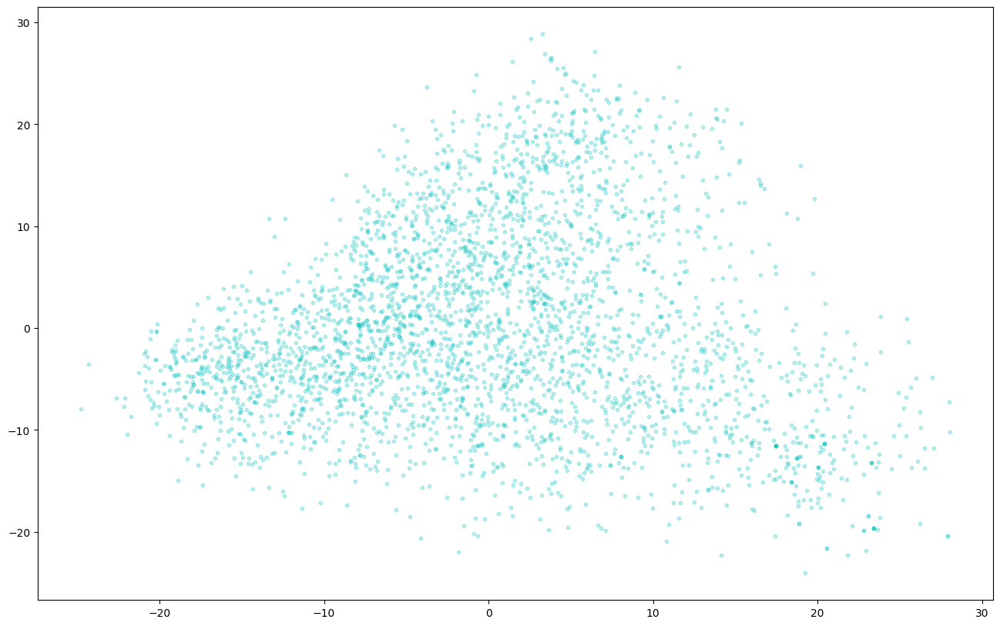

In [20]:
pca = PCA(n_components=100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

fig = plt.subplots(figsize=(16,10))
plt.scatter(x[:, 0], x[:, 1], s=10, c='c', alpha=0.25)

#Résultat non concluants

Réduction de dimension avec _Uniform Manifold Approximation and Projection for Dimension Reduction_ (UMAP)

/Users/lise/anaconda3/envs/YOLO_metal/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


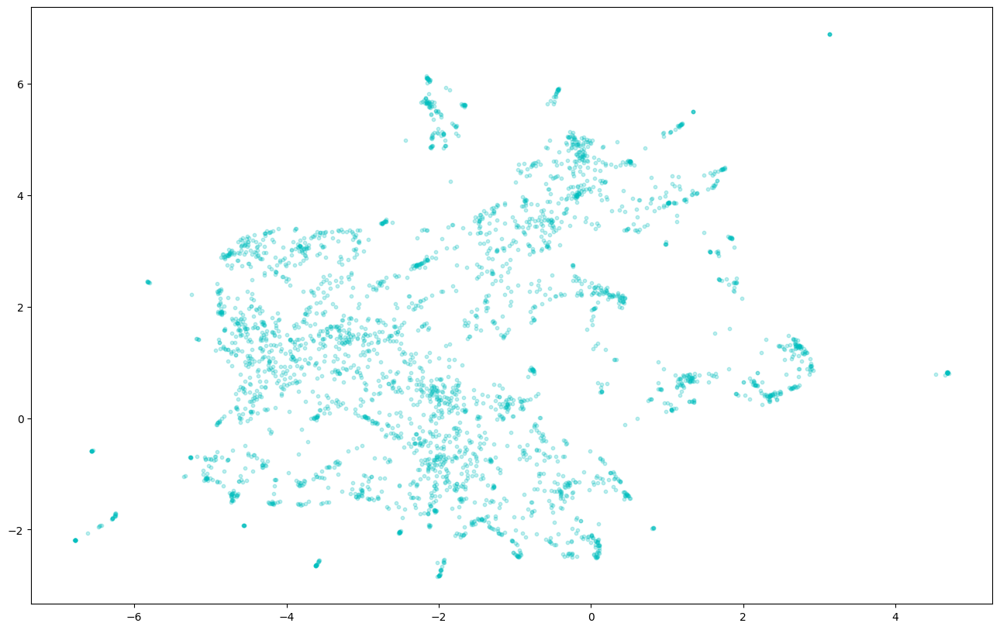

In [60]:
#Algorithme de réduction de dimension pour visualiser les features dans un espace en deux dimensions
x = umap.UMAP(
    n_neighbors=10,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(feat)

fig = plt.subplots(figsize=(16,10))
plt.scatter(x[:, 0], x[:, 1], s=10, c='c', alpha=0.25);

### Visualisation des features individuelles


0: 224x224 Warpfacedcloth 0.98, Weftfacedcloth 0.02, Mesh 0.00, Balancedweave 0.00, Mixedweave 0.00, 75.7ms
Speed: 92.8ms preprocess, 75.7ms inference, 0.2ms postprocess per image at shape (1, 3, 224, 224)
Features shape for ASU001_IMG_0755.jpg: torch.Size([1, 32, 56, 56])


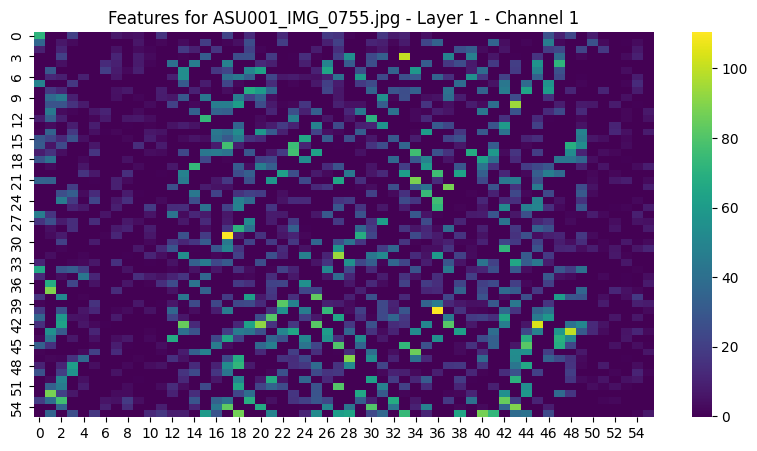

In [61]:
# Fonction pour visualiser les features
def extract_and_plot_features(img_path, layer_index, channel_index=1):

    #features = data[img_name]
    
    img = Image.open(img_path)
    features = extract_features(model, img, layer_index)

        # Print the shape of the features
    print(f"Features shape for {img_path}: {features.shape}")

        # Plot the features as a heatmap for a specific channel
    plt.figure(figsize=(10, 5))
    sns.heatmap(features[0][channel_index].cpu().numpy(), cmap='viridis', annot=False)
    plt.title(f'Features for {img_path} - Layer {layer_index} - Channel {channel_index}')
    plt.show()

image = 'ASU001_IMG_0755.jpg'
extract_and_plot_features(image, layer_index=1)

## Clustering. Deux méthodes : HDBSCAN et KMEANS

In [62]:
cd ../..

/Users/lise/memoire_tech/M2_HN/data


In [63]:
with open("textile_clean.csv") as csv :
    df_textile = pd.read_csv(csv, sep="\t")

In [64]:
df_textile_cluster = df_textile.loc[:, ['ID','period','production site','find site','repository','culture','fabric']]

#Simplification des catégories techniques
for i in df_textile_cluster[['fabric']].columns:
    df_textile_cluster[i].replace("Balanced weave, Weft-faced cloth","Mixed weave",inplace=True)
    df_textile_cluster[i].replace("Warp-faced cloth, Weft-faced cloth","Mixed weave",inplace=True)
    df_textile_cluster[i].replace("Balanced weave, Warp-faced cloth","Mixed weave",inplace=True)
    df_textile_cluster[i].replace("Balanced weave, Warp-faced cloth, Weft-faced cloth","Mixed weave",inplace=True)
    
    df_textile_cluster[i].replace("Transposed warp with multiple interlaced wefts, Warp-faced cloth","Warp-faced cloth",inplace=True)
    df_textile_cluster[i].replace("Plaiting, Warp-faced cloth","Warp-faced cloth",inplace=True)
    df_textile_cluster[i].replace("Crossed warp weave, Warp-faced cloth","Warp-faced cloth",inplace=True)
    df_textile_cluster[i].replace("Crossed warp weave","Warp-faced cloth",inplace=True) #?
    
    df_textile_cluster[i].replace("Plaiting, Weft-faced cloth","Weft-faced cloth",inplace=True)
    df_textile_cluster[i].replace("Twining, Weft-faced cloth","Weft-faced cloth",inplace=True)

    #D'Harcourt (1934) : catégorie qui reprend les fils entrelacés (et non deux couches perpendiculaires) : Tresses ou Nattes ? 
    #Mesh dans la base de données est catégorie fourre-tout (ILCA062 sont poupées avec tissage / certaines pièces sont tricots).
    df_textile_cluster[i].replace("Oblique interlacing","Mesh",inplace=True)
    df_textile_cluster[i].replace("Oblique interlacing, Tubular, Warp-faced cloth","Mesh",inplace=True)
    df_textile_cluster[i].replace("Oblique interlacing, Weft-faced cloth","Mesh",inplace=True)
    df_textile_cluster[i].replace("Oblique interlacing, Warp-faced cloth","Mesh",inplace=True)
    df_textile_cluster[i].replace("Twining","Mesh",inplace=True)
    df_textile_cluster[i].replace("Interknotting","Mesh",inplace=True)
    df_textile_cluster[i].replace("Tubular","Mesh",inplace=True)
    df_textile_cluster[i].replace("Transposed warp with multiple interlaced wefts","Mesh",inplace=True)

/var/folders/nd/kkrd51cn61gfvcghmct5mznm0000gn/T/ipykernel_13074/3114919491.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_textile_cluster[i].replace("Balanced weave, Weft-faced cloth","Mixed weave",inplace=True)
/var/folders/nd/kkrd51cn61gfvcghmct5mznm0000gn/T/ipykernel_13074/3114919491.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediat

In [65]:
#Fonction permettant de visualiser les images dans les clusters
def view_cluster(cluster): #A MODIFIER : ajouter choix des bornes ?
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    print("Nombre d'images dans le cluster :", len(files))
    # only allow up to 99 images to be shown at a time
    if len(files) > 99:
        print(f"Récupération des images 0 à 99 du cluster")
        files = files[0:99]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = Image.open(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')



#Fonction permettant de récupérer un dataframe contenant 
#les informations sur les objets associés aux images
def get_id_info(cluster, save) : 
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    files_list = []

    # plot each image in the cluster
    for index, file in enumerate(files):
        ID = file[0:7] #Récupération de l'identifiant de l'objet dans le nom de l'image
        ID = ID.replace('_', '') #Traitement du cas où l'identifiant à une lettre de moins et un tiret en plus
        files_list.append(ID)
        files_list_unique = list(set(files_list)) #On garde un seul identifiant (même si le cluster contient plusieurs fois le même objet)
    
    print("Nombre d'éléments dans le cluster :", len(files_list_unique))
    
    cluster_df = pd.DataFrame()
    for elt in files_list_unique :
        entry = df_textile_cluster.loc[df_textile_cluster['ID'] == f'ILCA_{elt}']
        entry2 = df_textile_cluster.loc[df_textile_cluster['ID'] == f'ILCA_{elt}_SR'] #Traitement du deuxième cas d'identifiant
        cluster_df = pd.concat([cluster_df,entry])
        cluster_df = pd.concat([cluster_df,entry2])
        
    if save == True : 
        cluster_df.to_csv(f'/Users/lise/memoire_tech/M2/data/cluster_{cluster}.csv', index=False) 
    else : 
        pass
        
    return cluster_df

In [66]:
cd images/images_jpg

/Users/lise/memoire_tech/M2_HN/data/images/images_jpg


### HDBSCAN

#### Tests : 
- Sans indiquer de paramètres, HDBSCAN organise les 3301 images en 159 clusters.
- min_samples=1 --> 266 clusters
- min_cluster_size=10, min_samples=1 --> 136 clusters
- min_samples=1, cluster_selection_epsilon=0.5 --> 9 clusters, dont le 8e qui contient 2852 images
- min_cluster_size=50,min_samples=1, cluster_selection_epsilon=0.5 --> 2 clusters : 1 de 372 et 1 de 2897
- min_cluster_size=10, min_samples=1, cluster_selection_epsilon=0.2 --> 19 clusters : 1 de 2582 éléments
- max_cluster_size=100, min_samples=1, cluster_selection_epsilon=0.2 --> 26 clusters


In [67]:
##Version HDBSCAN du package HDBSCAN
clustering = hdbscan.HDBSCAN(min_cluster_size=10, min_samples=1, cluster_selection_epsilon=0.2).fit(x)

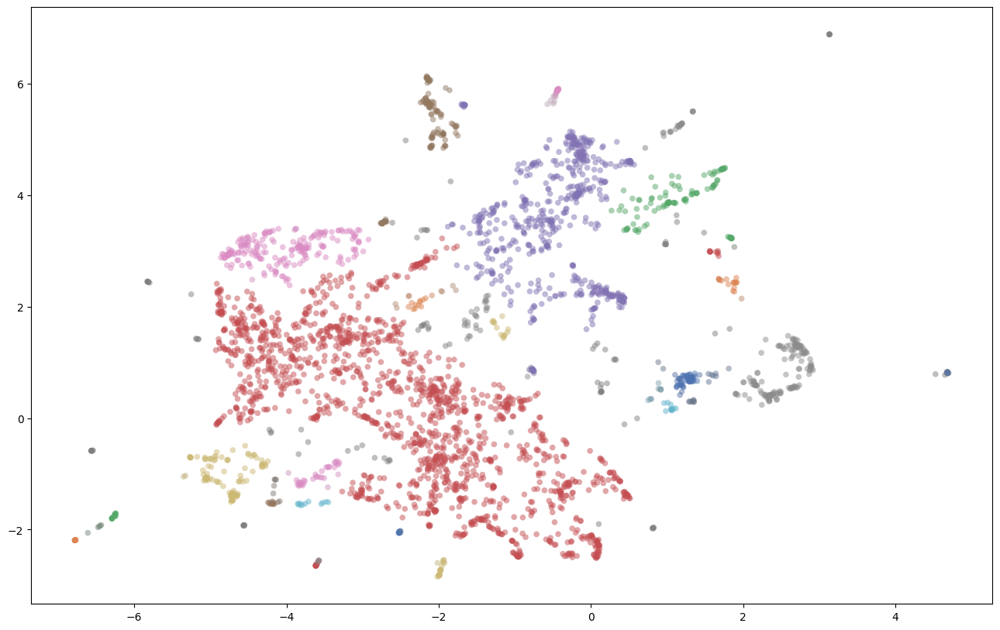

In [68]:
#Visalisation HDBSCAN
fig = plt.subplots(figsize=(16,10))
color_palette = sns.color_palette('deep', 30)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in clustering.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, clustering.probabilities_)]
plt.scatter(*x.T, s=30, linewidth=0, c=cluster_member_colors, alpha=0.5)

In [69]:
# holds the cluster id and the images { id: [images] }
i = 0
groups = {}
filenames = []

for file, cluster in zip(arraynames,clustering.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)
    if cluster == -1:
        filenames.append(file)
    i+=1

print(clustering.labels_)
print(set(clustering.labels_))

#Nombre de cluster : 
print("Nombre de clusters détectés :", len(set(clustering.labels_)))

[26 -1 24 ... 23 23 23]
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, -1}
Nombre de clusters détectés : 30


Nombre d'images dans le cluster : 517
Récupération des images 0 à 99 du cluster


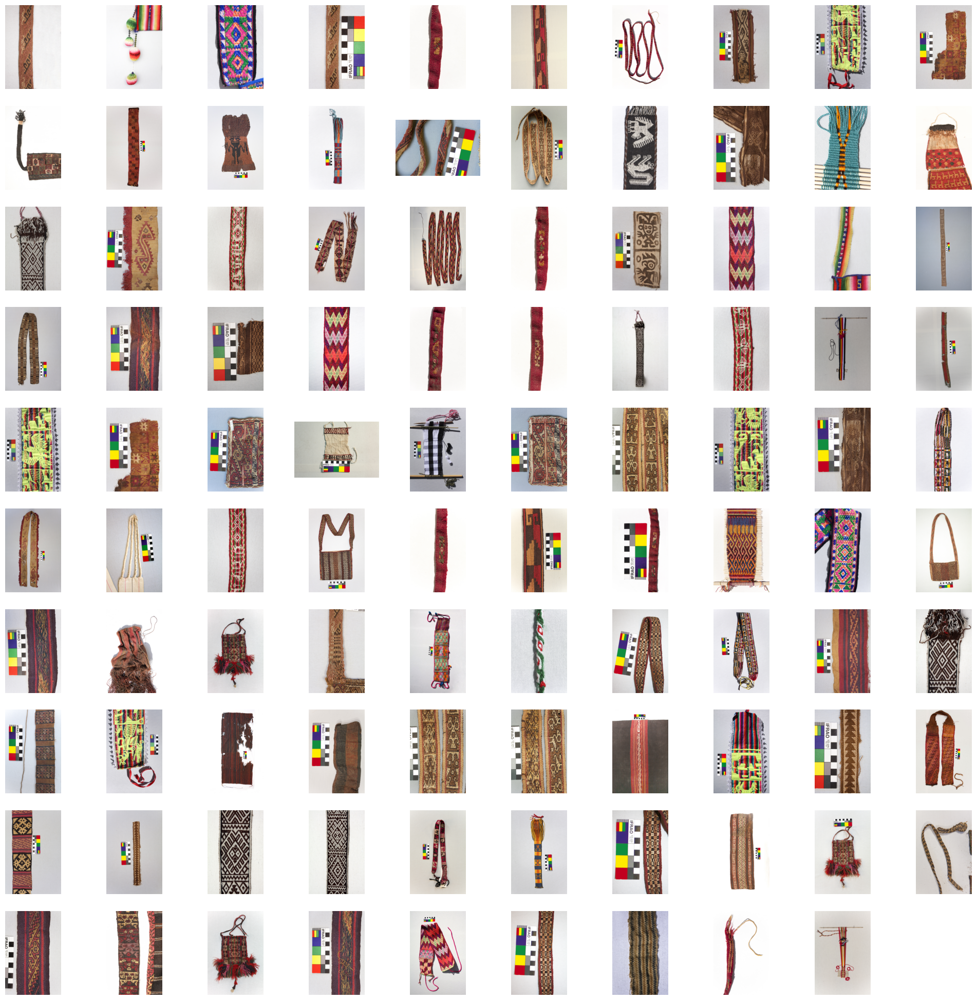

In [70]:
view_cluster(24)

In [71]:
get_id_info(24, save=False)

Nombre d'éléments dans le cluster : 230


,ID,period,production site,find site,repository,culture,fabric
353,ILCA_MEE014A,Republican Period (1825-present),"Bolivia, La Paz, North Altiplano",NaN,"Aymara Language and Culture Institute, website",NaN,Warp-faced cloth
369,ILCA_MEE030,Republican Period (1825-present),"Bolivia, La Paz, North Altiplano",NaN,"Aymara Language and Culture Institute, website",NaN,Warp-faced cloth
117,ILCA_BML113,Late Horizon (1470-1535 AD),"Nasca, Peru, South coast","Nasca, Peru, South coast","British Museum, website",Inka,Warp-faced cloth
66,ILCA_BML062,Late Intermediate (1000-1470 AD),"Central coast, Chancay, Peru","Central coast, Chancay, Peru","British Museum, website",Chancay,Mixed weave
366,ILCA_MEE027,Republican Period (1825-present),"Bolivia, La Paz, North Altiplano",NaN,"Aymara Language and Culture Institute, website",NaN,Warp-faced cloth
...,...,...,...,...,...,...,...
358,ILCA_MEE019,Republican Period (1825-present),"Bolivia, La Paz, North Altiplano",NaN,"Aymara Language and Culture Institute, website",NaN,Warp-faced cloth
518,ILCA_MMA099,Late Intermediate (1000-1470 AD),"Peru, South coast, Western valleys, Peru",Chile,Archaeological and Anthropological Museum of S...,Chiribaya,Warp-faced cloth
132,ILCA_BML131,Republican Period (1825-present),"Bolivia, Caiza, Southern Interandean Valleys","Bolivia, Southern Interandean Valleys","British Museum, website",Quechua-South Qharaqhara,Warp-faced cloth
78,ILCA_BML074,Late Intermediate (1000-1470 AD),"Central coast, Chancay, Peru","Central coast, Peru","British Museum, website",Chancay,Weft-faced cloth


<Figure size 2500x2500 with 0 Axes>

### KMEANS

In [72]:
# cluster feature vectors
clustering = KMeans(n_clusters=30, random_state=22).fit(x)

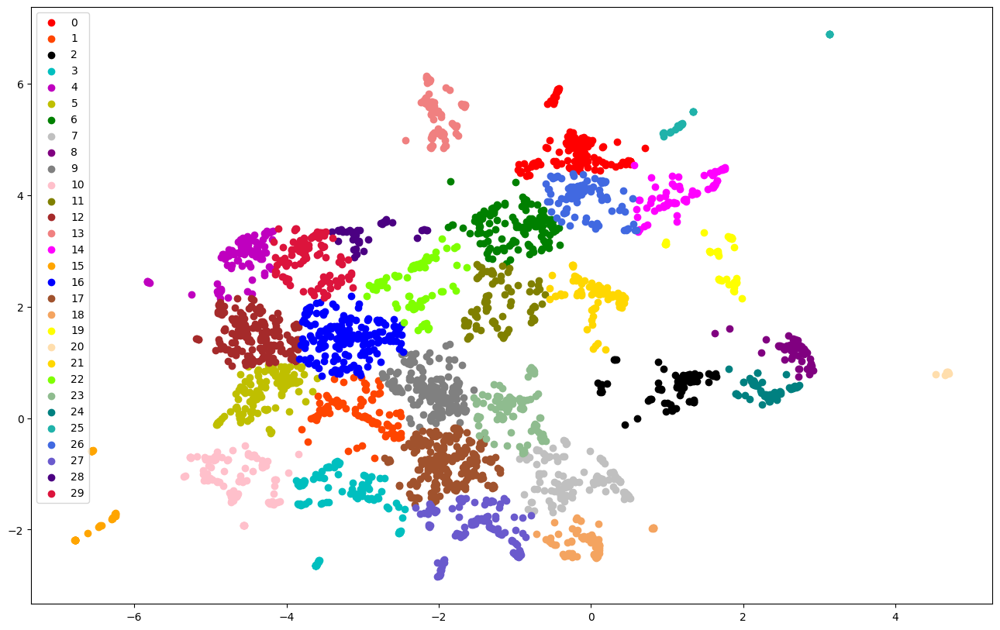

In [73]:
#Visualisation KMEANS
label = clustering.labels_
u_labels = np.unique(label)

plt.figure(figsize=(16,10))


colors = itertools.cycle(["r", "orangered", "k", "c", "m", "y", "g", "silver", "purple", "gray", 
"pink", "olive", "brown", "lightcoral", "fuchsia","orange", "b" ,"sienna" , "sandybrown" ,
 "yellow", "navajowhite", "gold" ,"chartreuse" , "darkseagreen" ,"teal" , "lightseagreen", "royalblue" , "slateblue" , "indigo", "crimson"])
 
#plotting the results:
for i,c in zip(u_labels, colors):
    plt.scatter(x[label == i , 0] , x[label == i , 1] , label = i, color=c)

plt.legend()
plt.show()

In [74]:
# holds the cluster id and the images { id: [images] }
i = 0
groups = {}
filenames = []

for file, cluster in zip(arraynames,clustering.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)
    if cluster == -1:
        filenames.append(file)
    i+=1

print(clustering.labels_)
print(set(clustering.labels_))

#Nombre de cluster : 
print("Nombre de clusters détectés :", len(set(clustering.labels_)))

[ 3 17  0 ...  9  7 16]
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29}
Nombre de clusters détectés : 30


Nombre d'images dans le cluster : 89


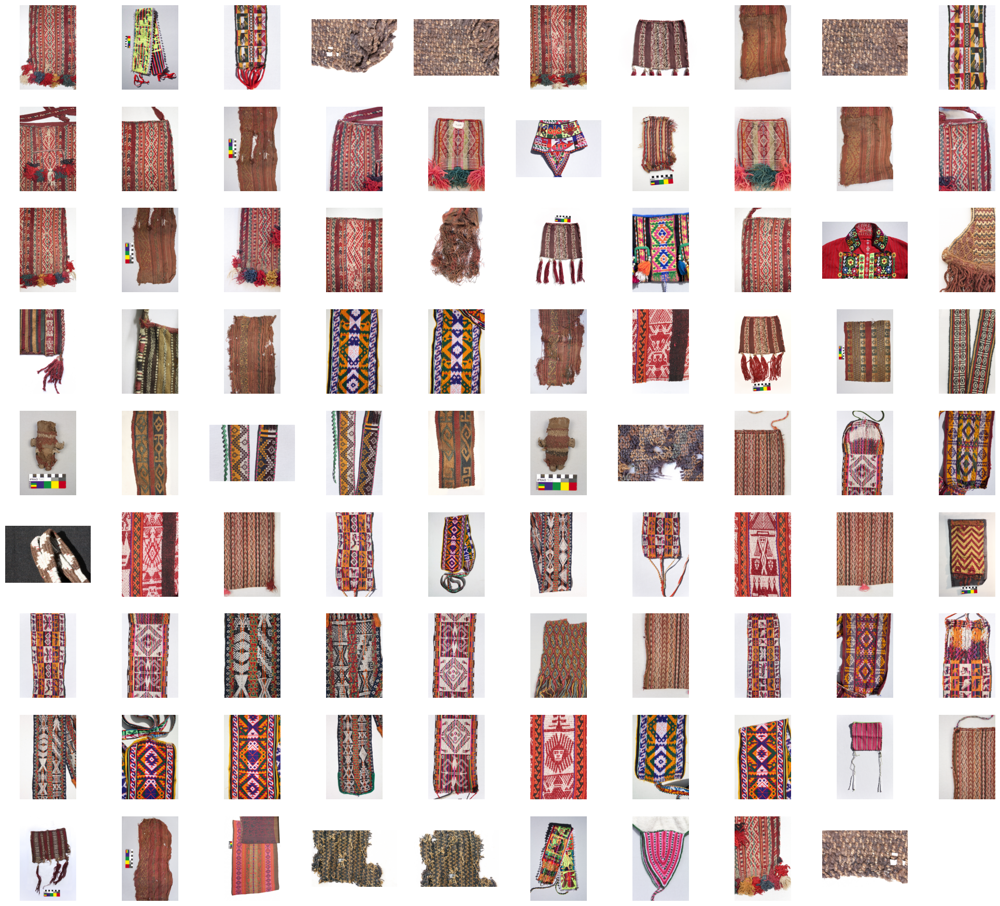

In [75]:
view_cluster(22)

In [76]:
get_id_info(22, save=False)

Nombre d'éléments dans le cluster : 39


,ID,period,production site,find site,repository,culture,fabric
184,ILCA_ILCA011,Republican Period (1825-present),"Bolivia, Mollo, Northern Interandean Valleys",NaN,"Aymara Language and Culture Institute, website",Quechua-Aymara-Mollo,Warp-faced cloth
196,ILCA_ILCA023,Republican Period (1825-present),"Ayllu Qaqachaka, Bolivia, Central Altiplano",NaN,"Aymara Language and Culture Institute, website",Aymara-Quechua-Asanaque,Warp-faced cloth
27,ILCA_BML020,Late Intermediate (1000-1470 AD),"Ica, Peru, South coast","Ica, Peru, South coast","British Museum, website",Ica,Warp-faced cloth
247,ILCA_ILCA074,Republican Period (1825-present),"Bolivia, North Altiplano",NaN,"Aymara Language and Culture Institute, website",Aymara-Omasuyos,Weft-faced cloth
194,ILCA_ILCA021,Republican Period (1825-present),"Ayllu Qaqachaka, Bolivia, Central Altiplano",NaN,"Aymara Language and Culture Institute, website",Aymara-Quechua-Asanaque,Warp-faced cloth
610,ILCA_MSF067,Late Intermediate (1000-1470 AD),"Peru, South sierra",NaN,"National Museum of Ethnography and Folklore, w...",NaN,Warp-faced cloth
106,ILCA_BML102,Late Horizon (1470-1535 AD),"Chuquibamba, Peru, South coast","Peru, South coast","British Museum, website",Provincial Inca,Warp-faced cloth
67,ILCA_BML063,Late Intermediate (1000-1470 AD),"Central coast, Chancay, Peru",Peru,"British Museum, website",Chancay,Warp-faced cloth
281,ILCA_MAN001,Middle Horizon (600-1000 AD),"Bolivia, Central Interandean Valleys, Mojocoya","Bolivia, Central Interandean Valleys, Mojocoya","Anthropological Museum, Universidad Real Mayor...",NaN,Mixed weave
26,ILCA_BML019,Late Intermediate (1000-1470 AD),"Ica, Peru, South coast","Peru, South coast","British Museum, website",Ica,Warp-faced cloth


<Figure size 2500x2500 with 0 Axes>